In [1]:
import numpy as np, pandas as pd
import os, phate, anndata, scprep
import pickle
from glob import glob
import stream as st
import warnings

import kmapper as km
from sklearn import preprocessing
from kmap_sup import GM_extend, KM_extend
from sklearn.cluster import KMeans, DBSCAN
from sklearn import preprocessing
import math
from flow_util import Flow_Util
from flowio.create_fcs import create_fcs
import flowutils

from tqdm import tqdm
from scipy.spatial import ConvexHull
from scipy.spatial import Delaunay
from pyhull.convex_hull import ConvexHull as convexhull1
from skimage.draw import ellipse
from skimage.measure import find_contours, approximate_polygon, subdivide_polygon
import itertools
import xgboost as xgb
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import operator

from IPython.display import display
pd.options.display.max_columns = None

%load_ext autoreload
%autoreload 2
warnings.filterwarnings('ignore')
phate_operator = phate.PHATE(n_jobs=15)
import umap

fit = umap.UMAP()

/home/anle/anaconda3/envs/pj1/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:17: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import Index as PandasIndex


In [ ]:
fut = Flow_Util()
mouse_list = ['150-1','152-3','158-1','158-5','162-2']
df_list = []
for mouse in mouse_list:
    print("Read in data for " + mouse)
    dat_path = "../../data/newData/"+'Mouse ID '+mouse+'/'
    id2_path = dat_path+'/'+mouse+"-2.fcs"
    id3_path = dat_path+'/'+mouse+"-3.fcs"
    id4_path = dat_path+'/'+mouse+"-4.fcs"
    id2 = fut.read_fcs(id2_path)
    print("start reading")
    id3 = fut.read_fcs(id3_path)
    id4 = fut.read_fcs(id4_path)
    id4["gate"] = 4
    print("preparing parameters for merging")
    merge_col = fut.chan_name[-1:]
    for col in fut.chan_name[:-2]:
        id2[col+"_m"] = [np.round(i) for i in id2[col]]
        id3[col+"_m"] = [np.round(i) for i in id3[col]]
        id4[col+"_m"] = [np.round(i) for i in id4[col]]
        merge_col += [col+"_m"]
    print("start merging for id3")
    idm = id4[merge_col+["gate"]]
    id3 = id3.merge(idm, how = "left", on = merge_col)
    id3.gate.fillna(5, inplace = True)
    print("start merging for id2")
    idm = id3[merge_col+["gate"]]
    id2 = id2.merge(idm, how = "left", on = merge_col)
    id2.gate.fillna(6, inplace = True)
    print("exporting data")
    id2["id"] = [0 if i==1 else 1 if i==2 else 2 if i==3 else 3 if j==4 else 4 if j==5 else 5 for i,j in zip(id2.AnsFlg, id2.gate)]
    id3["id"] = [0 if i==1 else 1 if i==2 else 2 if i==3 else 3 if j==4 else 4 for i,j in zip(id3.AnsFlg, id3.gate)]
    out_col = fut.chan_name[:-2] + ["id"]
    id2 = id2[out_col]
    id3 = id3[out_col]
    out_opt = fut.optn_name[:-2] + ["id & AnsFlg combined"]
    id2_path = dat_path+'/'+mouse+"-2_c.fcs"
    id3_path = dat_path+'/'+mouse+"-3_c.fcs"
    with open(id2_path, 'wb') as fh:
        create_fcs(event_data = id2.values.reshape(-1,), channel_names=out_col, file_handle=fh, opt_channel_names=out_opt)
    with open(id3_path, 'wb') as fh:
        create_fcs(event_data = id3.values.reshape(-1,), channel_names=out_col, file_handle=fh, opt_channel_names=out_opt)

In [ ]:
fut = Flow_Util()
df_list = []

path = "../../data/human data/hCB/1_Whole_cell_data/Patient_ID-021/86_down.fcs"
temp = fut.read_fcs(path)
path = "../../data/human data/hCB/3_enriched_HSC/Patient_ID-021/export_export_export_50786_Cells_CD34+_enriched_HSC.fcs"
temp1 = fut.read_fcs(path)
temp1["id"] = 1
merge_col = fut.chan_name[:-1]
temp1 = temp1[merge_col + ['id']]
temp = temp.merge(temp1, how="left", on=merge_col)
temp.id.fillna(0, inplace=True)
df_list.append(temp)

path = "../../data/human data/hCB/1_Whole_cell_data/Patient_ID-021/88_down.fcs"
temp = fut.read_fcs(path)
path = "../../data/human data/hCB/3_enriched_HSC/Patient_ID-021/export_export_export_50788_Cells_CD34+_enriched_HSC.fcs"
temp1 = fut.read_fcs(path)
temp1["id"] = 1
merge_col = fut.chan_name[:-1]
temp1 = temp1[merge_col + ['id']]
temp = temp.merge(temp1, how="left", on=merge_col)
temp.id.fillna(0, inplace=True)
df_list.append(temp)

path = "../../data/human data/hCB/1_Whole_cell_data/Patient_ID-021/90_down.fcs"
temp = fut.read_fcs(path)
path = "../../data/human data/hCB/3_enriched_HSC/Patient_ID-021/export_export_export_50790_Cells_CD34+_enriched_HSC.fcs"
temp1 = fut.read_fcs(path)
temp1["id"] = 1
merge_col = fut.chan_name[:-1]
temp1 = temp1[merge_col + ['id']]
temp = temp.merge(temp1, how="left", on=merge_col)
temp.id.fillna(0, inplace=True)
df_list.append(temp)

df_list = pd.concat(df_list)
df_list = df_list[merge_col + ['id','density']]
df_list.reset_index(inplace=True)
df_list.drop(columns=["index"], inplace=True)

X_input = preprocessing.scale(df_list[merge_col])
df_list.head()

In [7]:
dat_path = "../../data/newData/"+'ID-3 for An''/20.fcs'


for i in range(len(fut.chan_name)):
    print(fut.chan_name[i], " : ", fut.optn_name[i])

FSC_A  :  column FSC_A from dataset
FSC_H  :  column FSC_H from dataset
FSC_W  :  column FSC_W from dataset
SSC_A  :  column SSC_A from dataset
SSC_H  :  column SSC_H from dataset
SSC_W  :  column SSC_W from dataset
SYTOX_RED_APC  :  column SYTOX_RED_APC from dataset
CKIT_APC_CY7  :  column CKIT_APC_CY7 from dataset
CD34_FITC  :  column CD34_FITC from dataset
FCGR_IL7R_A700  :  column FCGR_IL7R_A700 from dataset
SCA1_BUV395  :  column SCA1_BUV395 from dataset
SLAMF1_BV421  :  column SLAMF1_BV421 from dataset
CD11b_BV711  :  column CD11b_BV711 from dataset
LINEAGE_BUV737  :  column LINEAGE_BUV737 from dataset
MCHERRY  :  column MCHERRY from dataset
FLK2_PERCP_CY55  :  column FLK2_PERCP_CY55 from dataset
id  :  id & AnsFlg combined
density  :  


# Data Preprocessing

In [2]:
fut = Flow_Util()
mouse_list = ['150-1','152-3','158-1','158-5','162-2']
df_list = []
for mouse in mouse_list:
    #dat_path = "../../data/newData/"+'Mouse ID '+mouse+'/'+mouse+'-3_c.fcs'
    #temp1 = fut.read_fcs(dat_path)
    #dep_col = fut.chan_name
    dat_path = "../../data/newData/"+'Mouse ID '+mouse+'/gate_3_down.fcs'
    temp = fut.read_fcs(dat_path)
    dep_col = fut.chan_name
    #temp = temp.merge(temp1, how='left', on = dep_col)
    df_list.append(temp)
dep_col = fut.chan_name[:-2]
df_list = pd.concat(df_list)
df_list = df_list[dep_col + ['id','density']]
df_list.reset_index(inplace=True)
df_list.drop(columns=["index"], inplace=True)

pd.crosstab(df_list.id, columns="count")

col_0,count
id,
0.0,331
1.0,1081
2.0,1775
3.0,22796
4.0,224321


In [6]:
print(list(df_list.columns))

['FSC_A', 'FSC_H', 'FSC_W', 'SSC_A', 'SSC_H', 'SSC_W', 'SYTOX_RED_APC', 'CKIT_APC_CY7', 'CD34_FITC', 'FCGR_IL7R_A700', 'SCA1_BUV395', 'SLAMF1_BV421', 'CD11b_BV711', 'LINEAGE_BUV737', 'MCHERRY', 'FLK2_PERCP_CY55', 'id', 'density']


In [37]:
fut = Flow_Util()
mouse_list = ['150-1']
dat_path = "../../data/newData/"+'Mouse ID 150-1/150-1-3_c.fcs'
df_list = fut.read_fcs(dat_path)
dep_col = fut.chan_name
dep_col = fut.chan_name[:-2]
df_list = df_list[dep_col + ['id']]
df_list.reset_index(inplace=True)
df_list.drop(columns=["index"], inplace=True)

pd.crosstab(df_list.id, columns="count")

col_0,count
id,
0.0,60
1.0,320
2.0,850
3.0,15612
4.0,137650


In [8]:
#dep_col.remove('MCHERRY')
dep_col

['FSC_A',
 'FSC_H',
 'FSC_W',
 'SSC_A',
 'SSC_H',
 'SSC_W',
 'SYTOX_RED_APC',
 'CKIT_APC_CY7',
 'CD34_FITC',
 'FCGR_IL7R_A700',
 'SCA1_BUV395',
 'SLAMF1_BV421',
 'CD11b_BV711',
 'LINEAGE_BUV737',
 'MCHERRY',
 'FLK2_PERCP_CY55']

In [9]:
len(dep_col)

16

In [3]:
X_input = preprocessing.scale(df_list[dep_col])
save_path = "../../output/mg3/"

In [4]:
dep_col1 = dep_col+["density"]

# Dimensionality Reduction: PHATE

In [5]:
if not os.path.exists(save_path):
    os.makedirs(save_path)
if not os.path.exists(save_path+"stream/"):
    os.makedirs(save_path+"stream/")
phate_operator = phate.PHATE(n_jobs=-2,knn=50)
Y_phate = phate_operator.fit_transform(X_input)
phate_operator.set_params(n_components=10)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate10d_full.npy",Y_phate_3d)
phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate3d_full.npy",Y_phate_3d)
Y_phate_3d = np.load(save_path + "phate3d_full.npy")

Calculating PHATE...
  Running PHATE on 250304 observations and 16 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1331.78 seconds.
    Calculating affinities...
    Calculated affinities in 8.97 seconds.
  Calculated graph and diffusion operator in 1343.84 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 133.32 seconds.
    Calculating KMeans...
    Calculated KMeans in 45.95 seconds.
  Calculated landmark operator in 185.87 seconds.
  Calculating optimal t...
    Automatically selected t = 24
  Calculated optimal t in 1.74 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.30 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.55 seconds.
Calculated PHATE in 1537.36 seconds.
Calculating metric MDS...
Calculated metric MDS in 168.31 seconds.
Calculating metric MDS...
Calculated metric MDS in 20.60 seconds.


In [12]:
dep_col.remove('MCHERRY')
X_input = preprocessing.scale(df_list[dep_col])
Y_phate = phate_operator.fit_transform(X_input)
phate_operator.set_params(n_components=10)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate10d_drop_mcherry.npy",Y_phate_3d)
phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate3d_drop_mcherry.npy",Y_phate_3d)

Calculating PHATE...
  Running PHATE on 250304 cells and 15 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 844.74 seconds.
    Calculating affinities...
    Calculated affinities in 38.59 seconds.
  Calculated graph and diffusion operator in 888.63 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 341.74 seconds.
    Calculating KMeans...
    Calculated KMeans in 68.65 seconds.
  Calculated landmark operator in 417.87 seconds.
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 1.38 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.45 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 28.95 seconds.
Calculated PHATE in 1337.48 seconds.
Calculating metric MDS...
Calculated metric MDS in 258.57 seconds.
Calculating metric MDS...
Calculated metric MDS in 27.67 seconds.


In [7]:
from matplotlib import cm
import matplotlib as mpl
red = cm.get_cmap('Reds', 9)
blue = cm.get_cmap('Blues', 9)
cmap_t = mpl.colors.ListedColormap(np.concatenate([red(np.linspace(1, 0, 3)),blue(np.linspace(0, 1, 2))]))
Y_phate_3d = np.load(save_path + "phate3d_full.npy")
scprep.plot.rotate_scatter3d(Y_phate_3d,c=df_list.id.astype(int).values,filename = save_path+"/phate_full.gif", figsize=(15,10),  cmap=cmap_t,ticks=False, label_prefix="PHATE")
plt.close("all")

In [8]:
save_path

'../../output/mg3/'

In [30]:
from matplotlib import cm
import matplotlib as mpl
red = cm.get_cmap('Reds', 9)
blue = cm.get_cmap('Blues', 9)
cmap_t = mpl.colors.ListedColormap(np.concatenate([blue([0.75]),red(np.linspace(0, 1, 9))]))
df_list["check"] = [0 if i<200 else 1 if i<300 else 2 if i<500 else 3 if i<1000 else 4 if i<2000 
                        else 5 if i<5000 else 6 if i<10000 else 7 if i<50000 else 8 if i<100000 
                        else 9 for i in df_list['MCHERRY']]
Y_phate_3d = np.load(save_path +"phate3d_drop_mcherry.npy")
temp = [np.concatenate([Y_phate_3d[:,0],[0]*10]),np.concatenate([Y_phate_3d[:,1],[0]*10]),np.concatenate([Y_phate_3d[:,2],[0]*10])]
temp1 = np.concatenate([df_list.check.values,[0,1,2,3,4,5,6,7,8,9]])
scprep.plot.rotate_scatter3d(temp,c=temp1,filename = save_path+"/phate_drop_mcherry_mcherry.mp4", figsize=(15,10), cmap=cmap_t,ticks=False, label_prefix="PHATE")
plt.close("all")

In [33]:
from matplotlib import cm
import matplotlib as mpl
red = cm.get_cmap('Reds', 9)
blue = cm.get_cmap('Blues', 9)
cmap_t = mpl.colors.ListedColormap(np.concatenate([blue([0.75]),red(np.linspace(0, 1, 9))]))
def draw_param(name, sav_name):
    df_list["check"] = [0 if i<200 else 1 if i<300 else 2 if i<500 else 3 if i<1000 else 4 if i<2000 
                        else 5 if i<5000 else 6 if i<10000 else 7 if i<50000 else 8 if i<100000 
                        else 9 for i in df_list[name]]
    Y_phate_3d = np.load(save_path +"phate3d_br1_full.npy")
    temp = [np.concatenate([Y_phate_3d[:,0],[0]*10]),np.concatenate([Y_phate_3d[:,1],[0]*10]),np.concatenate([Y_phate_3d[:,2],[0]*10])]
    temp1 = np.concatenate([df_list.check.values,[0,1,2,3,4,5,6,7,8,9]])
    scprep.plot.rotate_scatter3d(temp,c=temp1,filename = save_path+"/phate_br_"+sav_name+".mp4", figsize=(15,10), cmap=cmap_t,ticks=False, label_prefix="PHATE")
    plt.close("all")
for n, sn in zip(['SYTOX_RED_APC','CKIT_APC_CY7','CD34_FITC','FCGR_IL7R_A700','SCA1_BUV395', 'MCHERRY',
                  'CD11b_BV711','LINEAGE_BUV737','FLK2_PERCP_CY55', 'SLAMF1_BV421'], 
                 ['sytoxred', 'ckit', 'cd34', 'il7r', 'sca1', 'mcherry', 'cd11b', 'lineage', 'flk2', 'slam']):
    draw_param(n, sn)

# Graph Clustering: KMAPPER

In [ ]:
Y_phate_3d = np.load(save_path + "phate3d_1.npy")
mapper = KM_extend(verbose=2)
graph = mapper.map_extend(Y_phate_3d, X_input, cover=km.Cover(n_cubes=50, perc_overlap=0.5), 
                   clusterer = GM_extend(n_components = 1))
with open(save_path + 'graph_t1.p', 'wb') as fp:
    pickle.dump(graph , fp, protocol=pickle.HIGHEST_PROTOCOL)

In [43]:
import sklearn
mapper = KM_extend(verbose=2)
mapper1 = km.KeplerMapper(verbose=2)
lens1 = mapper1.fit_transform(X_input, projection=[0])
lens2 = mapper1.fit_transform(X_input, projection=["std"])
projected_data = np.c_[lens1, lens2]
projected_data.shape

KeplerMapper()
..Composing projection pipeline of length 1:
	Projections: [0]
	Distance matrices: False
	Scalers: MinMaxScaler(copy=True, feature_range=(0, 1))
..Projecting on data shaped (154492, 15)

..Projecting data using: [0]

..Scaling with: MinMaxScaler(copy=True, feature_range=(0, 1))

..Composing projection pipeline of length 1:
	Projections: std
	Distance matrices: False
	Scalers: MinMaxScaler(copy=True, feature_range=(0, 1))
..Projecting on data shaped (154492, 15)

..Projecting data using: std

..Scaling with: MinMaxScaler(copy=True, feature_range=(0, 1))



(154492, 2)

In [44]:
graph = mapper1.map(projected_data, X_input, cover=km.Cover(n_cubes=10,perc_overlap=0.5),
                    clusterer=sklearn.cluster.KMeans(n_clusters=1))

Mapping on data shaped (154492, 15) using lens shaped (154492, 2)

Minimal points in hypercube before clustering: 1
Creating 100 hypercubes.
   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 clusters.

   > Found 1 cluste

In [45]:
temp = np.array([1 if i<1 else 0 for i in df_list.id])
check = mapper1.visualize(graph, path_html="mouse.html",custom_tooltips = temp,color_function =temp,
                 title="Mouse Sample")

Wrote visualization to: mouse.html


In [ ]:
Y_phate_3d = np.load(save_path + "phate3d_1.npy")
graph = mapper.map_extend(Y_phate_3d, X_input, cover=km.Cover(n_cubes=10, perc_overlap=0.5), 
                   clusterer = GM_extend(n_components = 3))
mapper1 = km.KeplerMapper(verbose=2)
html = mapper1.visualize(graph, path_html="check1.html", color_function=df_list.id.values, 
                         custom_tooltips=df_list.id.values)

In [71]:
graph = mapper.map_extend(Y_phate_3d, X_input, cover=km.Cover(n_cubes=5, perc_overlap=0.2), 
                   clusterer = GM_extend(n_components = 3))
mapper1 = km.KeplerMapper(verbose=2)
html = mapper1.visualize(graph, path_html="check1.html", color_function=df_list.id.values, 
                         custom_tooltips=df_list.id.values)

Mapping on data shaped (250304, 16) using lens shaped (250304, 3)

Minimal points in hypercube before clustering: 50
Creating 125 hypercubes.
Cube_0 is empty.

Initialization 0
  Iteration 10	 time lapse 0.02080s	 ll change 0.00677
Initialization converged: True	 time lapse 0.03017s	 ll -2.88633
   > Found 3 clusters in hypercube 1.
Cube_2 is empty.

Initialization 0
  Iteration 10	 time lapse 0.04821s	 ll change 0.00261
Initialization converged: True	 time lapse 0.05817s	 ll 3.43646
   > Found 3 clusters in hypercube 3.
Initialization 0
  Iteration 10	 time lapse 0.22262s	 ll change 0.00194
Initialization converged: True	 time lapse 0.25746s	 ll -0.55010
   > Found 3 clusters in hypercube 4.
Initialization 0
  Iteration 10	 time lapse 0.14957s	 ll change 0.05039
  Iteration 20	 time lapse 0.10884s	 ll change 0.00369
Initialization converged: True	 time lapse 0.32160s	 ll -2.11643
   > Found 3 clusters in hypercube 5.
Initialization 0
Initialization converged: True	 time lapse 0.00324s

# Lineage Tree: STREAM

In [7]:
with open(save_path + 'graph_1.p', 'rb') as fp:
    graph = pickle.load(fp)
Y_phate_3d = np.load(save_path + "phate10d_1.npy")
df_list['p1_0'] = Y_phate_3d[:,0]
df_list['p1_1'] = Y_phate_3d[:,1]
df_list['p1_2'] = Y_phate_3d[:,2]
df_list['p1_3'] = Y_phate_3d[:,3]
df_list['p1_4'] = Y_phate_3d[:,4]
df_list['p1_5'] = Y_phate_3d[:,5]
df_list['p1_6'] = Y_phate_3d[:,6]
df_list['p1_7'] = Y_phate_3d[:,7]
df_list['p1_8'] = Y_phate_3d[:,8]
df_list['p1_9'] = Y_phate_3d[:,9]

In [8]:
out = {}
out["cell_name"] = []
df_list["cell_1"] = 0
out_col = dep_col + ['p1_0','p1_1','p1_2','p1_3','p1_4','p1_5','p1_6','p1_7','p1_8','p1_9','id','density',"hsc"]
for i in out_col:
    out[i] = []
for key, item in tqdm(graph["nodes"].items()):
    out['cell_name'].append(key)
    temp = df_list.iloc[item]
    df_list.loc[item,'cell_1'] = key
    for col_name in out_col:
        out[col_name].append(temp[col_name].mean())
out = pd.DataFrame(out)
out.fillna(0, inplace=True)
out["id"] = [np.round(i) for i in out.id]
out.to_csv(save_path + "g3_1_out.csv",index=None)

100%|██████████| 13642/13642 [03:37<00:00, 49.54it/s]


In [9]:
dep_col1 = dep_col + ['density',"hsc"]
out1 = out[dep_col1]
#out1[dep_col1] = preprocessing.QuantileTransformer().fit_transform(out[dep_col1])

out1.to_csv(save_path + "g3_1_dep.csv", index=None)
out1 = out[["id"]]
out1.to_csv(save_path + "g3_1_lab.csv", index=None,header=None)
out1 = {}
out1["p1_0"] = out["p1_0"]
out1["p1_1"] = out["p1_1"]
out1["p1_2"] = out["p1_2"]
out1["p1_3"] = out["p1_3"]
out1["p1_4"] = out["p1_4"]
out1["p1_5"] = out["p1_5"]
out1["p1_6"] = out["p1_6"]
out1["p1_7"] = out["p1_7"]
out1["p1_8"] = out["p1_8"]
out1["p1_9"] = out["p1_9"]
out1 = pd.DataFrame(out1)
out1.to_csv(save_path + "g3_1_dr.csv", index=None)

Trying to set attribute `.obs` of view, making a copy.


No cell color file is provided, random color is generated for each cell label


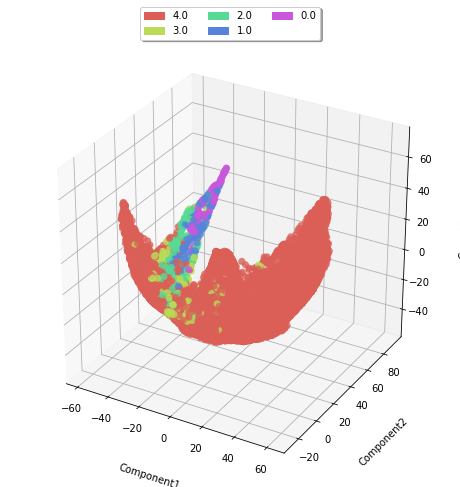

In [10]:
ada1 = anndata.read_csv(save_path + "g3_1_dep.csv")

adata = ada1[:,dep_col1]
st.add_cell_labels(adata,file_name=save_path + "g3_1_lab.csv")
st.add_cell_colors(adata)
adata.uns['workdir'] = save_path + 'stream'

temp = pd.read_csv(save_path + "g3_1_dr.csv")
#temp = pd.read_csv("tsne_dim4.csv")
adata.obsm['X_dr'] = temp[["p1_0","p1_1","p1_2","p1_3","p1_4","p1_5","p1_6","p1_7","p1_8","p1_9"]].values
#adata.obsm['X_dr'] = temp[["dr3_0","dr3_1","dr3_2"]].values

adata.uns["experiment"] = 'rna-seq'
adata.raw = adata

st.plot_dimension_reduction(adata,n_components=3)

Trying to set attribute `.obs` of view, making a copy.


No cell label file is provided, 'unknown' is used as the default cell labels
No cell color file is provided, random color is generated for each cell label


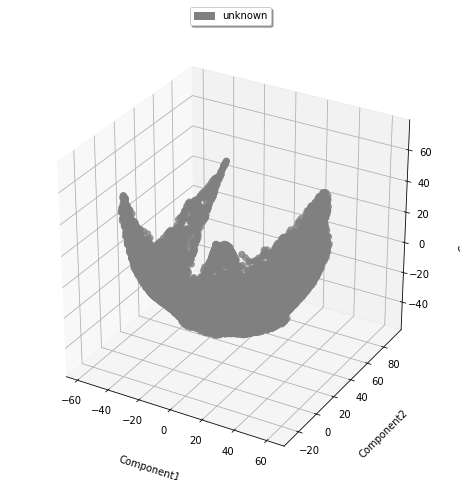

In [18]:
ada1 = anndata.read_csv(save_path + "g3_1_dep.csv")

adata = ada1[:,dep_col1]
st.add_cell_labels(adata)
st.add_cell_colors(adata)
adata.uns['workdir'] = save_path + 'stream'

temp = pd.read_csv(save_path + "g3_1_dr.csv")
#temp = pd.read_csv("tsne_dim4.csv")
adata.obsm['X_dr'] = temp[["p1_0","p1_1","p1_2","p1_3","p1_4","p1_5","p1_6","p1_7","p1_8","p1_9"]].values
#adata.obsm['X_dr'] = temp[["dr3_0","dr3_1","dr3_2"]].values

adata.uns["experiment"] = 'rna-seq'
adata.raw = adata

st.plot_dimension_reduction(adata,n_components=3)

In [1]:
st.elastic_principal_graph(adata,epg_n_nodes=50)
st.elastic_principal_graph(adata,epg_alpha=0.02,epg_mu=0.05,epg_lambda=0.01)

st.shift_branching(adata)
st.extend_elastic_principal_graph(adata)

NameError: name 'st' is not defined

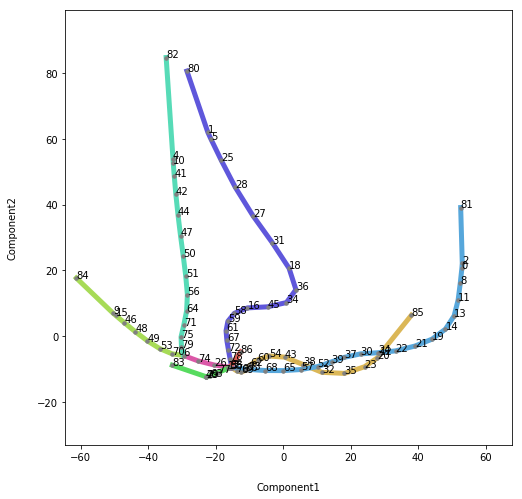

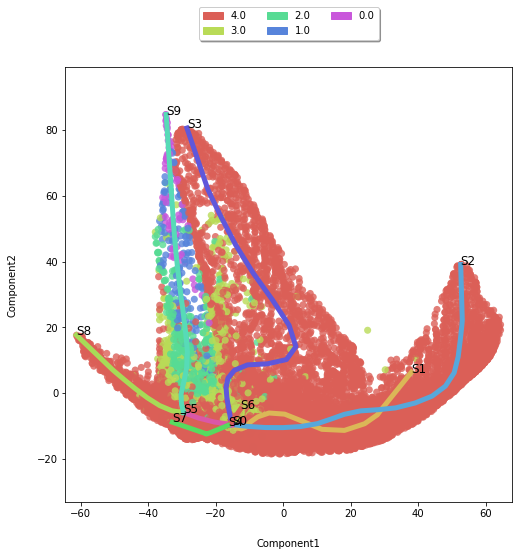

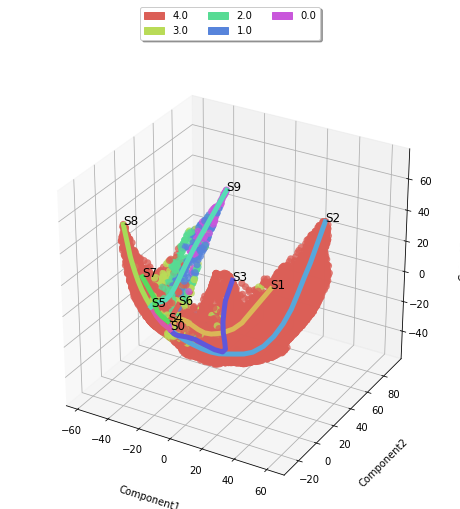

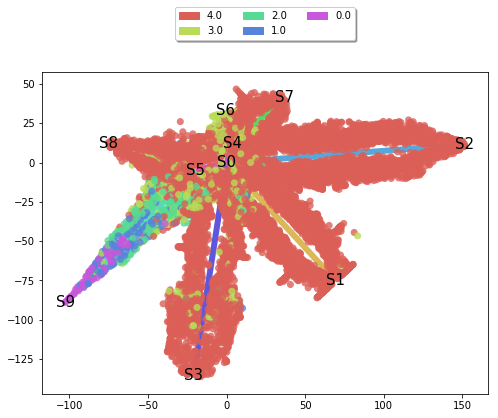

In [12]:
st.plot_branches(adata,n_components=2)
st.plot_branches_with_cells(adata,n_components=2)
st.plot_branches_with_cells(adata,n_components=3)
st.plot_flat_tree(adata)

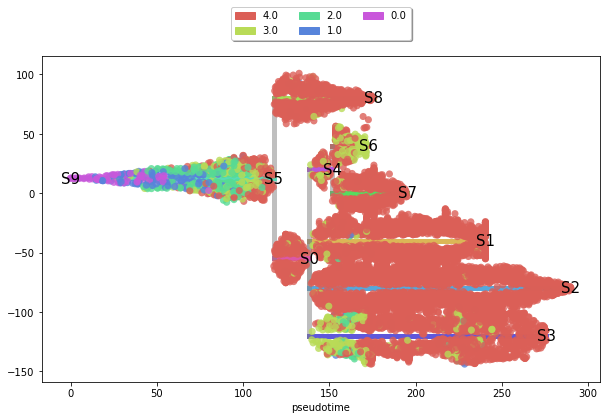

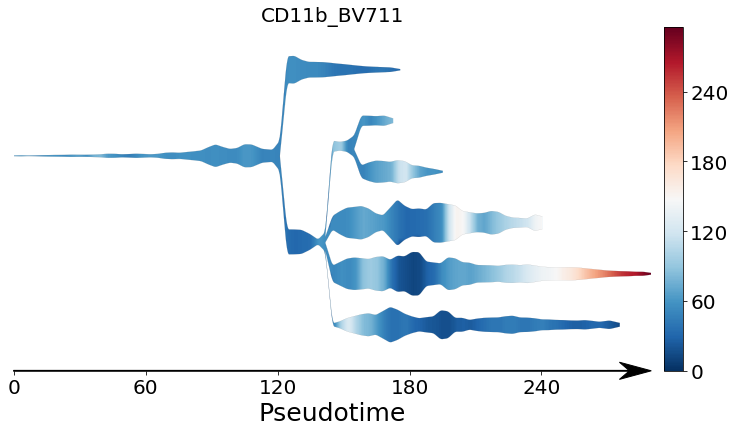

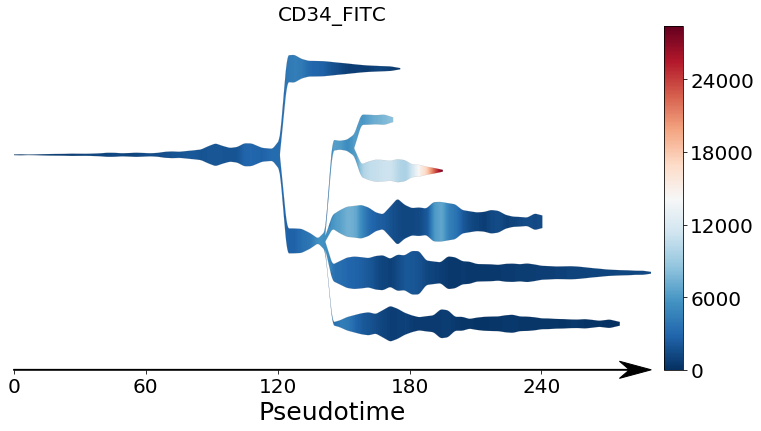

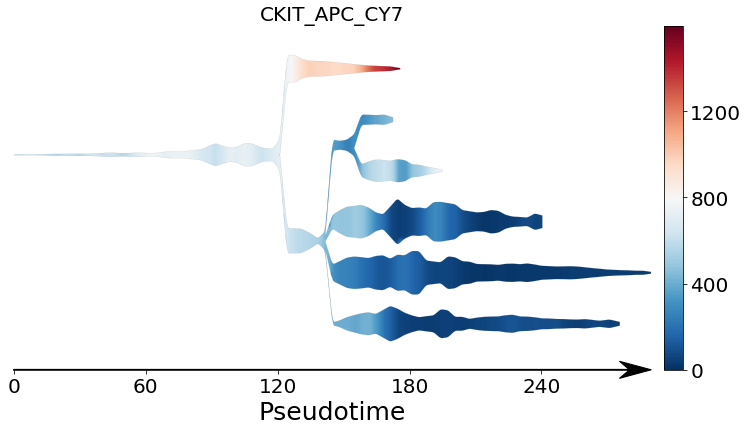

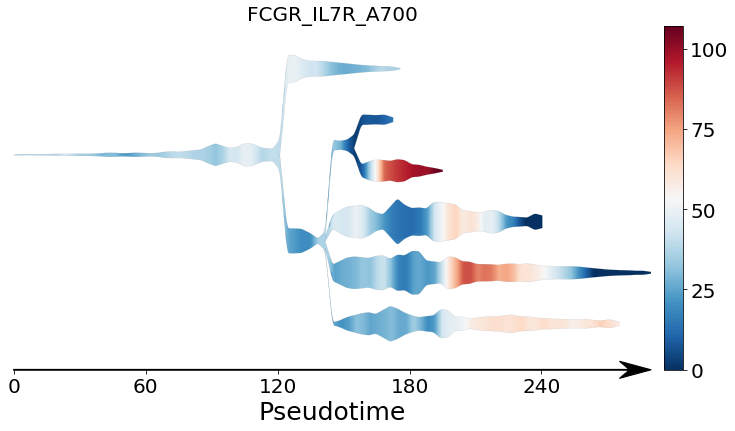

...

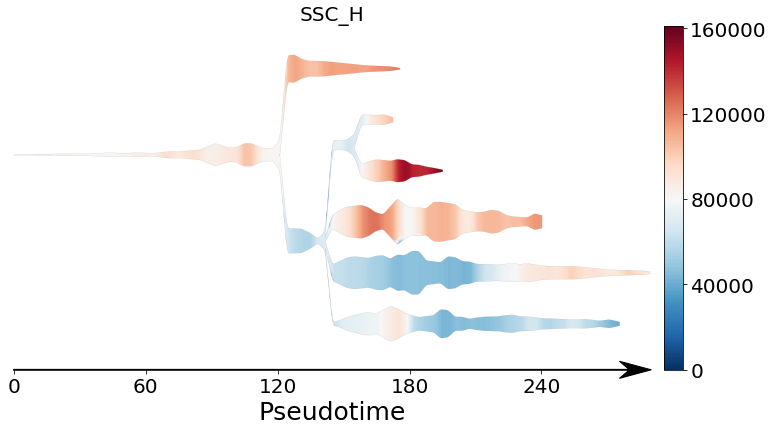

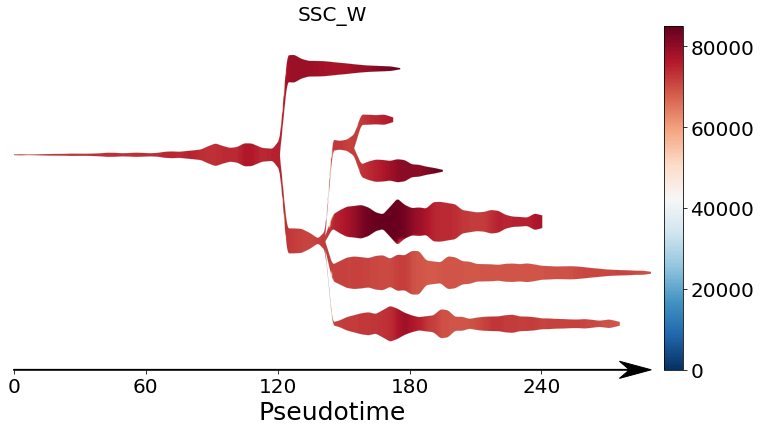

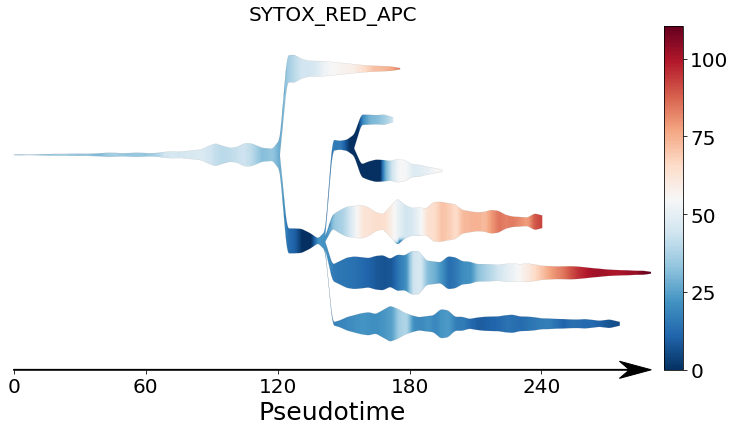

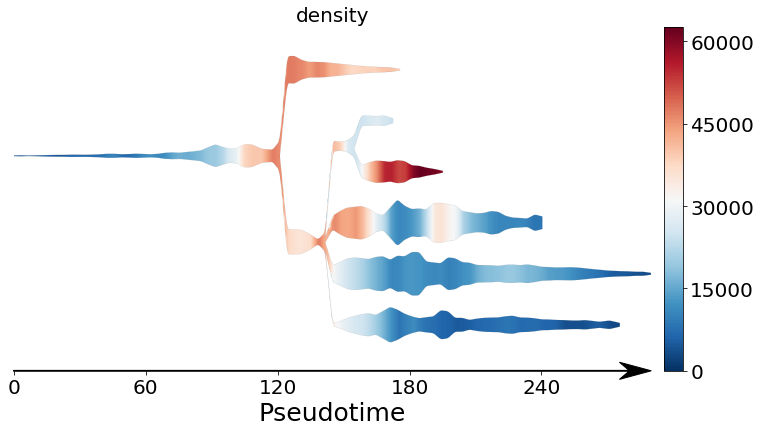

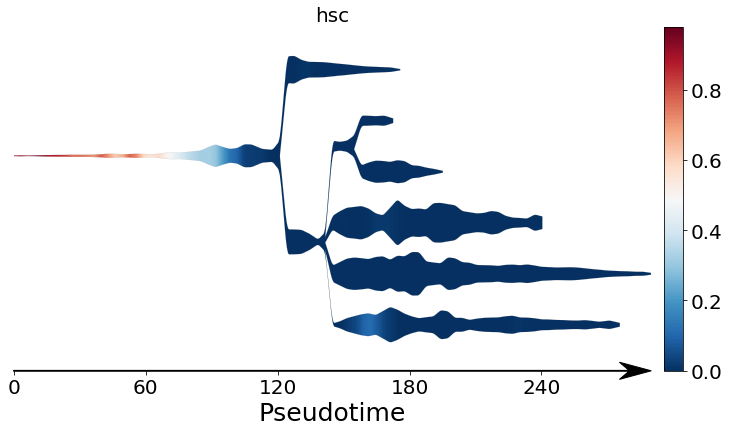

In [13]:
st.subwaymap_plot(adata,root='S9')
st.stream_plot_gene(adata,root='S9',genes=dep_col1,percentile_expr=100)

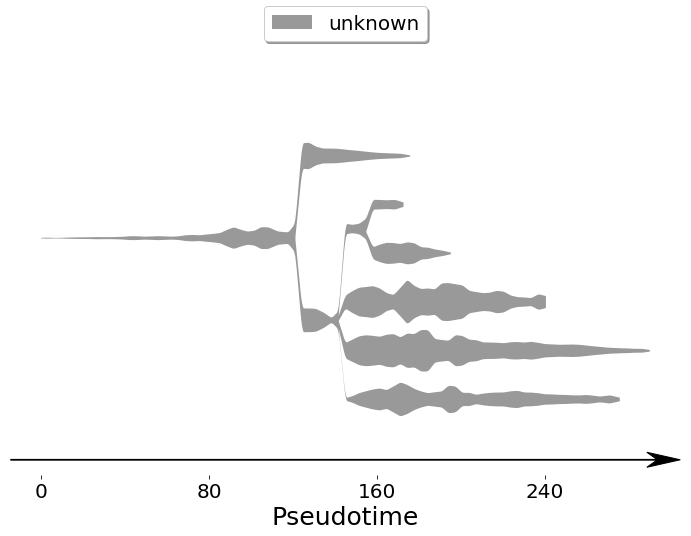

In [24]:
st.stream_plot(adata,root='S9',show_all_colors=True)

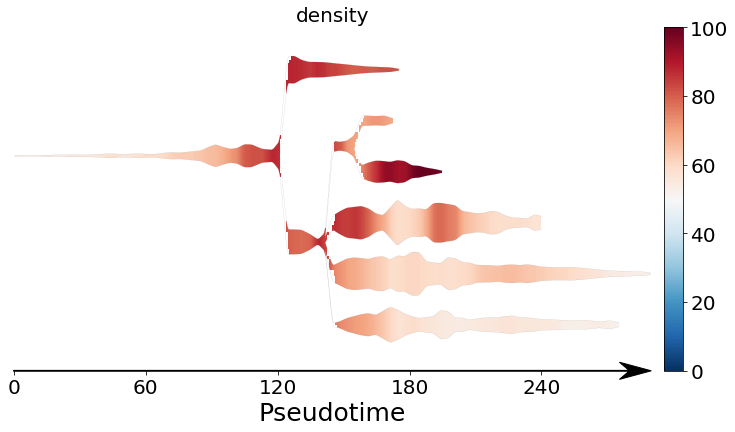

In [21]:
from stream_modified import stream_plot_gene_modified
stream_plot_gene_modified(adata, root='S9', genes = ["density"], vmin=0,vmax=100)

In [14]:
temp = pd.read_csv(save_path + "g3_1_out.csv")
temp["branch"] = adata.obs['branch_id_alias'].values
temp["pseudotime"] = adata.obs['S9_pseudotime'].values
temp.to_csv(save_path + "g3_1_out.csv",index=None)

# 3-d Visualization

In [15]:
from tqdm import tqdm
with open(save_path + 'graph_1.p', 'rb') as fp:
    graph = pickle.load(fp)
out = pd.read_csv(save_path + "g3_1_out.csv")
df_list["branch"] = 0
df_list["pseudotime"] = 0
for key, item in tqdm(graph["nodes"].items()):
    branch_name = out.loc[out.cell_name==key].branch.values[0]
    pseudo = out.loc[out.cell_name==key].pseudotime.values[0]
    df_list.loc[item,'branch'] = branch_name
    df_list.loc[item,'pseudotime'] = pseudo
df_list["branch_id"] = 0
count=0
for br in df_list.branch.unique():
    df_list.loc[df_list.branch==br,"branch_id"] = count
    count += 1
pd.crosstab(df_list.branch,df_list.branch_id)

100%|██████████| 13642/13642 [03:21<00:00, 67.55it/s]


branch_id,0,1,2,3,4,5,6,7,8
branch,,,,,,,,,
"('S1', 'S0')",0,0,0,0,0,0,23053,0,0
"('S2', 'S0')",0,74799,0,0,0,0,0,0,0
"('S3', 'S0')",0,0,0,0,15560,0,0,0,0
"('S4', 'S0')",0,0,0,0,0,0,0,0,10306
"('S5', 'S0')",0,0,42154,0,0,0,0,0,0
"('S6', 'S4')",0,0,0,0,0,12138,0,0,0
"('S7', 'S4')",0,0,0,29675,0,0,0,0,0
"('S8', 'S5')",35653,0,0,0,0,0,0,0,0
"('S9', 'S5')",0,0,0,0,0,0,0,6966,0


In [18]:
df_list[dep_col[6:]].describe()

,SYTOX_RED_APC,CKIT_APC_CY7,CD34_FITC,FCGR_IL7R_A700,SCA1_BUV395,SLAMF1_BV421,CD11b_BV711,LINEAGE_BUV737,MCHERRY,FLK2_PERCP_CY55
count,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000
mean,34.675661,434.051268,4108.260084,42.353524,229.328420,302.177706,48.606279,506.529097,28.752511,136.756469
std,35.554639,411.026125,5203.941213,43.655767,645.778176,637.126744,56.512873,369.833922,91.101847,268.568283
min,-486.321014,-44.015202,-158.537003,-105.254997,-110.552002,-1879.810059,-103.108002,-95.164101,-103.358002,-313.434998
25%,12.189925,69.089672,396.553490,10.026750,13.042250,44.945849,9.142888,195.635250,-11.946925,-21.864875
50%,30.103150,355.940506,1772.315002,35.173302,29.408299,94.667549,36.850550,436.010986,11.334200,46.936150
75%,53.737575,660.809509,6152.162476,70.076351,66.524649,262.341743,75.303001,782.464249,40.309174,178.597996
max,144.591995,3726.189941,64743.800781,153.921005,19946.900391,40701.699219,372.223999,1472.579956,4434.029785,4387.220215


In [17]:
dep_col

['FSC_A',
 'FSC_H',
 'FSC_W',
 'SSC_A',
 'SSC_H',
 'SSC_W',
 'SYTOX_RED_APC',
 'CKIT_APC_CY7',
 'CD34_FITC',
 'FCGR_IL7R_A700',
 'SCA1_BUV395',
 'SLAMF1_BV421',
 'CD11b_BV711',
 'LINEAGE_BUV737',
 'MCHERRY',
 'FLK2_PERCP_CY55']

In [8]:
Y_phate_3d = np.load(save_path + "phate3d_mcherry.npy")

temp1 = {}
temp1["x"] = Y_phate_3d[:,0]
temp1["y"] = Y_phate_3d[:,1]
temp1["z"] = Y_phate_3d[:,2]
temp1["cid"] = [0]*Y_phate_3d.shape[0]
temp1 = pd.DataFrame(temp1)
from sklearn.preprocessing import MinMaxScaler
import json
scaler = MinMaxScaler( feature_range=( -100, 100 ))
temp1[[ 'x', 'y', 'z' ]] = scaler.fit_transform( temp1[[ 'x', 'y', 'z' ]])

d_json = { 'points': json.loads( temp1.astype( str ).to_json( None, orient= 'records' )) }
json.dump( d_json, open("../../data/newData/data.json", 'w' ))

In [52]:
Y_phate_3d = np.load(save_path + "phate3d_1.npy")

temp1 = {}
temp1["x"] = Y_phate_3d[:,0]
temp1["y"] = Y_phate_3d[:,1]
temp1["z"] = Y_phate_3d[:,2]
temp1["cid"] = temp
temp1 = pd.DataFrame(temp1)
from sklearn.preprocessing import MinMaxScaler
import json
scaler = MinMaxScaler( feature_range=( -100, 100 ))
temp1[[ 'x', 'y', 'z' ]] = scaler.fit_transform( temp1[[ 'x', 'y', 'z' ]])

d_json = { 'points': json.loads( temp1.astype( str ).to_json( None, orient= 'records' )) }
json.dump( d_json, open("../../data/newData/data.json", 'w' ))

In [51]:
temp = [2 if i==0 else 1 if i==1 else 0 for i in df_list.id]

In [26]:
pd.crosstab(df_list.id, columns="count")

col_0,count
id,
0.0,331
1.0,1081
2.0,1775
3.0,22796
4.0,224321


# Zoom in potential branch

In [27]:
df_list = df_list[dep_col+["branch_id",'id','density']]
Y_phate_3d = np.load(save_path + "phate3d_1.npy")
df_list["p1_0"] = Y_phate_3d[:,0]
df_list["p1_1"] = Y_phate_3d[:,1]
df_list["p1_2"] = Y_phate_3d[:,2]
branchA = df_list.loc[df_list.branch_id==7]
branchA.head()

,FSC_A,FSC_H,FSC_W,SSC_A,SSC_H,SSC_W,SYTOX_RED_APC,CKIT_APC_CY7,CD34_FITC,FCGR_IL7R_A700,SCA1_BUV395,SLAMF1_BV421,CD11b_BV711,LINEAGE_BUV737,MCHERRY,FLK2_PERCP_CY55,branch_id,id,density,p1_0,p1_1,p1_2
23,127311.0,107446.0,77652.796875,71219.601562,63202.0,73849.703125,50.790401,874.237976,5667.839844,55.756599,29.927601,2109.139893,-2.088020,809.926025,-17.051001,76.805199,7,4.0,56792.0,-36.688181,3.967552,-2.614624
80,107212.0,92954.0,75588.703125,46638.898438,42218.0,72398.703125,0.753596,410.000000,599.273010,48.218800,34.113499,2005.479980,29.000900,175.511993,-51.090199,-17.536900,7,4.0,26675.0,-35.475734,3.490468,-12.204452
124,123603.0,106908.0,75770.000000,75591.101562,69164.0,71626.000000,31.895800,1157.869995,988.046021,112.323997,24.183500,2908.310059,163.154007,1016.789978,44.845501,-171.632996,7,4.0,35209.0,-36.604782,9.161397,-0.574109
194,102894.0,90814.0,74253.601562,56389.000000,52218.0,70770.796875,3.200660,367.855988,2161.129883,20.995899,10.661800,2403.860107,44.802700,359.761993,16.907301,-98.799698,7,4.0,38079.0,-36.382647,6.009630,-10.374553
209,176830.0,138333.0,83774.101562,152938.000000,130569.0,76763.500000,53.180000,189.384003,1181.540039,-16.599400,570.539978,227.479996,42.401402,339.575012,60.119701,119.174004,7,4.0,17481.0,-33.495094,12.718405,9.061912


In [28]:
X_input = preprocessing.scale(branchA[dep_col])
phate_operator = phate.PHATE(n_jobs=-2,knn=50)
Y_phate = phate_operator.fit_transform(X_input)
phate_operator.set_params(n_components=10)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate10d_2.npy",Y_phate_3d)
phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate3d_2.npy",Y_phate_3d)
Y_phate_3d = np.load(save_path + "phate3d_2.npy")

Calculating PHATE...
  Running PHATE on 6966 cells and 16 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1.91 seconds.
    Calculating affinities...
    Calculated affinities in 1.20 seconds.
  Calculated graph and diffusion operator in 3.17 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 2.97 seconds.
    Calculating KMeans...
    Calculated KMeans in 18.63 seconds.
  Calculated landmark operator in 22.69 seconds.
  Calculating optimal t...
    Automatically selected t = 15
  Calculated optimal t in 1.35 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.24 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 24.35 seconds.
Calculated PHATE in 51.83 seconds.
Calculating metric MDS...
Calculated metric MDS in 155.59 seconds.
Calculating metric MDS...
Calculated metric MDS in 61.44 seconds.


In [29]:
Y_phate_3d = np.load(save_path + "phate3d_2.npy")
mapper = KM_extend(verbose=2)
graph = mapper.map_extend(Y_phate_3d, X_input, cover=km.Cover(n_cubes=50, perc_overlap=0.5), 
                   clusterer = GM_extend(n_components = 1))
with open(save_path + 'graph_2.p', 'wb') as fp:
    pickle.dump(graph , fp, protocol=pickle.HIGHEST_PROTOCOL)

Mapping on data shaped (6966, 16) using lens shaped (6966, 3)

Minimal points in hypercube before clustering: 50
Creating 125000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is emp

In [30]:
Y_phate_3d = np.load(save_path + "phate10d_2.npy")
branchA['p2_0'] = Y_phate_3d[:,0]
branchA['p2_1'] = Y_phate_3d[:,1]
branchA['p2_2'] = Y_phate_3d[:,2]
branchA['p2_3'] = Y_phate_3d[:,3]
branchA['p2_4'] = Y_phate_3d[:,4]
branchA['p2_5'] = Y_phate_3d[:,5]
branchA['p2_6'] = Y_phate_3d[:,6]
branchA['p2_7'] = Y_phate_3d[:,7]
branchA['p2_8'] = Y_phate_3d[:,8]
branchA['p2_9'] = Y_phate_3d[:,9]

In [31]:
branchA.reset_index(inplace=True)
branchA.drop(columns=["index"], inplace=True)

In [32]:
with open(save_path + 'graph_2.p', 'rb') as fp:
    graph = pickle.load(fp)
out = {}
out["cell_name"] = []
branchA["cell_1"] = 0
out_col = dep_col + ['p2_0','p2_1','p2_2','p2_3','p2_4','p2_5','p2_6','p2_7','p2_8','p2_9','id','density']
for i in out_col:
    out[i] = []
for key, item in tqdm(graph["nodes"].items()):
    out['cell_name'].append(key)
    temp = branchA.iloc[item]
    branchA.loc[item,'cell_1'] = key
    for col_name in out_col:
        out[col_name].append(temp[col_name].mean())
out = pd.DataFrame(out)
out.fillna(0, inplace=True)
out["id"] = [np.round(i) for i in out.id]
out.to_csv(save_path + "g3_2_out.csv",index=None)

100%|██████████| 4607/4607 [08:27<00:00,  8.87it/s]


In [33]:
#dep_col1.remove("check")
out1 = out[dep_col1]
out1[dep_col1] = preprocessing.QuantileTransformer().fit_transform(out[dep_col1])
out1.to_csv(save_path + "g3_2_dep.csv", index=None)
out1 = out[["id"]]
out1.to_csv(save_path + "g3_2_lab.csv", index=None,header=None)
out1 = {}
out1["p2_0"] = out["p2_0"]
out1["p2_1"] = out["p2_1"]
out1["p2_2"] = out["p2_2"]
out1["p2_3"] = out["p2_3"]
out1["p2_4"] = out["p2_4"]
out1["p2_5"] = out["p2_5"]
out1["p2_6"] = out["p2_6"]
out1["p2_7"] = out["p2_7"]
out1["p2_8"] = out["p2_8"]
out1["p2_9"] = out["p2_9"]
out1 = pd.DataFrame(out1)
out1.to_csv(save_path + "g3_2_dr.csv", index=None)

Trying to set attribute `.obs` of view, making a copy.


No cell color file is provided, random color is generated for each cell label


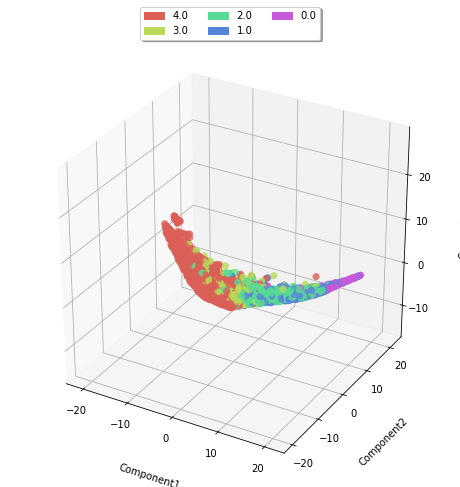

In [40]:
ada1 = anndata.read_csv(save_path + "g3_2_dep.csv")

adata = ada1[:,dep_col1]
st.add_cell_labels(adata,file_name=save_path + "g3_2_lab.csv")
st.add_cell_colors(adata)
adata.uns['workdir'] = save_path + 'stream'

temp = pd.read_csv(save_path + "g3_2_dr.csv")
#temp = pd.read_csv("tsne_dim4.csv")
adata.obsm['X_dr'] = temp[["p2_0","p2_1","p2_2","p2_3","p2_4","p2_5","p2_6","p2_7","p2_8","p2_9"]].values
#adata.obsm['X_dr'] = temp[["dr3_0","dr3_1","dr3_2"]].values

adata.uns["experiment"] = 'rna-seq'
adata.raw = adata

st.plot_dimension_reduction(adata,n_components=3)

In [41]:
st.elastic_principal_graph(adata,epg_n_nodes=20)
st.optimize_branching(adata)
st.shift_branching(adata)
st.extend_elastic_principal_graph(adata)

No initial structure is seeded
Learning elastic principal graph...
[1]
 "Generating the initial configuration"


[1]
 "Creating a chain in the 1st PC with 2 nodes"


[1]
 "Constructing tree 1 of 1 / Subset 1 of 1"


[1]
 "The elastic matrix is being used. Edge configuration will be ignored"


[1]
 "Computing EPG with 20 nodes on 4607 points and 10 dimensions"


[1]
 "Using a single core"


Nodes = 
2
 
3
 
4
 
5
 
6
 
7
 
8
 
9
 
10
 
11
 
12
 
13
 
14
 
15
 
16
 
17
 
18
 
19
 


BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

2||20
	
9.358
	
20
	
19
	
14
	
2
	
0
	
0
	
5.953
	
5.382
	
0.9494
	
0.9543
	
3.056
	
0.3486
	
6.971
	
139.4
	
0


2.246 sec elapsed

[[1]]



Number of branches after learning elastic principal graph: 5
Optimizing branching...
[1]
 "Constructing tree 1 of 1 / Subset 1 of 1"


[1]
 "Computing EPG with 50 nodes on 4607 points and 10 dimensions"


[1]
 "Using a single core"


Nodes = 
20
 
21
 
22
 
23
 
24
 
25
 
26
 


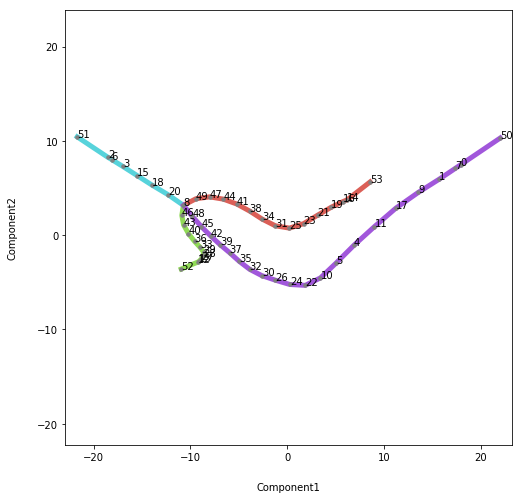

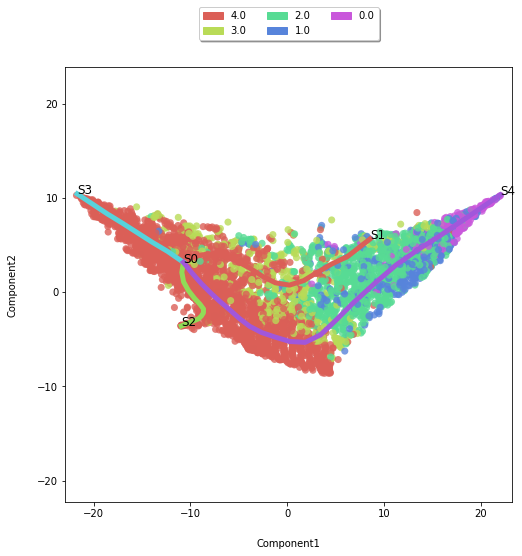

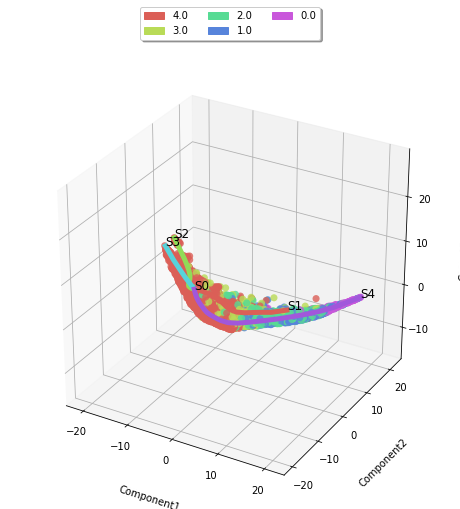

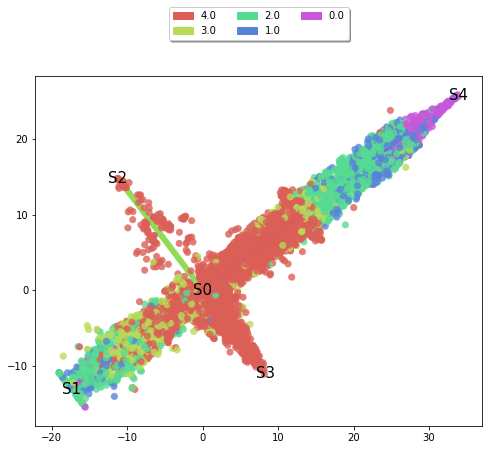

In [42]:
st.plot_branches(adata,n_components=2)
st.plot_branches_with_cells(adata,n_components=2)
st.plot_branches_with_cells(adata,n_components=3)
st.plot_flat_tree(adata)

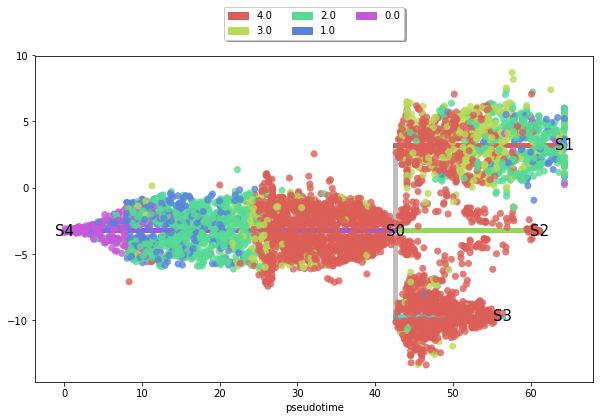

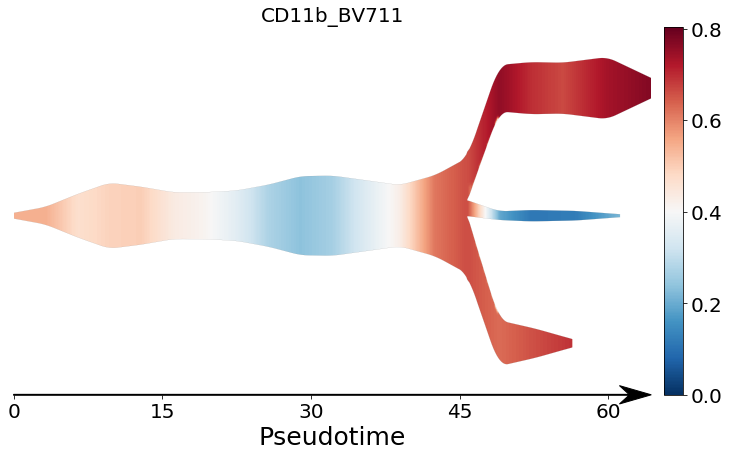

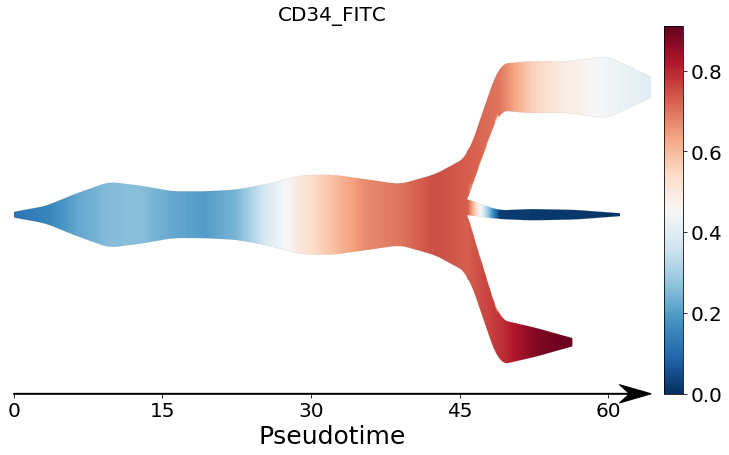

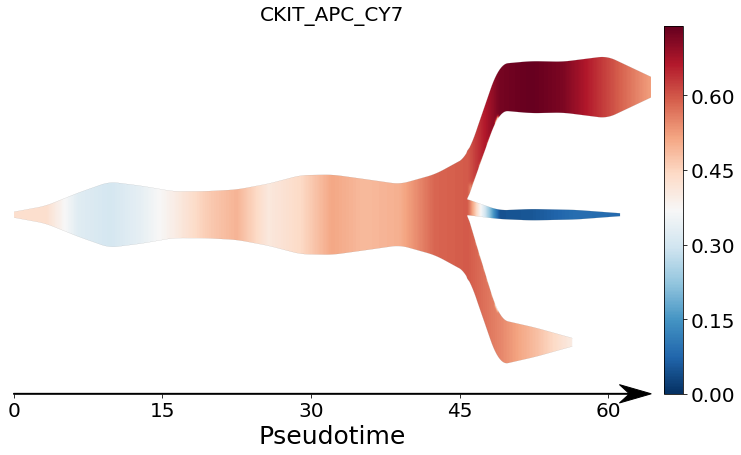

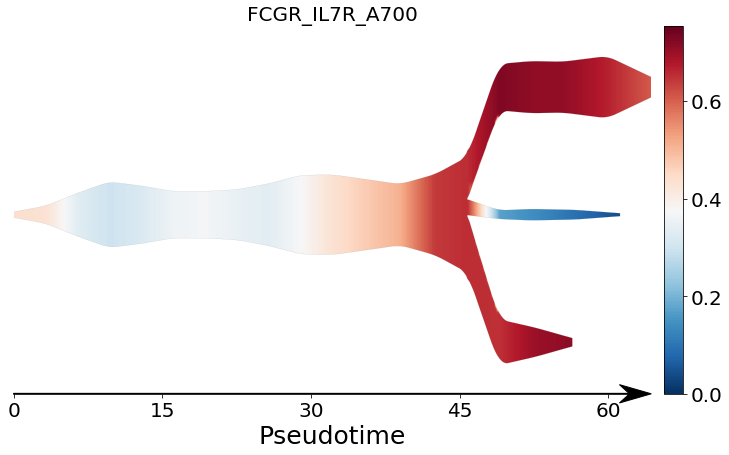

...

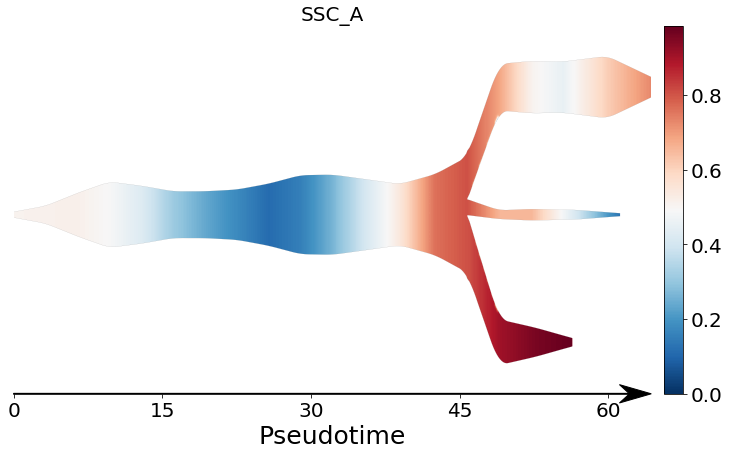

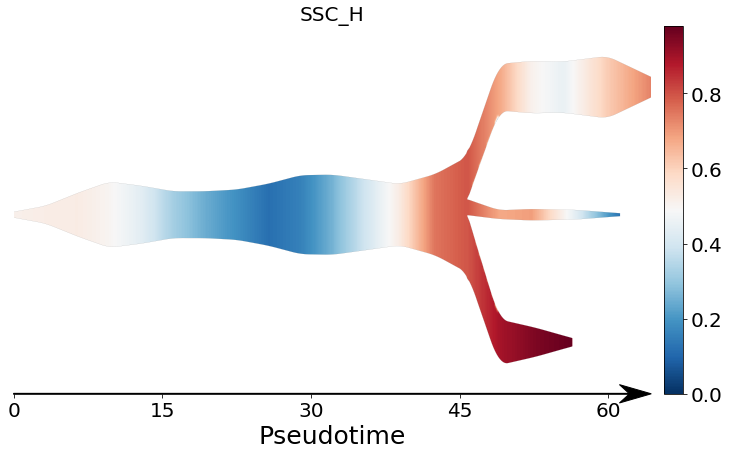

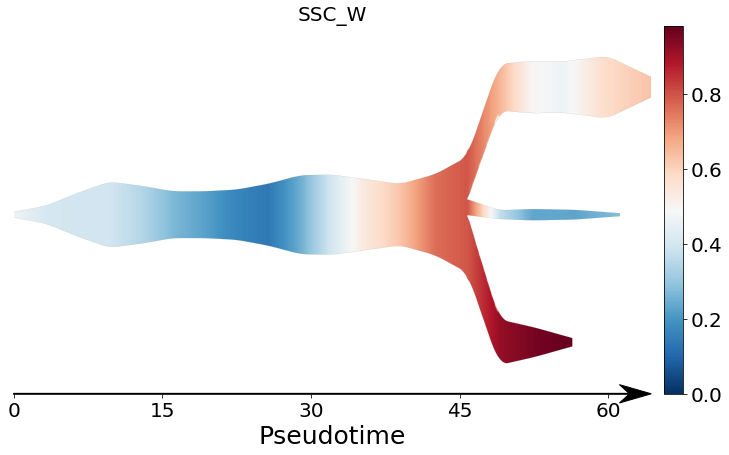

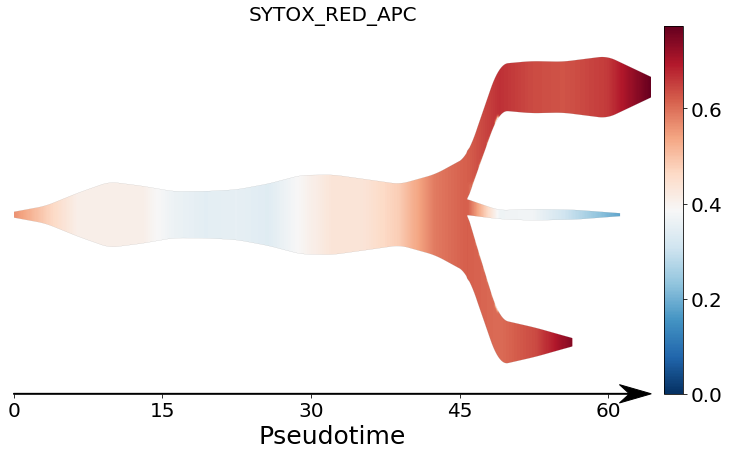

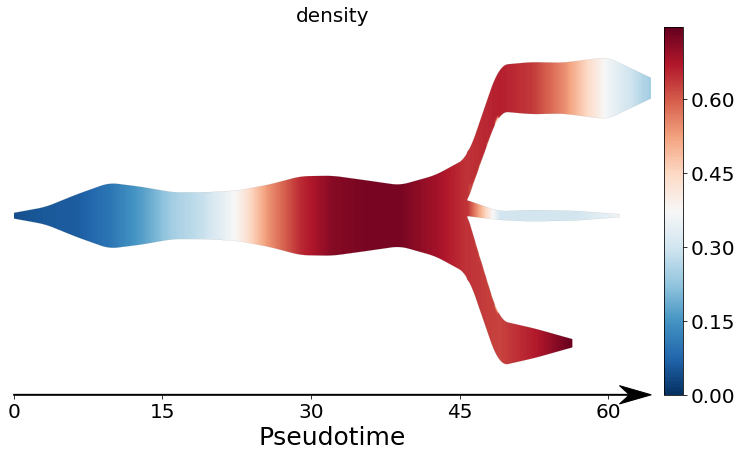

In [43]:
st.subwaymap_plot(adata,root='S4')
st.stream_plot_gene(adata,root='S4',genes=dep_col+["density"],percentile_expr=100)

In [44]:
temp = pd.read_csv(save_path + "g3_2_out.csv")
temp["branch"] = adata.obs['branch_id_alias'].values
temp["pseudotime"] = adata.obs['S4_pseudotime'].values
temp.to_csv(save_path + "g3_2_out.csv",index=None)

In [45]:
with open(save_path + 'graph_2.p', 'rb') as fp:
    graph = pickle.load(fp)
out = pd.read_csv(save_path + "g3_2_out.csv")
branchA["branch"] = 0
branchA["pseudotime"] = 0
for key, item in tqdm(graph["nodes"].items()):
    branch_name = out.loc[out.cell_name==key].branch.values[0]
    pseudo = out.loc[out.cell_name==key].pseudotime.values[0]
    branchA.loc[item,'branch'] = branch_name
    branchA.loc[item,'pseudotime'] = pseudo
df_list["branch_id"] = 0
count=0
for br in branchA.branch.unique():
    branchA.loc[branchA.branch==br,"branch_id"] = count
    count += 1
pd.crosstab(branchA.branch,branchA.branch_id)

100%|██████████| 4607/4607 [15:04<00:00,  4.87it/s]


branch_id,0,1,2,3
branch,,,,
"('S1', 'S0')",0,978,0,0
"('S2', 'S0')",0,0,0,211
"('S3', 'S0')",0,0,853,0
"('S4', 'S0')",4924,0,0,0


In [48]:
pd.crosstab(branchA.id, columns="count")

col_0,count
id,
0.0,331
1.0,942
2.0,794
3.0,610
4.0,4289


In [49]:
temp = [2 if i==0 else 1 if i==1 else 0 for i in branchA.id]

In [50]:
Y_phate_3d = np.load(save_path + "phate3d_2.npy")

temp1 = {}
temp1["x"] = Y_phate_3d[:,0]
temp1["y"] = Y_phate_3d[:,1]
temp1["z"] = Y_phate_3d[:,2]
temp1["cid"] = temp
temp1 = pd.DataFrame(temp1)
from sklearn.preprocessing import MinMaxScaler
import json
scaler = MinMaxScaler( feature_range=( -100, 100 ))
temp1[[ 'x', 'y', 'z' ]] = scaler.fit_transform( temp1[[ 'x', 'y', 'z' ]])

d_json = { 'points': json.loads( temp1.astype( str ).to_json( None, orient= 'records' )) }
json.dump( d_json, open("../../data/newData/data.json", 'w' ))

In [96]:
branchA["lthsc"] = [1 if (i==0)&(j<3) else 0 for i,j in zip(branchA.branch_id,branchA.pseudotime)]
pd.crosstab(branchA.id,branchA.lthsc)

lthsc,0,1
id,,
0.0,156,175
1.0,909,33
2.0,788,6
3.0,575,35
4.0,4283,6


In [94]:
branchA["hsc"] = [1 if (i==0)&(j<9) else 0 for i,j in zip(branchA.branch_id,branchA.pseudotime)]
pd.crosstab(branchA.id,branchA.hsc)

hsc,0,1
id,,
0.0,15,316
1.0,132,810
2.0,229,565
3.0,344,266
4.0,4123,166


In [97]:
df_list_out = df_list[dep_col+["id"]]
branchA_out = branchA[dep_col+["lthsc","hsc"]]
df_list_out = df_list_out.merge(branchA_out, on=dep_col, how="left")
df_list_out.fillna(0,inplace=True)
df_list_out.head()

,FSC_A,FSC_H,FSC_W,SSC_A,SSC_H,SSC_W,SYTOX_RED_APC,CKIT_APC_CY7,CD34_FITC,FCGR_IL7R_A700,SCA1_BUV395,SLAMF1_BV421,CD11b_BV711,LINEAGE_BUV737,MCHERRY,FLK2_PERCP_CY55,id,lthsc,hsc
0,150851.000000,122832.0,80485.203125,77687.203125,68548.0,74273.601562,59.540699,1039.930054,290.735992,-6.928180,28.319599,69.509804,69.511703,1220.829956,110.552002,-65.649498,4.0,0.0,0.0
1,45798.398438,42316.0,70929.203125,71879.296875,67128.0,70174.601562,76.962097,22.481199,883.114014,-11.864500,22.473301,168.587997,172.436005,94.823402,370.894012,696.487976,4.0,0.0,0.0
2,187656.000000,126574.0,97162.398438,99737.101562,69966.0,93422.101562,7.993700,10.662900,230.253006,8.131660,56.437801,92.105103,21.912201,291.036987,-54.843700,14.321300,4.0,0.0,0.0
3,111463.000000,96911.0,75376.898438,79071.203125,73355.0,70642.898438,-10.760800,445.398987,7407.370117,73.381897,19.966900,24.941900,88.366501,199.423996,27.810499,-23.930500,4.0,0.0,0.0
4,130718.000000,109914.0,77940.203125,83094.601562,71834.0,75809.296875,27.973499,255.656006,8473.759766,36.536400,27.761200,106.805000,-18.709801,364.852997,19.262899,192.544998,4.0,0.0,0.0


In [98]:
df_list_out["test"] = [1 if (i==0)|(i==1)|(i==2) else 0 for i in df_list_out.id]

In [52]:
pd.crosstab(df_list_out.test,df_list_out.lthsc)

lthsc,0.0,1.0
test,,
0,249893,80
1,156,175


In [99]:
pd.crosstab(df_list_out.test,df_list_out.hsc)

hsc,0.0,1.0
test,,
0,246685,432
1,1496,1691


In [74]:
branchB = branchA.loc[(branchA.branch_id==0) | (branchA.branch_id==1)]
print(branchB.shape)
branchB.reset_index(inplace=True)
branchB.drop(columns=["index"], inplace=True)

(6060, 26)


In [75]:
X_input = preprocessing.scale(branchB[dep_col])
phate_operator = phate.PHATE(n_jobs=-2,knn=50)
Y_phate = phate_operator.fit_transform(X_input)
phate_operator.set_params(n_components=10)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate10d_3.npy",Y_phate_3d)
phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate3d_3.npy",Y_phate_3d)
Y_phate_3d = np.load(save_path + "phate3d_3.npy")

Calculating PHATE...
  Running PHATE on 6060 cells and 16 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1.86 seconds.
    Calculating affinities...
    Calculated affinities in 0.89 seconds.
  Calculated graph and diffusion operator in 2.79 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 2.57 seconds.
    Calculating KMeans...
    Calculated KMeans in 22.68 seconds.
  Calculated landmark operator in 26.32 seconds.
  Calculating optimal t...
    Automatically selected t = 16
  Calculated optimal t in 1.29 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.18 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 14.75 seconds.
Calculated PHATE in 45.36 seconds.
Calculating metric MDS...
Calculated metric MDS in 160.06 seconds.
Calculating metric MDS...
Calculated metric MDS in 116.97 seconds.


In [76]:
Y_phate_3d = np.load(save_path + "phate3d_3.npy")
mapper = KM_extend(verbose=2)
graph = mapper.map_extend(Y_phate_3d, X_input, cover=km.Cover(n_cubes=50, perc_overlap=0.5), 
                   clusterer = GM_extend(n_components = 1))
with open(save_path + 'graph_3.p', 'wb') as fp:
    pickle.dump(graph , fp, protocol=pickle.HIGHEST_PROTOCOL)

Mapping on data shaped (6060, 16) using lens shaped (6060, 3)

Minimal points in hypercube before clustering: 50
Creating 125000 hypercubes.
Cube_0 is empty.

Cube_1 is empty.

Cube_2 is empty.

Cube_3 is empty.

Cube_4 is empty.

Cube_5 is empty.

Cube_6 is empty.

Cube_7 is empty.

Cube_8 is empty.

Cube_9 is empty.

Cube_10 is empty.

Cube_11 is empty.

Cube_12 is empty.

Cube_13 is empty.

Cube_14 is empty.

Cube_15 is empty.

Cube_16 is empty.

Cube_17 is empty.

Cube_18 is empty.

Cube_19 is empty.

Cube_20 is empty.

Cube_21 is empty.

Cube_22 is empty.

Cube_23 is empty.

Cube_24 is empty.

Cube_25 is empty.

Cube_26 is empty.

Cube_27 is empty.

Cube_28 is empty.

Cube_29 is empty.

Cube_30 is empty.

Cube_31 is empty.

Cube_32 is empty.

Cube_33 is empty.

Cube_34 is empty.

Cube_35 is empty.

Cube_36 is empty.

Cube_37 is empty.

Cube_38 is empty.

Cube_39 is empty.

Cube_40 is empty.

Cube_41 is empty.

Cube_42 is empty.

Cube_43 is empty.

Cube_44 is empty.

Cube_45 is emp

In [78]:
Y_phate_3d = np.load(save_path + "phate10d_3.npy")
branchB['p3_0'] = Y_phate_3d[:,0]
branchB['p3_1'] = Y_phate_3d[:,1]
branchB['p3_2'] = Y_phate_3d[:,2]
branchB['p3_3'] = Y_phate_3d[:,3]
branchB['p3_4'] = Y_phate_3d[:,4]
branchB['p3_5'] = Y_phate_3d[:,5]
branchB['p3_6'] = Y_phate_3d[:,6]
branchB['p3_7'] = Y_phate_3d[:,7]
branchB['p3_8'] = Y_phate_3d[:,8]
branchB['p3_9'] = Y_phate_3d[:,9]

In [79]:
with open(save_path + 'graph_3.p', 'rb') as fp:
    graph = pickle.load(fp)
out = {}
out["cell_name"] = []
branchB["cell_1"] = 0
out_col = dep_col + ['p3_0','p3_1','p3_2','p3_3','p3_4','p3_5','p3_6','p3_7','p3_8','p3_9','id','density']
for i in out_col:
    out[i] = []
for key, item in tqdm(graph["nodes"].items()):
    out['cell_name'].append(key)
    temp = branchB.iloc[item]
    branchB.loc[item,'cell_1'] = key
    for col_name in out_col:
        out[col_name].append(temp[col_name].mean())
out = pd.DataFrame(out)
out.fillna(0, inplace=True)
out["id"] = [np.round(i) for i in out.id]
out.to_csv(save_path + "g3_3_out.csv",index=None)

100%|██████████| 9839/9839 [16:06<00:00, 10.18it/s]


In [81]:
#dep_col1.remove("check")
out1 = out[dep_col1]
out1[dep_col1] = preprocessing.QuantileTransformer().fit_transform(out[dep_col1])
out1.to_csv(save_path + "g3_3_dep.csv", index=None)
out1 = out[["id"]]
out1.to_csv(save_path + "g3_3_lab.csv", index=None,header=None)
out1 = {}
out1["p3_0"] = out["p3_0"]
out1["p3_1"] = out["p3_1"]
out1["p3_2"] = out["p3_2"]
out1["p3_3"] = out["p3_3"]
out1["p3_4"] = out["p3_4"]
out1["p3_5"] = out["p3_5"]
out1["p3_6"] = out["p3_6"]
out1["p3_7"] = out["p3_7"]
out1["p3_8"] = out["p3_8"]
out1["p3_9"] = out["p3_9"]
out1 = pd.DataFrame(out1)
out1.to_csv(save_path + "g3_3_dr.csv", index=None)

Trying to set attribute `.obs` of view, making a copy.


No cell color file is provided, random color is generated for each cell label


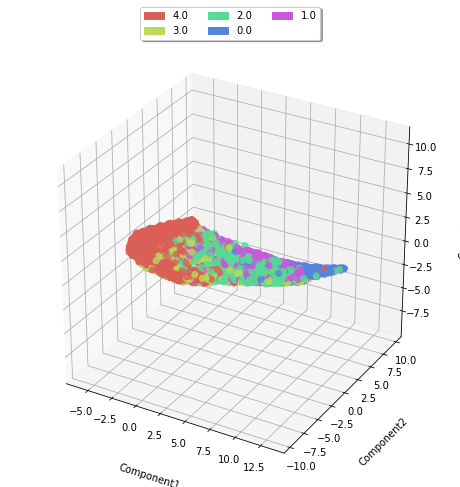

In [91]:
ada1 = anndata.read_csv(save_path + "g3_3_dep.csv")

adata = ada1[:,dep_col1]
st.add_cell_labels(adata,file_name=save_path + "g3_3_lab.csv")
st.add_cell_colors(adata)
adata.uns['workdir'] = save_path + 'stream'

temp = pd.read_csv(save_path + "g3_3_dr.csv")
#temp = pd.read_csv("tsne_dim4.csv")
adata.obsm['X_dr'] = temp[["p3_0","p3_1","p3_2","p3_3","p3_4","p3_5","p3_6","p3_7","p3_8","p3_9"]].values
#adata.obsm['X_dr'] = temp[["dr3_0","dr3_1","dr3_2"]].values

adata.uns["experiment"] = 'rna-seq'
adata.raw = adata

st.plot_dimension_reduction(adata,n_components=3)

In [92]:
st.elastic_principal_graph(adata,epg_n_nodes=5)
st.optimize_branching(adata)
st.shift_branching(adata)
st.extend_elastic_principal_graph(adata)

No initial structure is seeded
Learning elastic principal graph...
[1]
 "Generating the initial configuration"


[1]
 "Creating a chain in the 1st PC with 2 nodes"


[1]
 "Constructing tree 1 of 1 / Subset 1 of 1"


[1]
 "The elastic matrix is being used. Edge configuration will be ignored"


[1]
 "Computing EPG with 5 nodes on 9839 points and 10 dimensions"


[1]
 "Using a single core"


Nodes = 
2
 
3
 
4
 


BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

0||5
	
5.827
	
5
	
4
	
3
	
0
	
0
	
0
	
4.531
	
3.884
	
0.8486
	
0.8702
	
0.9404
	
0.3559
	
1.779
	
8.897
	
0


0.473 sec elapsed

[[1]]



Number of branches after learning elastic principal graph: 1
Optimizing branching...
[1]
 "Constructing tree 1 of 1 / Subset 1 of 1"


[1]
 "Computing EPG with 35 nodes on 9839 points and 10 dimensions"


[1]
 "Using a single core"


Nodes = 
5
 


RRuntimeError: Error in NodePositionArrayAll[[i]] : subscript out of bounds


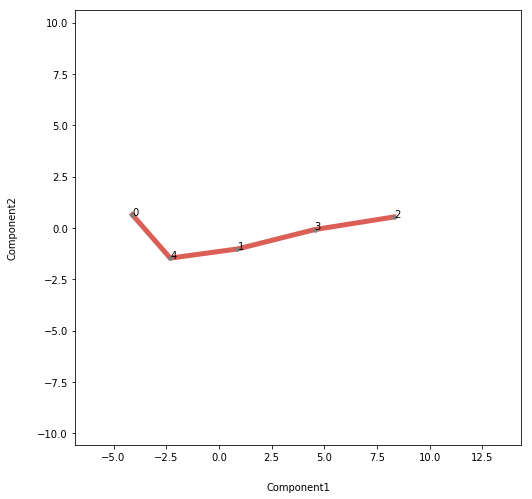

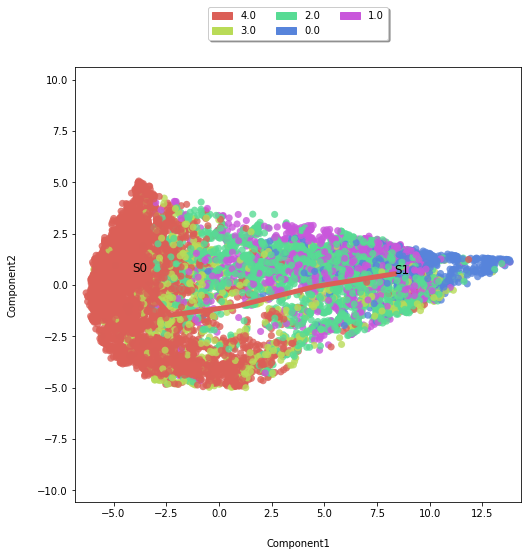

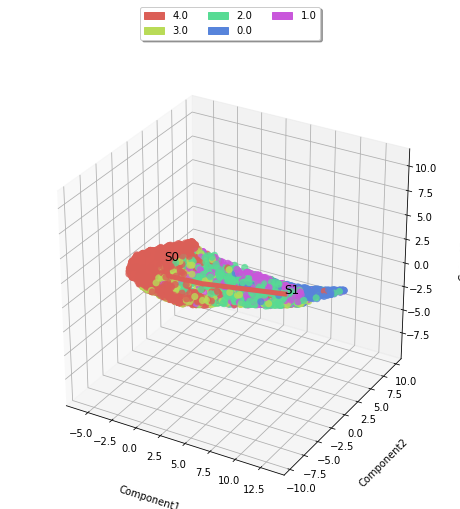

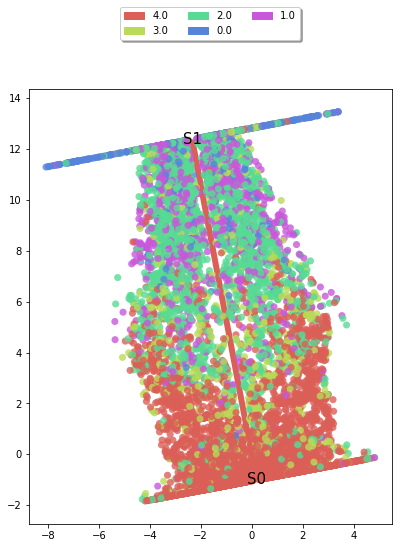

In [93]:
st.plot_branches(adata,n_components=2)
st.plot_branches_with_cells(adata,n_components=2)
st.plot_branches_with_cells(adata,n_components=3)
st.plot_flat_tree(adata)

### Try non-leaf section of branches

In [ ]:
branchA = branchA[dep_col+["branch_id",'id','p1_0','p1_1','p1_2']]
Y_phate_3d = np.load(save_path + "phate3d_2.npy")
branchA["p2_0"] = Y_phate_3d[:,0]
branchA["p2_1"] = Y_phate_3d[:,1]
branchA["p2_2"] = Y_phate_3d[:,2]
branchBf = branchA.loc[branchA.branch_id!=4]
branchBf.shape

In [ ]:
X_input = preprocessing.scale(branchBf[dep_col])
phate_operator = phate.PHATE(n_jobs=-2,knn=50)
Y_phate = phate_operator.fit_transform(X_input)
phate_operator.set_params(n_components=10)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate10d_3f.npy",Y_phate_3d)
phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate3d_3f.npy",Y_phate_3d)
Y_phate_3d = np.load(save_path + "phate3d_3f.npy")

In [ ]:
Y_phate_3d = np.load(save_path + "phate3d_3f.npy")

temp1 = {}
temp1["x"] = Y_phate_3d[:,0]
temp1["y"] = Y_phate_3d[:,1]
temp1["z"] = Y_phate_3d[:,2]
temp1["cid"] = branchBf.id
temp1 = pd.DataFrame(temp1)
from sklearn.preprocessing import MinMaxScaler
import json
scaler = MinMaxScaler( feature_range=( -100, 100 ))
temp1[[ 'x', 'y', 'z' ]] = scaler.fit_transform( temp1[[ 'x', 'y', 'z' ]])

d_json = { 'points': json.loads( temp1.astype( str ).to_json( None, orient= 'records' )) }
json.dump( d_json, open("../../data/newData/data.json", 'w' ))

# Extract FCS files on the branch of interested

In [ ]:
with open(save_path + 'graph_2.p', 'rb') as fp:
    graph = pickle.load(fp)
out = pd.read_csv(save_path + "g3_2_out.csv")
branchA["branch"] = 0
branchA["pseudotime"] = 0
for key, item in graph["nodes"].items():
    branch_name = out.loc[out.cell_name==key].branch.values[0]
    pseudo = out.loc[out.cell_name==key].pseudotime.values[0]
    branchA.loc[item,'branch'] = branch_name
    branchA.loc[item,'pseudotime'] = pseudo
df_list["branch_id"] = 0
count=0
for br in branchA.branch.unique():
    branchA.loc[branchA.branch==br,"branch_id"] = count
    count += 1
pd.crosstab(branchA.branch,branchA.branch_id)

In [ ]:
if not os.path.exists(save_path+"wet_side/"):
    os.makedirs(save_path+"wet_side/")

out_col = fut.chan_name[:-2] + ["id"]
out_opt = fut.optn_name[:-2] + ["id & AnsFlg combined"]

for i in range(10):
    extract = branchA.loc[(branchA.pseudotime>=4*i) & (branchA.pseudotime<4*(i+1))]
    extract = extract[out_col]
    name = "A"+str(i)+".fcs"
    print(name)
    print(extract.shape)
    with open(save_path+"wet_side/"+name, 'wb') as fh:
        create_fcs(event_data = extract.values.reshape(-1,), channel_names=out_col, file_handle=fh, opt_channel_names=out_opt)

In [ ]:
fut = Flow_Util()
mouse_list = ['150-1']
for mouse in mouse_list:
    dat_path = "../../data/newData/"+'Mouse ID '+mouse+'/'
    id3_path = dat_path+'/'+mouse+"-3_c.fcs"
    id3 = fut.read_fcs(id3_path)

In [ ]:
id3.head()

In [ ]:
dat_path

In [ ]:
score = pd.read_csv(dat_path+'/'+"fire_score_3.csv")
score.head()

In [ ]:
id3['score'] = score.x
id3.head()

In [ ]:
temp = id3.groupby(['id']).mean()

In [ ]:
temp

# Combine PHATE and STREAM map on the same platform

# Gating Scheme

In [23]:
fut = Flow_Util()
mouse_list = ['150-1','152-3','158-1','158-5','162-2']
df_list = []
for mouse in mouse_list:
    #dat_path = "../../data/newData/"+'Mouse ID '+mouse+'/'+mouse+'-3_c.fcs'
    #temp1 = fut.read_fcs(dat_path)
    #dep_col = fut.chan_name
    dat_path = "../../data/newData/"+'Mouse ID '+mouse+'/gate_2_down.fcs'
    temp = fut.read_fcs(dat_path)
    dep_col = fut.chan_name
    #temp = temp.merge(temp1, how='left', on = dep_col)
    df_list.append(temp)
dep_col = fut.chan_name[:-2]
df_list = pd.concat(df_list)
df_list = df_list[dep_col + ['id','density']]
df_list.reset_index(inplace=True)
df_list.drop(columns=["index"], inplace=True)

df_list.head()

,FSC_A,FSC_H,FSC_W,SSC_A,SSC_H,SSC_W,SYTOX_RED_APC,CKIT_APC_CY7,CD34_FITC,FCGR_IL7R_A700,SCA1_BUV395,SLAMF1_BV421,CD11b_BV711,LINEAGE_BUV737,MCHERRY,FLK2_PERCP_CY55,id,density
0,60930.000000,57563.0,69369.296875,29154.400391,28555.0,66911.601562,-5.646580,198.533005,-8.640650,295.533997,28.434601,25.969299,54.452202,5198.020020,-2.536180,160.365997,5.0,737.0
1,113070.000000,97176.0,76254.796875,97318.000000,91980.0,69339.296875,-195.998001,667.788025,209.587997,2341.669922,-133.098999,64.578499,1595.199951,167076.000000,4.614740,-1252.640015,5.0,1036.0
2,97356.000000,86264.0,73962.796875,120978.000000,113048.0,70133.398438,-48.558399,-35.352699,154.001007,317.679993,56.192600,38.942101,1375.459961,113739.000000,26.870300,-2555.500000,5.0,9507.0
3,45798.398438,42316.0,70929.203125,71879.296875,67128.0,70174.601562,76.962097,22.481199,883.114014,-11.864500,22.473301,168.587997,172.436005,94.823402,370.894012,696.487976,4.0,11786.0
4,187656.000000,126574.0,97162.398438,99737.101562,69966.0,93422.101562,7.993700,10.662900,230.253006,8.131660,56.437801,92.105103,21.912201,291.036987,-54.843700,14.321300,4.0,3917.0


In [24]:
X_input = preprocessing.scale(df_list[dep_col])
save_path = "../../output/mg3/"

In [25]:
if not os.path.exists(save_path):
    os.makedirs(save_path)
if not os.path.exists(save_path+"stream/"):
    os.makedirs(save_path+"stream/")
phate_operator = phate.PHATE(n_jobs=-2,knn=50)
Y_phate = phate_operator.fit_transform(X_input)
phate_operator.set_params(n_components=10)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate10d_id2.npy",Y_phate_3d)
phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate3d_id2.npy",Y_phate_3d)

Calculating PHATE...
  Running PHATE on 385565 cells and 16 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 2534.91 seconds.
    Calculating affinities...
    Calculated affinities in 75.98 seconds.
  Calculated graph and diffusion operator in 2620.33 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 612.48 seconds.
    Calculating KMeans...
    Calculated KMeans in 123.07 seconds.
  Calculated landmark operator in 750.48 seconds.
  Calculating optimal t...
    Automatically selected t = 20
  Calculated optimal t in 2.26 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.30 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 70.71 seconds.
Calculated PHATE in 3444.19 seconds.
Calculating metric MDS...
Calculated metric MDS in 261.74 seconds.
Calculating metric MDS...
Calculated metric MDS in 48.04 seconds.


In [26]:
Y_phate_3d = np.load(save_path + "phate3d_id2.npy")
mapper = KM_extend(verbose=2)
graph = mapper.map_extend(Y_phate_3d, X_input, cover=km.Cover(n_cubes=50, perc_overlap=0.5), 
                   clusterer = GM_extend(n_components = 1))
with open(save_path + 'graph_id2.p', 'wb') as fp:
    pickle.dump(graph , fp, protocol=pickle.HIGHEST_PROTOCOL)

Mapping on data shaped (385565, 16) using lens shaped (385565, 3)

Minimal points in hypercube before clustering: 50
Creating 125000 hypercubes.
Cube_0 is empty.

Initialization 0
Initialization converged: True	 time lapse 0.00424s	 ll 40.66005
   > Found 1 clusters in hypercube 1.
Initialization 0
Initialization converged: True	 time lapse 0.00295s	 ll 39.12592
   > Found 1 clusters in hypercube 2.
Initialization 0
Initialization converged: True	 time lapse 0.00228s	 ll 38.50324
   > Found 1 clusters in hypercube 3.
Initialization 0
Initialization converged: True	 time lapse 0.00279s	 ll 37.84936
   > Found 1 clusters in hypercube 4.
Initialization 0
Initialization converged: True	 time lapse 0.00241s	 ll 37.79996
   > Found 1 clusters in hypercube 5.
Initialization 0
Initialization converged: True	 time lapse 0.00185s	 ll 38.93813
   > Found 1 clusters in hypercube 6.
Initialization 0
Initialization converged: True	 time lapse 0.00187s	 ll 38.82021
   > Found 1 clusters in hypercube 

In [51]:
temp.describe()

,FSC_A,FSC_H,FSC_W,SSC_A,SSC_H,SSC_W,SYTOX_RED_APC,CKIT_APC_CY7,CD34_FITC,FCGR_IL7R_A700,SCA1_BUV395,SLAMF1_BV421,CD11b_BV711,LINEAGE_BUV737,MCHERRY,FLK2_PERCP_CY55,branch_id,id,density,p1_0,p1_1,p1_2,p2_0,p2_1,p2_2,p2_3,p2_4,p2_5,p2_6,p2_7,p2_8,p2_9,rank_value,pseudotime
count,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.0,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,1.880000e+02
mean,100805.369328,86602.686170,76389.198429,90443.577730,81010.494681,72997.382106,31.041287,561.618529,818.732012,26.107391,1524.504021,6198.465939,52.306726,345.394730,1658.076444,18.582864,0.0,0.436170,4690.707447,-35.838115,77.428385,29.475523,7.536066,2.169168,0.319593,0.215655,0.158619,0.015501,-0.011049,-0.000535,0.000227,0.000228,17.005319,1.716101e+00
std,16812.508489,14865.548823,2016.879208,21314.766900,18125.766221,2031.743359,17.719326,207.928195,448.118338,30.110087,1061.782722,2627.327537,39.615153,244.000942,828.308754,75.224630,0.0,1.060305,4034.758725,1.808733,14.593637,7.171972,0.905491,0.437924,0.118863,0.096285,0.107573,0.011567,0.008687,0.000468,0.000110,0.000178,10.376597,9.898056e-01
min,51946.000000,45286.000000,72062.101562,44828.601562,41705.000000,68677.898438,-6.509780,-2.258590,133.388000,-26.601200,119.491997,263.721008,-17.906300,6.668210,62.282200,-194.403000,0.0,0.000000,393.000000,-39.728618,33.114358,-2.176605,6.207303,1.439508,0.154245,0.070745,-0.157646,-0.024349,-0.019418,-0.001002,-0.000141,-0.000405,0.000000,7.865812e-17
25%,88355.476562,75838.250000,75043.072266,73248.050781,66692.250000,71559.546875,18.659825,411.988007,509.090988,6.037382,790.085724,4198.155029,23.001626,170.054501,1111.457520,-31.894500,0.0,0.000000,1877.250000,-36.632522,65.950124,25.663127,6.712594,1.771331,0.211872,0.130295,0.093761,0.010708,-0.017128,-0.000897,0.000186,0.000159,8.750000,7.812397e-01
50%,102876.500000,89428.500000,76125.500000,87208.101562,78539.500000,72792.953125,29.774800,547.338989,725.992004,19.718599,1325.540039,6241.915039,49.367399,289.520493,1576.585022,10.249740,0.0,0.000000,3360.500000,-36.367340,78.183485,29.419964,7.367912,2.145392,0.290186,0.194762,0.197694,0.019949,-0.015413,-0.000725,0.000266,0.000294,17.000000,1.880348e+00
75%,113739.000000,97729.500000,77441.048828,104189.000000,92578.000000,73975.500000,41.658675,678.399231,986.929733,40.012374,1851.522522,8034.205200,72.664373,436.103989,2097.602478,65.161852,0.0,0.000000,5817.250000,-34.889163,91.859551,35.943184,8.327130,2.549078,0.415426,0.298567,0.248335,0.022994,-0.006871,-0.000282,0.000297,0.000343,27.000000,2.665607e+00
max,137900.000000,118361.000000,82749.296875,145292.000000,130714.000000,81337.203125,87.978600,1612.699951,3091.250000,145.572998,6849.140137,12574.599609,186.218994,1338.050049,4434.029785,307.851990,0.0,4.000000,25235.000000,-31.191803,95.716641,37.876276,9.238794,2.946950,0.557922,0.401398,0.266997,0.028963,0.017341,0.000816,0.000381,0.000425,35.000000,2.966261e+00


In [59]:
temp["FSC_A"].max()

137900.0

In [52]:
df_list.describe()

,FSC_A,FSC_H,FSC_W,SSC_A,SSC_H,SSC_W,SYTOX_RED_APC,CKIT_APC_CY7,CD34_FITC,FCGR_IL7R_A700,SCA1_BUV395,SLAMF1_BV421,CD11b_BV711,LINEAGE_BUV737,MCHERRY,FLK2_PERCP_CY55,branch_id,id,density,p1_0,p1_1,p1_2
count,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000,250304.0,250304.000000,250304.000000,250304.000000,250304.000000,250304.000000
mean,101184.210759,85958.332364,75900.820849,79845.087807,71270.111692,72465.659049,34.675661,434.051268,4108.260084,42.353524,229.328420,302.177706,48.606279,506.529097,28.752511,136.756469,0.0,3.876498,32991.277854,-7.823220,-3.727803,-2.037918
std,39813.757268,28940.726438,5148.067175,38096.802253,31347.922108,4222.973291,35.554639,411.026125,5203.941213,43.655767,645.778176,637.126744,56.512873,369.833922,91.101847,268.568283,0.0,0.405233,27733.096551,32.326317,16.836351,16.790008
min,42504.500000,30676.000000,66411.898438,8109.200195,7793.000000,49646.500000,-486.321014,-44.015202,-158.537003,-105.254997,-110.552002,-1879.810059,-103.108002,-95.164101,-103.358002,-313.434998,0.0,0.000000,389.000000,-67.543865,-35.658601,-45.025202
25%,66816.001953,59889.000000,72161.601562,51677.000000,48079.750000,69591.203125,12.189925,69.089672,396.553490,10.026750,13.042250,44.945849,9.142888,195.635250,-11.946925,-21.864875,0.0,4.000000,9099.000000,-27.797062,-14.235458,-13.149648
50%,98976.296875,86972.000000,74711.296875,71335.500000,64846.000000,71577.398438,30.103150,355.940506,1772.315002,35.173302,29.408299,94.667549,36.850550,436.010986,11.334200,46.936150,0.0,4.000000,25982.000000,-17.498627,-5.286551,-4.150855
75%,125770.000000,106185.000000,78327.898438,100254.000000,88664.000000,74340.126953,53.737575,660.809509,6152.162476,70.076351,66.524649,262.341743,75.303001,782.464249,40.309174,178.597996,0.0,4.000000,51578.000000,16.634424,3.718736,9.012412
max,243620.000000,184452.000000,103903.000000,252700.000000,236115.000000,95739.000000,144.591995,3726.189941,64743.800781,153.921005,19946.900391,40701.699219,372.223999,1472.579956,4434.029785,4387.220215,0.0,4.000000,161388.000000,70.763982,95.716641,61.632090


In [57]:
import itertools
cell_count = df_list.shape[0]
pair_select = 0
outt = 0
for i in tqdm(list(itertools.combinations(dep_col,2))):
    check = temp[[i[0], i[1]]]
    hull = ConvexHull(check.values)
    check1 = df_list[[i[0], i[1]]]
    simp_arr = []
    for simplex in hull.vertices:
        simp_arr.append(check.values[simplex])
    simp_arr = np.array(simp_arr)
    #df_list["clus_t"] = check1.apply(lambda x: in_hull(x[i[0]], x[i[1]],simp_arr), axis=1)
    df_list["clus_t"] = [in_hull(i,simp_arr) for i in check1.values]
    out = df_list.loc[df_list.clus_t]
    df_list.drop(columns=["clus_t"], inplace=True)
    check1 = out.shape[0]
    if check1<cell_count:
        cell_count = check1
        pair_select=i
        outt = out

('FSC_A', 'FSC_H')
('FSC_A', 'FSC_W')
('FSC_A', 'SSC_A')
('FSC_A', 'SSC_H')
('FSC_A', 'SSC_W')
('FSC_A', 'SYTOX_RED_APC')
('FSC_A', 'CKIT_APC_CY7')
('FSC_A', 'CD34_FITC')
('FSC_A', 'FCGR_IL7R_A700')
('FSC_A', 'SCA1_BUV395')
('FSC_A', 'SLAMF1_BV421')
('FSC_A', 'CD11b_BV711')
('FSC_A', 'LINEAGE_BUV737')
('FSC_A', 'MCHERRY')
('FSC_A', 'FLK2_PERCP_CY55')
('FSC_H', 'FSC_W')
('FSC_H', 'SSC_A')
('FSC_H', 'SSC_H')
('FSC_H', 'SSC_W')
('FSC_H', 'SYTOX_RED_APC')
('FSC_H', 'CKIT_APC_CY7')
('FSC_H', 'CD34_FITC')
('FSC_H', 'FCGR_IL7R_A700')
('FSC_H', 'SCA1_BUV395')
('FSC_H', 'SLAMF1_BV421')
('FSC_H', 'CD11b_BV711')
('FSC_H', 'LINEAGE_BUV737')
('FSC_H', 'MCHERRY')
('FSC_H', 'FLK2_PERCP_CY55')
('FSC_W', 'SSC_A')
('FSC_W', 'SSC_H')
('FSC_W', 'SSC_W')
('FSC_W', 'SYTOX_RED_APC')
('FSC_W', 'CKIT_APC_CY7')
('FSC_W', 'CD34_FITC')
('FSC_W', 'FCGR_IL7R_A700')
('FSC_W', 'SCA1_BUV395')
('FSC_W', 'SLAMF1_BV421')
('FSC_W', 'CD11b_BV711')
('FSC_W', 'LINEAGE_BUV737')
('FSC_W', 'MCHERRY')
('FSC_W', 'FLK2_PERCP_CY55'

In [324]:
pd.crosstab(df_list.id, columns="count")

col_0,count
id,
0.0,331
1.0,1081
2.0,1775
3.0,22796
4.0,224321


In [391]:
def in_hull(p, hull):
    if not isinstance(hull,Delaunay):
        hull = Delaunay(hull)
    return hull.find_simplex(p)>=0

def automated_gate(original_pop, target_pop, markers_list):
    cell_count = original_pop.shape[0]
    pair_select = 0
    outt = 0
    for i in itertools.combinations(markers_list,2):
        check = target_pop[[i[0], i[1]]]
        hull = ConvexHull(check.values)
        check1 = original_pop[[i[0], i[1]]]
        simp_arr = []
        for simplex in hull.vertices:
            simp_arr.append(check.values[simplex])
        simp_arr = np.array(simp_arr)
        original_pop["clus_t"] = in_hull(check1.values,simp_arr)
        out = original_pop.loc[original_pop.clus_t]
        original_pop.drop(columns=["clus_t"], inplace=True)
        check1 = out.shape[0]
        if check1<cell_count:
            cell_count = check1
            pair_select=i
            outt = out
    # Use pair_select to get the gate
    marker1 = pair_select[0]
    marker2 = pair_select[1]
    check = target_pop[[marker1, marker2]]
    hull = ConvexHull(check.values)
    check1 = original_pop[[marker1, marker2]]
    # Graph the gate
    check1.plot.scatter(x=marker1, y=marker2,s=0.1)
    for simplex in hull.simplices:
        plt.plot(check.values[simplex, 0], check.values[simplex, 1], 'k-')
    return pair_select, cell_count, out

(('SCA1_BUV395', 'MCHERRY'), 915)

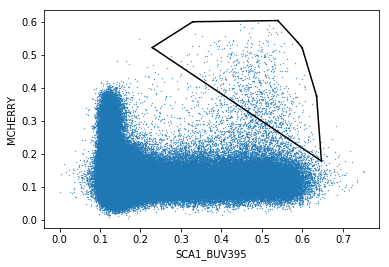

In [395]:
df_list1 = df_list[dep_col]
df_list1[dep_col] = flowutils.transforms.logicle(df_list1[dep_col].values, [i for i in range(len(dep_col))])

temp1 = temp[dep_col]
temp1[dep_col] = flowutils.transforms.logicle(temp1[dep_col].values, [i for i in range(len(dep_col))])

automated_gate(df_list1, temp1, dep_col)

In [377]:
check = df_list[['SCA1_BUV395', 'MCHERRY']]
check[['SCA1_BUV395', 'MCHERRY']] = flowutils.transforms.logicle(check[['SCA1_BUV395', 'MCHERRY']].values, [0,1])

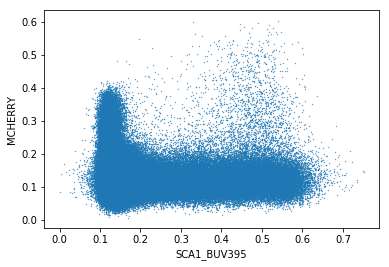

In [378]:
check.plot.scatter(x="SCA1_BUV395",y="MCHERRY",s=0.1)

In [376]:
check.describe()

,SCA1_BUV395,MCHERRY
count,250304.000000,250304.000000
mean,5020.908989,875.648206
std,3148.476126,443.218860
min,-110.552002,-103.358002
25%,3240.999081,591.240349
50%,3723.943142,788.893459
75%,4757.220309,1029.756318
max,19946.900391,4434.029785


In [369]:
df_list[['SCA1_BUV395', 'MCHERRY']].describe()

,SCA1_BUV395,MCHERRY
count,250304.000000,250304.000000
mean,229.328420,28.752511
std,645.778176,91.101847
min,-110.552002,-103.358002
25%,13.042250,-11.946925
50%,29.408299,11.334200
75%,66.524649,40.309174
max,19946.900391,4434.029785


In [309]:
hand = []
for simplex in hull.vertices:
    hand.append(check.values[simplex])
hand=np.array(hand)
hand.shape

(10, 2)

In [315]:
appr_hand = approximate_polygon(hand, tolerance=1000)

In [316]:
appr_hand.shape

(5, 2)

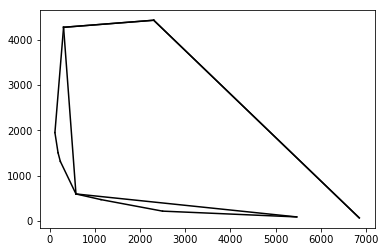

In [317]:
for i in range(hand.shape[0]-1):
    plt.plot([hand[i,0],hand[i+1,0]],[hand[i,1],hand[i+1,1]], "k-")
for i in range(appr_hand.shape[0]-1):
    plt.plot([appr_hand[i,0],appr_hand[i+1,0]],[appr_hand[i,1],appr_hand[i+1,1]], "k-")

In [290]:
for simplex in hull.vertices:
    print(check.values[simplex])

[8.27492969e+04 6.62013016e+01]
[76957.            87.97859955]
[76123.1015625     84.79850006]
[75174.1015625     77.91369629]
[7.39628984e+04 6.13992996e+01]
[7.34812031e+04 5.37943993e+01]
[7.34366016e+04 5.25670013e+01]
[7.20621016e+04 8.47795963e+00]
[7.29413984e+04 3.29403996e+00]
[ 7.40547969e+04 -1.22430003e+00]
[ 7.56392969e+04 -6.50977993e+00]
[7.84702031e+04 2.20530009e+00]
[7.88027969e+04 4.10087013e+00]
[8.04771016e+04 1.42775002e+01]
[8.23191016e+04 3.63441010e+01]


In [293]:
check.values[[143, 18],1]

array([87.97859955, 66.20130157])

In [279]:
hull.simplices

array([[143,  18],
       [ 50, 107],
       [ 57,  18],
       [163,  96],
       [163, 179],
       [116,  96],
       [125,  57],
       [133, 143],
       [133,  93],
       [160, 179],
       [160,  93],
       [ 34,  50],
       [ 34, 116],
       [187, 107],
       [187, 125]], dtype=int32)

In [280]:
hull.vertices

array([ 18, 143, 133,  93, 160, 179, 163,  96, 116,  34,  50, 107, 187,
       125,  57], dtype=int32)

In [144]:
check1 = df_list[['FSC_W', 'SYTOX_RED_APC']]
check1["clus"] = [in_hull(i,simp_arr) for i in check1.values]











  0%|          | 0/120 [00:00<?, ?it/s]









  1%|          | 1/120 [00:29<59:09, 29.82s/it]

KeyboardInterrupt: 

In [180]:
pair_select

('SCA1_BUV395', 'MCHERRY')

In [181]:
outt.shape

(650, 23)

In [182]:
out1 = deepcopy(outt)
outt = 0
cell_count = out1.shape[0]
pair_select = 0
for i in tqdm(list(itertools.combinations(dep_col,2))):
    check = temp[[i[0], i[1]]]
    hull = ConvexHull(check.values)
    check1 = out1[[i[0], i[1]]]
    simp_arr = []
    for simplex in hull.vertices:
        simp_arr.append(check.values[simplex])
    simp_arr = np.array(simp_arr)
    out1["clus_t"] = [in_hull(i,simp_arr) for i in check1.values]
    out = out1.loc[out1.clus_t]
    out1.drop(columns=["clus_t"], inplace=True)
    check1 = out.shape[0]
    if check1<cell_count:
        cell_count = check1
        pair_select=i
        outt = out










  0%|          | 0/120 [00:00<?, ?it/s]








  2%|▏         | 2/120 [00:00<00:11, 10.65it/s]








  2%|▎         | 3/120 [00:00<00:11,  9.88it/s]








  3%|▎         | 4/120 [00:00<00:12,  9.49it/s]








  5%|▌         | 6/120 [00:00<00:11,  9.80it/s]








  6%|▌         | 7/120 [00:00<00:11,  9.44it/s]








  8%|▊         | 9/120 [00:00<00:11,  9.82it/s]








  8%|▊         | 10/120 [00:01<00:11,  9.72it/s]








 10%|█         | 12/120 [00:01<00:10, 10.00it/s]








 12%|█▏        | 14/120 [00:01<00:10, 10.26it/s]








 13%|█▎        | 16/120 [00:01<00:09, 10.81it/s]








 15%|█▌        | 18/120 [00:01<00:09, 10.50it/s]








 17%|█▋        | 20/120 [00:01<00:09, 10.60it/s]








 18%|█▊        | 22/120 [00:02<00:09, 10.77it/s]








 20%|██        | 24/120 [00:02<00:09, 10.51it/s]








 22%|██▏       | 26/120 [00:02<00:08, 10.60it/s]








 23%|██▎       | 28/120 [00:02<00:08, 10.32it/s]








 25%|██▌       | 30/120 [00:02<00:08,

In [183]:
pair_select

('SLAMF1_BV421', 'MCHERRY')

In [184]:
outt.shape

(485, 23)

In [185]:
pd.crosstab(outt.id, columns="count")

col_0,count
id,
0.0,281
1.0,109
2.0,1
3.0,89
4.0,5


In [186]:
out1 = deepcopy(outt)
outt = 0
cell_count = out1.shape[0]
pair_select = 0
for i in tqdm(list(itertools.combinations(dep_col,2))):
    check = temp[[i[0], i[1]]]
    hull = ConvexHull(check.values)
    check1 = out1[[i[0], i[1]]]
    simp_arr = []
    for simplex in hull.vertices:
        simp_arr.append(check.values[simplex])
    simp_arr = np.array(simp_arr)
    out1["clus_t"] = [in_hull(i,simp_arr) for i in check1.values]
    out = out1.loc[out1.clus_t]
    out1.drop(columns=["clus_t"], inplace=True)
    check1 = out.shape[0]
    if check1<cell_count:
        cell_count = check1
        pair_select=i
        outt = out










  0%|          | 0/120 [00:00<?, ?it/s]








  2%|▏         | 2/120 [00:00<00:07, 16.38it/s]








  3%|▎         | 4/120 [00:00<00:07, 15.15it/s]








  5%|▌         | 6/120 [00:00<00:07, 15.33it/s]








  7%|▋         | 8/120 [00:00<00:07, 15.07it/s]








  8%|▊         | 10/120 [00:00<00:07, 14.25it/s]








 10%|█         | 12/120 [00:00<00:07, 14.23it/s]








 12%|█▏        | 14/120 [00:00<00:07, 13.76it/s]








 13%|█▎        | 16/120 [00:01<00:07, 13.67it/s]








 15%|█▌        | 18/120 [00:01<00:07, 13.25it/s]








 17%|█▋        | 20/120 [00:01<00:07, 13.88it/s]








 18%|█▊        | 22/120 [00:01<00:07, 13.55it/s]








 20%|██        | 24/120 [00:01<00:06, 13.98it/s]








 22%|██▏       | 26/120 [00:01<00:06, 13.67it/s]








 23%|██▎       | 28/120 [00:02<00:06, 13.52it/s]








 25%|██▌       | 30/120 [00:02<00:06, 13.34it/s]








 27%|██▋       | 32/120 [00:02<00:06, 13.84it/s]








 28%|██▊       | 34/120 [00:02<00:0

In [187]:
pair_select

('CD11b_BV711', 'MCHERRY')

In [188]:
outt.shape

(424, 23)

In [189]:
pd.crosstab(outt.id, columns="count")

col_0,count
id,
0.0,264
1.0,82
2.0,1
3.0,72
4.0,5


In [190]:
out1 = deepcopy(outt)
outt = 0
cell_count = out1.shape[0]
pair_select = 0
for i in tqdm(list(itertools.combinations(dep_col,2))):
    check = temp[[i[0], i[1]]]
    hull = ConvexHull(check.values)
    check1 = out1[[i[0], i[1]]]
    simp_arr = []
    for simplex in hull.vertices:
        simp_arr.append(check.values[simplex])
    simp_arr = np.array(simp_arr)
    out1["clus_t"] = [in_hull(i,simp_arr) for i in check1.values]
    out = out1.loc[out1.clus_t]
    out1.drop(columns=["clus_t"], inplace=True)
    check1 = out.shape[0]
    if check1<cell_count:
        cell_count = check1
        pair_select=i
        outt = out










  0%|          | 0/120 [00:00<?, ?it/s]








  2%|▏         | 2/120 [00:00<00:06, 17.20it/s]








  3%|▎         | 4/120 [00:00<00:06, 16.87it/s]








  5%|▌         | 6/120 [00:00<00:06, 17.23it/s]








  7%|▋         | 8/120 [00:00<00:06, 17.04it/s]








  8%|▊         | 10/120 [00:00<00:06, 16.74it/s]








 10%|█         | 12/120 [00:00<00:06, 16.43it/s]








 12%|█▏        | 14/120 [00:00<00:06, 16.64it/s]








 13%|█▎        | 16/120 [00:00<00:06, 16.62it/s]








 15%|█▌        | 18/120 [00:01<00:06, 16.07it/s]








 17%|█▋        | 20/120 [00:01<00:06, 16.48it/s]








 18%|█▊        | 22/120 [00:01<00:05, 16.48it/s]








 20%|██        | 24/120 [00:01<00:05, 16.70it/s]








 22%|██▏       | 26/120 [00:01<00:06, 15.57it/s]








 23%|██▎       | 28/120 [00:01<00:05, 15.59it/s]








 25%|██▌       | 30/120 [00:01<00:05, 15.99it/s]








 27%|██▋       | 32/120 [00:01<00:05, 15.66it/s]








 28%|██▊       | 34/120 [00:02<00:0

In [191]:
pair_select

('SSC_A', 'MCHERRY')

In [192]:
outt.shape

(380, 23)

In [193]:
pd.crosstab(outt.id, columns="count")

col_0,count
id,
0.0,258
1.0,60
2.0,1
3.0,57
4.0,4


In [194]:
out1 = deepcopy(outt)
outt = 0
cell_count = out1.shape[0]
pair_select = 0
for i in tqdm(list(itertools.combinations(dep_col,2))):
    check = temp[[i[0], i[1]]]
    hull = ConvexHull(check.values)
    check1 = out1[[i[0], i[1]]]
    simp_arr = []
    for simplex in hull.vertices:
        simp_arr.append(check.values[simplex])
    simp_arr = np.array(simp_arr)
    out1["clus_t"] = [in_hull(i,simp_arr) for i in check1.values]
    out = out1.loc[out1.clus_t]
    out1.drop(columns=["clus_t"], inplace=True)
    check1 = out.shape[0]
    if check1<cell_count:
        cell_count = check1
        pair_select=i
        outt = out










  0%|          | 0/120 [00:00<?, ?it/s]








  2%|▏         | 2/120 [00:00<00:06, 18.56it/s]








  3%|▎         | 4/120 [00:00<00:06, 18.04it/s]








  5%|▌         | 6/120 [00:00<00:06, 18.44it/s]








  7%|▋         | 8/120 [00:00<00:06, 18.65it/s]








  8%|▊         | 10/120 [00:00<00:05, 18.42it/s]








 10%|█         | 12/120 [00:00<00:06, 17.80it/s]








 12%|█▏        | 14/120 [00:00<00:05, 17.97it/s]








 13%|█▎        | 16/120 [00:00<00:05, 18.42it/s]








 15%|█▌        | 18/120 [00:00<00:05, 18.16it/s]








 17%|█▋        | 20/120 [00:01<00:05, 17.41it/s]








 18%|█▊        | 22/120 [00:01<00:05, 17.57it/s]








 20%|██        | 24/120 [00:01<00:05, 17.09it/s]








 22%|██▏       | 26/120 [00:01<00:05, 16.22it/s]








 23%|██▎       | 28/120 [00:01<00:05, 16.75it/s]








 25%|██▌       | 30/120 [00:01<00:05, 16.54it/s]








 27%|██▋       | 32/120 [00:01<00:05, 17.41it/s]








 28%|██▊       | 34/120 [00:01<00:0

In [195]:
pair_select

('FSC_W', 'SYTOX_RED_APC')

In [196]:
outt.shape

(356, 23)

In [197]:
out1 = deepcopy(outt)
outt = 0
cell_count = out1.shape[0]
pair_select = 0
for i in tqdm(list(itertools.combinations(dep_col,2))):
    check = temp[[i[0], i[1]]]
    hull = ConvexHull(check.values)
    check1 = out1[[i[0], i[1]]]
    simp_arr = []
    for simplex in hull.vertices:
        simp_arr.append(check.values[simplex])
    simp_arr = np.array(simp_arr)
    out1["clus_t"] = [in_hull(i,simp_arr) for i in check1.values]
    out = out1.loc[out1.clus_t]
    out1.drop(columns=["clus_t"], inplace=True)
    check1 = out.shape[0]
    if check1<cell_count:
        cell_count = check1
        pair_select=i
        outt = out










  0%|          | 0/120 [00:00<?, ?it/s]








  2%|▏         | 2/120 [00:00<00:05, 19.92it/s]








  3%|▎         | 4/120 [00:00<00:05, 19.52it/s]








  6%|▌         | 7/120 [00:00<00:05, 20.00it/s]








  8%|▊         | 9/120 [00:00<00:05, 19.15it/s]








  9%|▉         | 11/120 [00:00<00:05, 19.22it/s]








 11%|█         | 13/120 [00:00<00:05, 19.20it/s]








 12%|█▎        | 15/120 [00:00<00:05, 18.22it/s]








 14%|█▍        | 17/120 [00:00<00:05, 18.56it/s]








 16%|█▌        | 19/120 [00:01<00:05, 18.87it/s]








 18%|█▊        | 21/120 [00:01<00:05, 18.54it/s]








 19%|█▉        | 23/120 [00:01<00:05, 18.90it/s]








 21%|██        | 25/120 [00:01<00:05, 17.74it/s]








 22%|██▎       | 27/120 [00:01<00:05, 17.94it/s]








 24%|██▍       | 29/120 [00:01<00:04, 18.51it/s]








 26%|██▌       | 31/120 [00:01<00:05, 17.22it/s]








 28%|██▊       | 33/120 [00:01<00:05, 17.19it/s]








 30%|███       | 36/120 [00:01<00:0

In [198]:
pair_select

('LINEAGE_BUV737', 'MCHERRY')

In [199]:
outt.shape

(336, 23)

In [200]:
temp.head()

,FSC_A,FSC_H,FSC_W,SSC_A,SSC_H,SSC_W,SYTOX_RED_APC,CKIT_APC_CY7,CD34_FITC,FCGR_IL7R_A700,SCA1_BUV395,SLAMF1_BV421,CD11b_BV711,LINEAGE_BUV737,MCHERRY,FLK2_PERCP_CY55,branch_id,id,density,p1_0,p1_1,p1_2,p2_0,p2_1,p2_2,p2_3,p2_4,p2_5,p2_6,p2_7,p2_8,p2_9,cell_1,rank_value,branch,pseudotime
30,109160.000000,96292.0,74294.101562,74222.398438,68464.0,71048.101562,31.63970,312.174988,512.356995,12.487500,2687.479980,2885.310059,61.308998,6.668210,1679.969971,61.664001,0,0.0,790.0,-33.537563,78.510001,28.635669,7.735404,2.152272,0.341752,0.241607,0.194924,0.019923,-0.014676,-0.000717,0.000319,0.000296,cube4285_no_cluster|cube4286_no_cluster,14,"('S3', 'S0')",1.614956
32,73743.601562,65142.0,74189.601562,99571.398438,92134.0,70826.296875,29.70780,495.957001,621.885010,55.470699,1396.510010,3504.889893,158.867996,495.869995,1556.079956,-76.994499,0,0.0,5641.0,-32.987790,75.657974,27.077491,6.547719,1.959426,0.205968,0.105474,0.174303,0.022382,-0.014642,-0.000736,0.000244,0.000320,cube4246_no_cluster,24,"('S3', 'S0')",2.426446
62,107866.000000,94413.0,74874.296875,80633.703125,74281.0,71140.796875,8.21792,410.589996,964.557983,-7.187540,1229.160034,5779.209961,-1.529610,267.709015,1485.310059,-10.660900,0,0.0,393.0,-35.093906,77.856970,29.377337,7.723291,2.111512,0.331250,0.235825,0.182825,0.019213,-0.013894,-0.000610,0.000314,0.000290,cube4285_no_cluster|cube4286_no_cluster,14,"('S3', 'S0')",1.614956
137,77077.703125,69129.0,73071.500000,111066.000000,104013.0,69980.203125,24.64180,859.849976,858.762024,73.564598,1101.000000,5674.819824,54.143799,329.493011,1091.800049,41.306599,0,0.0,8579.0,-34.607398,62.613813,22.085887,6.385843,1.848340,0.185148,0.097422,0.125140,0.015893,-0.009947,-0.000516,0.000183,0.000236,cube4206_no_cluster,34,"('S3', 'S0')",2.845032
181,77858.203125,66809.0,76374.703125,99996.203125,91709.0,71458.101562,25.07630,614.668030,764.809021,20.320999,1694.349976,7831.270020,102.508003,254.112000,1597.260010,-81.741898,0,0.0,5641.0,-36.541891,82.296259,32.251143,7.795457,2.343315,0.335961,0.225920,0.191564,0.019706,-0.013889,-0.000691,0.000263,0.000292,cube4289_no_cluster|cube4290_no_cluster,13,"('S3', 'S0')",1.404907


In [202]:
save_path

'../../output/mg3/'

In [210]:
out_col = fut.chan_name[:-2] + ["id"]
out_opt = fut.optn_name[:-2] + ["id & AnsFlg combined"]
temp1 = temp[fut.chan_name[:-2]]
temp1["id"] = 1
temp2 = df_list[fut.chan_name[:-2]]
temp2 = temp2.merge(temp1, on=fut.chan_name[:-2], how="left")
temp2.fillna(0, inplace=True)
temp2.head()

,FSC_A,FSC_H,FSC_W,SSC_A,SSC_H,SSC_W,SYTOX_RED_APC,CKIT_APC_CY7,CD34_FITC,FCGR_IL7R_A700,SCA1_BUV395,SLAMF1_BV421,CD11b_BV711,LINEAGE_BUV737,MCHERRY,FLK2_PERCP_CY55,id
0,150851.000000,122832.0,80485.203125,77687.203125,68548.0,74273.601562,59.540699,1039.930054,290.735992,-6.928180,28.319599,69.509804,69.511703,1220.829956,110.552002,-65.649498,0.0
1,45798.398438,42316.0,70929.203125,71879.296875,67128.0,70174.601562,76.962097,22.481199,883.114014,-11.864500,22.473301,168.587997,172.436005,94.823402,370.894012,696.487976,0.0
2,187656.000000,126574.0,97162.398438,99737.101562,69966.0,93422.101562,7.993700,10.662900,230.253006,8.131660,56.437801,92.105103,21.912201,291.036987,-54.843700,14.321300,0.0
3,111463.000000,96911.0,75376.898438,79071.203125,73355.0,70642.898438,-10.760800,445.398987,7407.370117,73.381897,19.966900,24.941900,88.366501,199.423996,27.810499,-23.930500,0.0
4,130718.000000,109914.0,77940.203125,83094.601562,71834.0,75809.296875,27.973499,255.656006,8473.759766,36.536400,27.761200,106.805000,-18.709801,364.852997,19.262899,192.544998,0.0


In [211]:
with open(save_path+'test_all.fcs', 'wb') as fh:
    create_fcs(event_data = temp2.values.reshape(-1,), channel_names=out_col, file_handle=fh, opt_channel_names=out_opt)

# Parameters' Importance

In [42]:
def parameter_importance(df, dep_col_list, branch_col_name):
    X, y = df_list.loc[:,dep_col_list],df_list.loc[:,branch_col_name]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)
    xg_reg = xgb.XGBClassifier(objective ='reg:logistic', colsample_bytree = 0.3, learning_rate = 0.1,
                               max_depth = 10, alpha = 10, n_estimators = 1000)
    xg_reg.fit(X_train,y_train)
    
    # Print crosstab:
    preds = xg_reg.predict(X_test)
    print(pd.crosstab(y_test, preds))
    
    # Plot features importances:
    xgb.plot_importance(xg_reg,importance_type='gain')
    plt.rcParams['figure.figsize'] = [5, 5]
    plt.show()
    
    # Return sorted features with weight value
    feat_imp = xg_reg.get_booster().get_score(importance_type='gain')
    sorted_x = sorted(feat_imp.items(), key=operator.itemgetter(1), reverse=True)
    return sorted_x

col_0             0    1
branch_check            
0             49898    3
1                 7  153


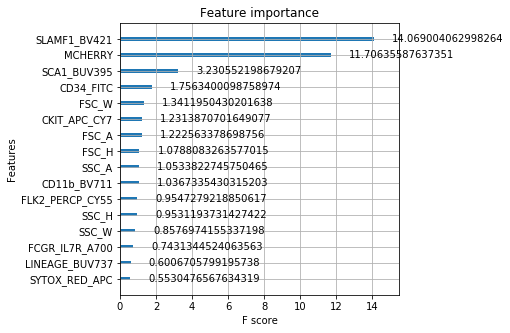

In [43]:
df_list['branch_check'] = [1 if i<70 else 0 for i in df_list.pseudotime]
imp = parameter_importance(df_list, dep_col, 'branch_check')

col_0             0     1
branch_check             
0             48579    58
1                95  1329


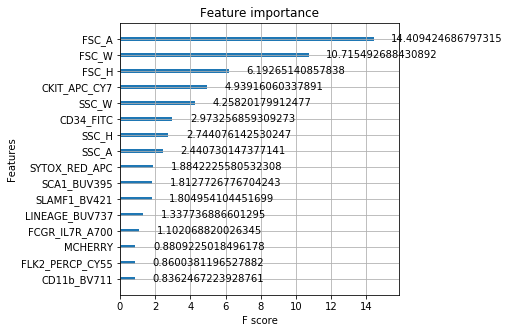

In [44]:
df_list['branch_check'] = [1 if ((i>160) & (j==0)) else 0 for i,j in zip(df_list.pseudotime, df_list.branch_id)]
imp1 = parameter_importance(df_list, dep_col, 'branch_check')

col_0             0    1
branch_check            
0             49198   29
1                16  818


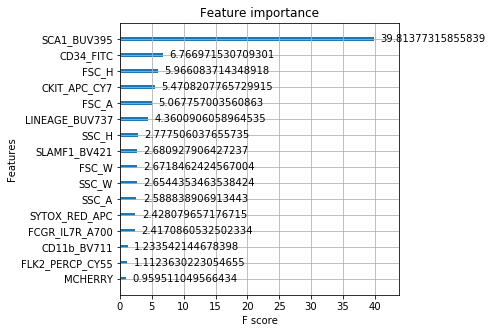

In [45]:
df_list['branch_check'] = [1 if ((i>240) & (j==4)) else 0 for i,j in zip(df_list.pseudotime, df_list.branch_id)]
imp2 = parameter_importance(df_list, dep_col, 'branch_check')

### Crosscheck

In [52]:
in1 = dep_col.index(imp2[0][0])
in2 = dep_col.index(imp2[1][0])
t = [in1, in2]
t.sort()
dep_col_lin = dep_col[:t[0]]+dep_col[t[0]+1:t[1]]+dep_col[t[1]+1:]
# Drop Lineage
X_input = preprocessing.scale(df_list[dep_col_lin])
phate_operator = phate.PHATE(n_jobs=-2,knn=50)
Y_phate = phate_operator.fit_transform(X_input)

phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate3d_lin.npy",Y_phate_3d)

Calculating PHATE...
  Running PHATE on 250304 cells and 14 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1341.17 seconds.
    Calculating affinities...
    Calculated affinities in 75.61 seconds.
  Calculated graph and diffusion operator in 1422.80 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 402.19 seconds.
    Calculating KMeans...
    Calculated KMeans in 93.75 seconds.
  Calculated landmark operator in 506.58 seconds.
  Calculating optimal t...
    Automatically selected t = 23
  Calculated optimal t in 5.45 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.58 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 31.23 seconds.
Calculated PHATE in 1967.71 seconds.
Calculating metric MDS...
Calculated metric MDS in 49.70 seconds.


In [59]:
in1 = dep_col.index(imp1[0][0])
in2 = dep_col.index(imp1[1][0])
in3 = dep_col.index(imp1[2][0])
t = [in1, in2, in3]
t.sort()
dep_col_lin = dep_col[:t[0]]+dep_col[t[0]+1:t[1]]+dep_col[t[1]+1:t[2]] + dep_col[t[2]+1:]

X_input = preprocessing.scale(df_list[dep_col_lin])
phate_operator = phate.PHATE(n_jobs=-2,knn=50)
Y_phate = phate_operator.fit_transform(X_input)

phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate3d_sscw.npy",Y_phate_3d)

Calculating PHATE...
  Running PHATE on 250304 cells and 13 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1445.61 seconds.
    Calculating affinities...
    Calculated affinities in 78.35 seconds.
  Calculated graph and diffusion operator in 1529.85 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 412.59 seconds.
    Calculating KMeans...
    Calculated KMeans in 88.74 seconds.
  Calculated landmark operator in 512.18 seconds.
  Calculating optimal t...
    Automatically selected t = 24
  Calculated optimal t in 5.78 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.19 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 16.82 seconds.
Calculated PHATE in 2065.91 seconds.
Calculating metric MDS...
Calculated metric MDS in 27.14 seconds.


In [54]:
in1 = dep_col.index(imp[0][0])
in2 = dep_col.index(imp[1][0])
t1 = min(in1,in2)
t2 = max(in1,in2)
dep_col_lin = dep_col[:t1]+dep_col[t1+1:t2]+dep_col[t2+1:]

X_input = preprocessing.scale(df_list[dep_col_lin])
phate_operator = phate.PHATE(n_jobs=-2,knn=50)
Y_phate = phate_operator.fit_transform(X_input)

phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate3d_mcherry.npy",Y_phate_3d)

Calculating PHATE...
  Running PHATE on 250304 cells and 14 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1154.72 seconds.
    Calculating affinities...
    Calculated affinities in 64.20 seconds.
  Calculated graph and diffusion operator in 1224.44 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 355.28 seconds.
    Calculating KMeans...
    Calculated KMeans in 75.56 seconds.
  Calculated landmark operator in 438.73 seconds.
  Calculating optimal t...
    Automatically selected t = 24
  Calculated optimal t in 4.35 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.91 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 22.97 seconds.
Calculated PHATE in 1691.47 seconds.
Calculating metric MDS...
Calculated metric MDS in 19.17 seconds.


In [63]:
Y_phate_3d = np.load(save_path + "phate3d_lin.npy")

temp1 = {}
temp1["x"] = Y_phate_3d[:,0]
temp1["y"] = Y_phate_3d[:,1]
temp1["z"] = Y_phate_3d[:,2]
temp1["cid"] = df_list.branch_id
temp1 = pd.DataFrame(temp1)
from sklearn.preprocessing import MinMaxScaler
import json
scaler = MinMaxScaler( feature_range=( -100, 100 ))
temp1[[ 'x', 'y', 'z' ]] = scaler.fit_transform( temp1[[ 'x', 'y', 'z' ]])

d_json = { 'points': json.loads( temp1.astype( str ).to_json( None, orient= 'records' )) }
json.dump( d_json, open("../../data/newData/data.json", 'w' ))

## Evaluate 3d map complexity

In [7]:
df_list.head()

,FSC_A,FSC_H,FSC_W,SSC_A,SSC_H,SSC_W,SYTOX_RED_APC,CKIT_APC_CY7,CD34_FITC,FCGR_IL7R_A700,SCA1_BUV395,SLAMF1_BV421,CD11b_BV711,LINEAGE_BUV737,MCHERRY,FLK2_PERCP_CY55,id,density,branch,pseudotime,branch_id
0,150851.000000,122832.0,80485.203125,77687.203125,68548.0,74273.601562,59.540699,1039.930054,290.735992,-6.928180,28.319599,69.509804,69.511703,1220.829956,110.552002,-65.649498,4.0,21919.0,"('S8', 'S5')",141.850511,0
1,45798.398438,42316.0,70929.203125,71879.296875,67128.0,70174.601562,76.962097,22.481199,883.114014,-11.864500,22.473301,168.587997,172.436005,94.823402,370.894012,696.487976,4.0,6799.0,"('S2', 'S0')",266.593760,1
2,187656.000000,126574.0,97162.398438,99737.101562,69966.0,93422.101562,7.993700,10.662900,230.253006,8.131660,56.437801,92.105103,21.912201,291.036987,-54.843700,14.321300,4.0,6549.0,"('S8', 'S5')",147.076550,0
3,111463.000000,96911.0,75376.898438,79071.203125,73355.0,70642.898438,-10.760800,445.398987,7407.370117,73.381897,19.966900,24.941900,88.366501,199.423996,27.810499,-23.930500,4.0,32124.0,"('S5', 'S0')",134.977930,2
4,130718.000000,109914.0,77940.203125,83094.601562,71834.0,75809.296875,27.973499,255.656006,8473.759766,36.536400,27.761200,106.805000,-18.709801,364.852997,19.262899,192.544998,4.0,62926.0,"('S7', 'S4')",157.554987,3


In [18]:
# branch: top :7, bottom: 0, 5, 3,6,1,4, mid: 8,2
clusa = df_list.loc[df_list.branch_id==2]
print(clusa.pseudotime.median())
print(clusa.pseudotime.describe())

131.31446969519072
count    42154.000000
mean       129.310453
std          4.251338
min        117.789711
25%        125.438317
50%        131.314470
75%        132.420771
max        137.251888
Name: pseudotime, dtype: float64


In [29]:
df_list['branch_check'] = [1 if ((i==7) & (j<107)) else 2 if ((i==0) & (j>160)) else 3 if ((i==5) & (j>158)) 
                           else 4 if ((i==3) & (j>175)) else 5 if ((i==6) & (j>200)) else 6 if ((i==1) & (j>250)) 
                           else 7 if ((i==4) & (j>250)) 
                           else 0 for i,j in zip(df_list.branch_id, df_list.pseudotime)]
pd.crosstab(df_list.branch_check, columns='count')

col_0,count
branch_check,
0,217744
1,3833
2,7094
3,2804
4,7004
5,4393
6,4761
7,2671


In [133]:
def parameter_importance(df, dep_col_list, branch_col_name):
    X, y = df_list.loc[:,dep_col_list],df_list.loc[:,branch_col_name]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)
    xg_reg = xgb.XGBClassifier(objective ='multi:softmax', colsample_bytree = 0.3, learning_rate = 0.1, n_gpus=1,
                               max_depth = 5, alpha = 10, n_estimators = 1000, num_class = 8, n_jobs=20)
    xg_reg.fit(X_train,y_train)
    
    # Print crosstab:
    preds = xg_reg.predict(X_test)
    print(pd.crosstab(y_test, preds))
    
    # Plot features importances:
    xgb.plot_importance(xg_reg,importance_type='gain')
    plt.rcParams['figure.figsize'] = [5, 5]
    plt.show()
    
    # Return sorted features with weight value
    feat_imp = xg_reg.get_booster().get_score(importance_type='gain')
    sorted_x = sorted(feat_imp.items(), key=operator.itemgetter(1), reverse=True)
    return sorted_x, xg_reg, X_test, y_test

col_0             0    1     2    3     4    5    6    7
branch_check                                            
0             43285   23    58   44    66   63   17   21
1                62  675     0    0     0    2    0    0
2                63    0  1361    0     0    0    0    0
3                58    0     0  485     0    0    0    0
4                76    0     0    0  1293    0    0    0
5               206    1     0    0     0  679   17    0
6                24    0     0    0     0    9  958    0
7                19    0     0    0     0    0    0  496


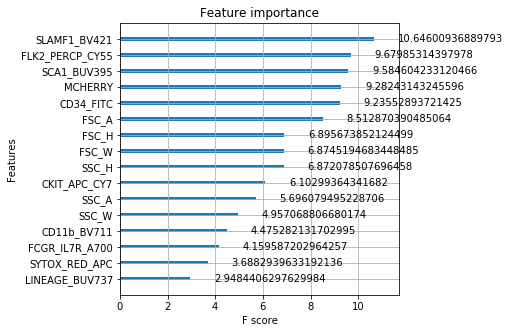

In [150]:
imp, xg_reg, X_test, y_test = parameter_importance(df_list, dep_col, 'branch_check')
dep_col_sort = [imp[i][0] for i in range(len(dep_col))]

In [151]:
out_df = {'num_par':[],'num_branch':[], 'base_score':[], 'branch_score':[]}

preds = xg_reg.predict(X_test)
# baseline_score = (1/4)*total_acc + (1/4)*mean(branch_acc) + 1/2(num_branch)
baseline_score = 0.5
cor = [1 if i==j else 0 for i,j in zip(y_test, preds)]
baseline_score += (1/4)*sum(cor)/len(y_test)
branch_acc = 0
for k in range(1,8):
    cor1 = [1 if i==j==k else 0 for i,j in zip(y_test, preds)]
    act1 = [1 if i==k else 0 for i in y_test]
    branch_acc += sum(cor1)/sum(act1)
branch_acc /= 7
baseline_score += (1/4)*branch_acc
out_df['num_par'].append(16)
out_df['num_branch'].append(7)
out_df['base_score'].append(baseline_score)
out_df['branch_score'].append(branch_acc)
branch_score = branch_acc
baseline_score

0.9740233014982731

In [152]:
def cal_score(model, xtest, ytest, num_branch):
    pred = model.predict(xtest)
    baseline_score=0
    cor = [1 if i==j else 0 for i,j in zip(ytest, pred)]
    baseline_score += (1/4)*sum(cor)/len(ytest)
    branch = 0
    branch_acc=0
    for k in range(1,num_branch):
        cor1 = [1 if i==j==k else 0 for i,j in zip(ytest, pred)]
        act1 = [1 if i==k else 0 for i in ytest]
        branch_acc += sum(cor1)/sum(act1)
        if sum(cor1)/sum(act1)>0.5:
            branch+=1
    branch_acc /= (num_branch-1)
    branch /= (num_branch-1)
    baseline_score += (1/4)*branch_acc
    baseline_score += 0.5*branch
    return baseline_score, branch, branch_acc

col_0             0    1     2    3     4    5    6    7
branch_check                                            
0             43160   25    69   75   116   68   21   43
1                56  681     0    0     0    2    0    0
2                77    0  1347    0     0    0    0    0
3                77    0     0  466     0    0    0    0
4               120    0     0    0  1249    0    0    0
5               226    1     0    0     0  660   16    0
6                31    0     0    0     0    8  952    0
7                43    0     0    0     0    0    0  472


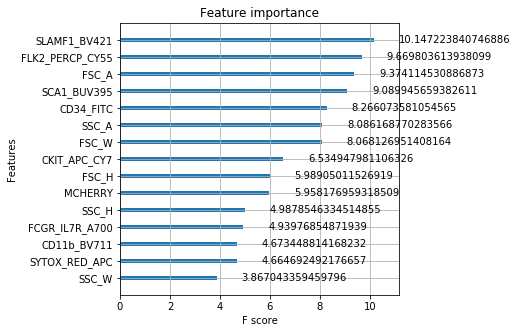

col_0             0    1     2    3     4    5    6    7
branch_check                                            
0             43100   33    91   69   129   75   36   44
1                60  677     0    0     0    2    0    0
2               104    0  1320    0     0    0    0    0
3                82    0     0  461     0    0    0    0
4               137    0     0    0  1232    0    0    0
5               234    1     0    0     0  645   23    0
6                53    0     0    0     0   10  928    0
7                47    0     0    0     0    0    0  468


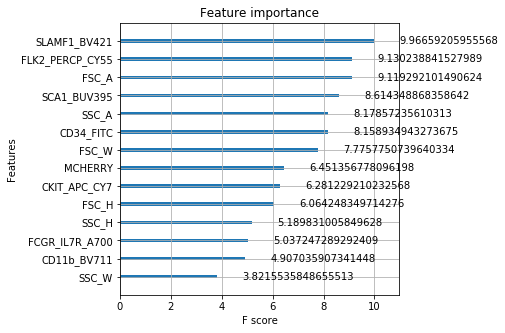

col_0             0    1     2    3     4    5    6    7
branch_check                                            
0             42987   33    92   66   170   97   75   57
1                66  671     0    0     0    2    0    0
2               109    0  1315    0     0    0    0    0
3                92    0     0  451     0    0    0    0
4               216    0     0    0  1153    0    0    0
5               304    1     0    0     0  583   15    0
6               108    0     0    0     0    6  877    0
7                51    0     0    0     0    0    0  464


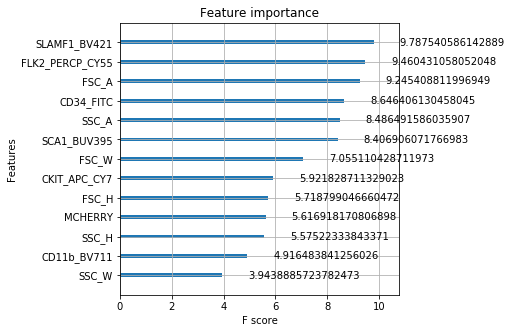

col_0             0    1     2    3     4    5    6    7
branch_check                                            
0             42855   36    99   72   182  155  107   71
1                68  670     0    0     0    1    0    0
2               107    0  1317    0     0    0    0    0
3               126    0     0  417     0    0    0    0
4               210    0     0    0  1159    0    0    0
5               474    1     0    1     0  404   23    0
6               151    0     0    0     0   12  828    0
7                58    0     0    0     0    0    0  457


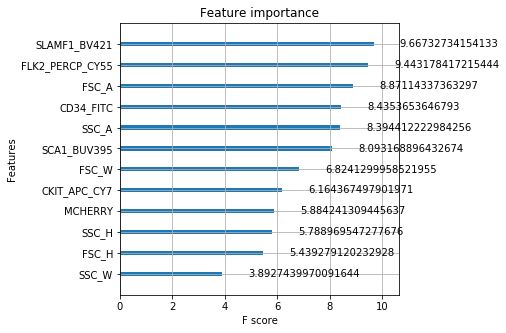

col_0             0    1     2    3     4    5    6    7
branch_check                                            
0             42819   36   110   77   185  152  113   85
1                72  666     0    0     0    1    0    0
2               124    0  1300    0     0    0    0    0
3               133    0     0  410     0    0    0    0
4               210    0     0    0  1159    0    0    0
5               478    0     0    1     0  396   28    0
6               148    0     0    0     0   12  831    0
7                61    0     0    0     0    0    0  454


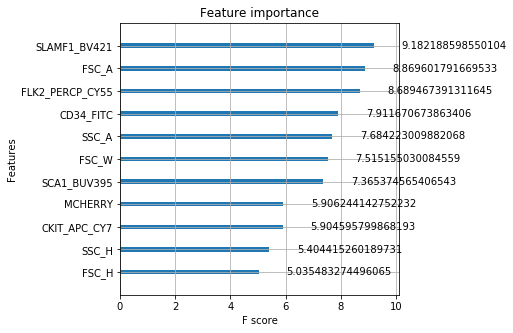

col_0             0    1     2    3     4    5    6    7
branch_check                                            
0             42812   36   130   75   186  159  103   76
1                69  669     0    0     0    1    0    0
2               143    0  1281    0     0    0    0    0
3               127    0     0  416     0    0    0    0
4               227    0     0    0  1142    0    0    0
5               491    0     0    1     0  387   24    0
6               157    0     0    0     0   10  824    0
7                58    0     0    0     0    0    0  457


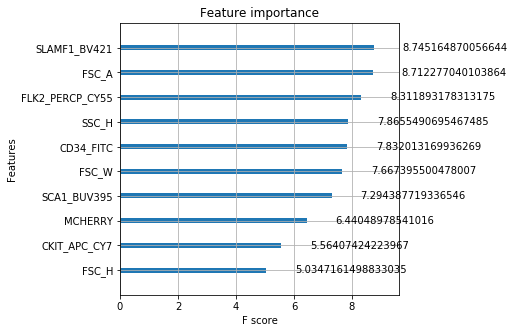

col_0             0    1     2    3     4    5    6    7
branch_check                                            
0             42745   37   176   75   201  152  113   78
1                76  661     0    0     0    2    0    0
2               243    0  1181    0     0    0    0    0
3               147    0     0  396     0    0    0    0
4               259    0     0    0  1110    0    0    0
5               564    0     0    1     0  312   26    0
6               158    0     0    0     0   13  820    0
7                54    0     0    0     0    0    0  461


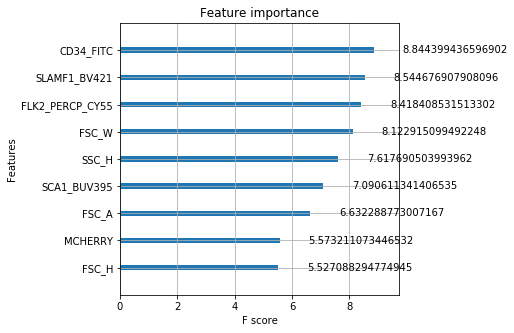

col_0             0    1     2    3    4    5    6    7
branch_check                                           
0             42733   34   194   82  269   72  112   81
1                83  654     0    0    0    1    0    1
2               332    0  1092    0    0    0    0    0
3               143    0     0  400    0    0    0    0
4               452    0     0    0  917    0    0    0
5               778    0     0    1    0  105   19    0
6               184    0     0    0    0    5  802    0
7                59    0     0    0    0    0    0  456


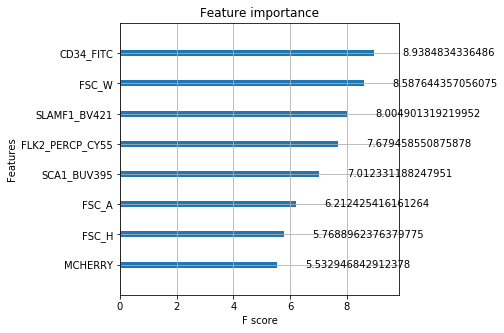

col_0             0    1     2    3    4   5    6    7
branch_check                                          
0             42767   38   187   85  248  37  120   95
1                90  647     0    0    0   2    0    0
2               356    0  1066    0    2   0    0    0
3               133    0     0  410    0   0    0    0
4               513    0     0    0  856   0    0    0
5               821    0     0    1    0  57   24    0
6               185    0     0    0    0   5  801    0
7                54    0     0    0    0   0    0  461


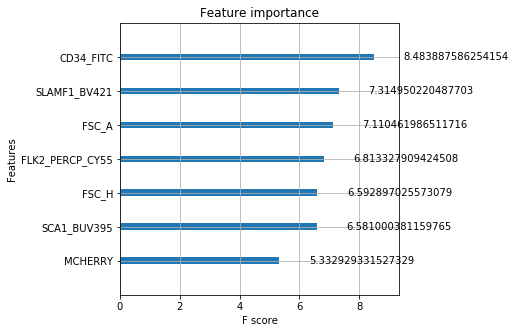

col_0             0    1    2    3    4   5    6    7
branch_check                                         
0             42739   42  245   83  242   8  131   87
1               108  630    1    0    0   0    0    0
2               490    0  933    0    1   0    0    0
3               130    0    0  412    0   1    0    0
4               639    0    0    0  730   0    0    0
5               853    0    0    1    0  24   25    0
6               193    0    0    0    0   2  796    0
7                63    0    0    0    0   0    0  452


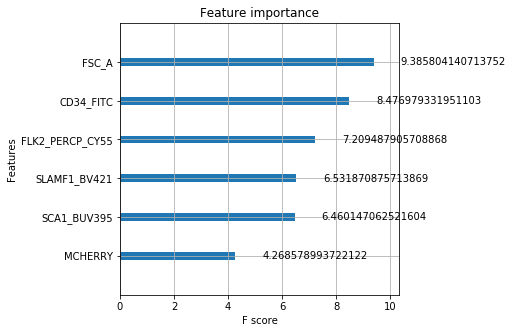

col_0             0    1    2    3    4   5    6    7
branch_check                                         
0             42869   43   98   95  228   4  141   99
1               114  624    0    0    0   0    1    0
2              1317    0  107    0    0   0    0    0
3               142    0    0  401    0   0    0    0
4               841    0    0    0  528   0    0    0
5               859    0    1    2    0  20   21    0
6               202    0    0    1    0   0  788    0
7                63    0    0    0    0   0    0  452


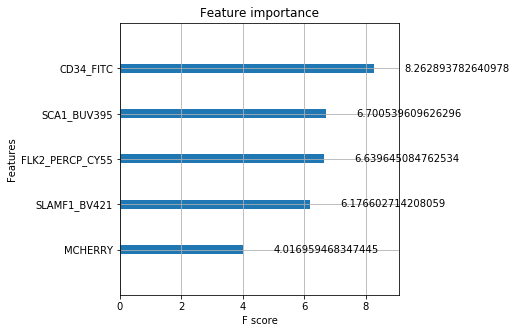

col_0             0    1   2    3   4   5    6    7
branch_check                                       
0             43129   47  12  102  23   2  139  123
1               107  631   0    0   0   0    1    0
2              1417    0   5    0   2   0    0    0
3               148    0   0  395   0   0    0    0
4              1333    0   0    0  36   0    0    0
5               867    0   0    0   0  21   15    0
6               200    0   0    1   0   0  790    0
7                85    0   0    0   0   0    0  430


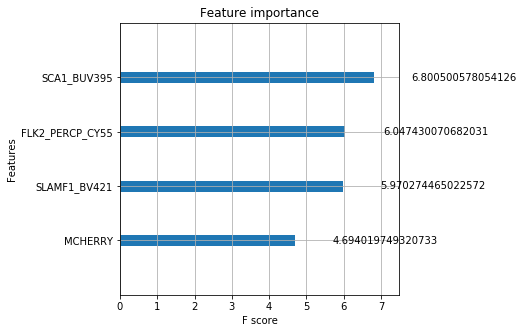

col_0             0    1  2    3  4   5    6    7
branch_check                                     
0             43125   53  8   99  3   2  159  128
1               141  598  0    0  0   0    0    0
2              1420    0  3    0  1   0    0    0
3               144    0  0  393  0   0    6    0
4              1367    0  0    0  1   0    1    0
5               858    0  0    1  0  16   28    0
6               307    0  0    2  0   3  679    0
7                89    0  0    0  0   0    0  426


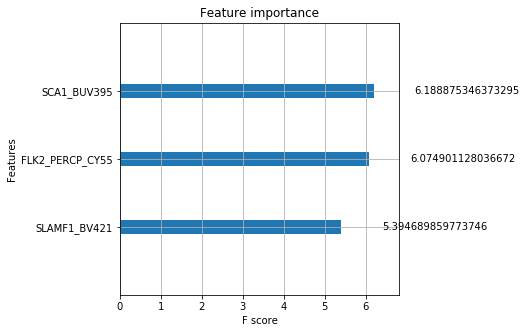

col_0             0    1  2    3  4   5    6
branch_check                                
0             43234   48  3  114  1   1  176
1               181  558  0    0  0   0    0
2              1424    0  0    0  0   0    0
3               134    0  0  373  0   0   36
4              1368    0  0    0  0   0    1
5               856    0  0    2  0  16   29
6               353    0  0   35  0   2  601
7               515    0  0    0  0   0    0


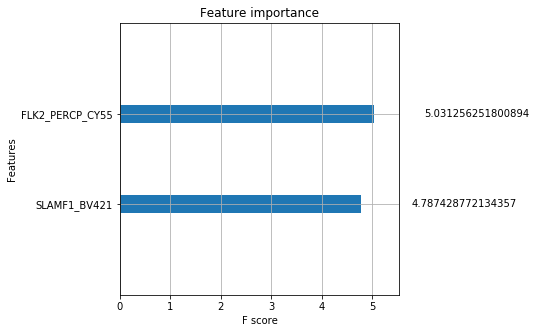

col_0             0    1  2  3  4  5  6  7
branch_check                              
0             43509   52  3  2  4  3  2  2
1               183  556  0  0  0  0  0  0
2              1424    0  0  0  0  0  0  0
3               543    0  0  0  0  0  0  0
4              1369    0  0  0  0  0  0  0
5               895    7  1  0  0  0  0  0
6               991    0  0  0  0  0  0  0
7               515    0  0  0  0  0  0  0


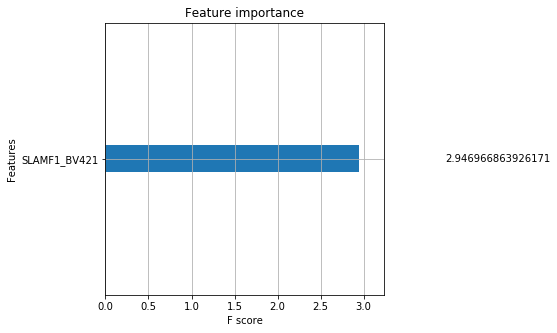

In [153]:
for k in range(15,0,-1):
    imp1, xg_reg1, X_test, y_test = parameter_importance(df_list, dep_col_sort[:k], 'branch_check')
    base_1, branch_1, branchacc_1 = cal_score(xg_reg1,X_test, y_test,8)
    out_df['num_par'].append(k)
    out_df['num_branch'].append(int(7*branch_1))
    out_df['base_score'].append(base_1)
    out_df['branch_score'].append(branchacc_1)

In [154]:
out_df = pd.DataFrame(out_df)
out_df

,num_par,num_branch,base_score,branch_score
0,16,7,0.974023,0.912653
1,15,7,0.967709,0.892290
2,14,7,0.963552,0.878776
3,13,7,0.954202,0.847970
4,12,6,0.869397,0.802335
5,11,6,0.867541,0.796349
6,10,6,0.866526,0.793227
7,9,6,0.857140,0.761715
8,8,6,0.837983,0.695616
9,7,6,0.834002,0.681569


In [8]:
def parameter_importance_branch(df, dep_col_list, branch_col_name):
    X, y = df_list.loc[:,dep_col_list],df_list.loc[:,branch_col_name]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)
    xg_reg = xgb.XGBClassifier(objective ='multi:softmax', colsample_bytree = 0.3, learning_rate = 0.1, n_gpus=1,
                               max_depth = 5, alpha = 10, n_estimators = 1000, num_class = 2, n_jobs=20)
    xg_reg.fit(X_train,y_train)
    
    # Print crosstab:
    preds = xg_reg.predict(X_test)
    print(pd.crosstab(y_test, preds))
    
    # Plot features importances:
    xgb.plot_importance(xg_reg,importance_type='gain')
    plt.rcParams['figure.figsize'] = [5, 5]
    plt.show()
    
    # Return sorted features with weight value
    feat_imp = xg_reg.get_booster().get_score(importance_type='gain')
    sorted_x = sorted(feat_imp.items(), key=operator.itemgetter(1), reverse=True)
    return sorted_x, xg_reg, X_test, y_test

def cal_score_branch(model, xtest, ytest, num_branch):
    pred = model.predict(xtest)
    baseline_score=0
    cor = [1 if i==j==1 else 0 for i,j in zip(y_test, pred)]
    tru = [1 if i==1 else 0 for i in y_test]
    branch_acc = sum(cor)/sum(tru)
    baseline_score += (1/2)*branch_acc
    if branch_acc>0.5:
        branch=1
        baseline_score += 0.5
    else:
        branch=0
    return baseline_score, branch, branch_acc

df_list['branch_check'] = [1 if ((i==7) & (j<107))
                           else 0 for i,j in zip(df_list.branch_id, df_list.pseudotime)]
imp, xg_reg, X_test, y_test = parameter_importance_branch(df_list, dep_col, 'branch_check')
dep_col_sort = [imp[i][0] for i in range(len(dep_col))]

In [178]:
out_df = {'num_par':[],'num_branch':[], 'base_score':[], 'branch_score':[]}

preds = xg_reg.predict(X_test)
# baseline_score = 0.5*num_branch + 0.5*accuracy
baseline_score = 0.5
cor = [1 if i==j==1 else 0 for i,j in zip(y_test, preds)]
tru = [1 if i==1 else 0 for i in y_test]
branch_acc = sum(cor)/sum(tru)

baseline_score += (1/2)*branch_acc
out_df['num_par'].append(16)
out_df['num_branch'].append(1)
out_df['base_score'].append(baseline_score)
out_df['branch_score'].append(branch_acc)
baseline_score

0.9587280108254398

col_0             0    1
branch_check            
0             49293   29
1                60  679


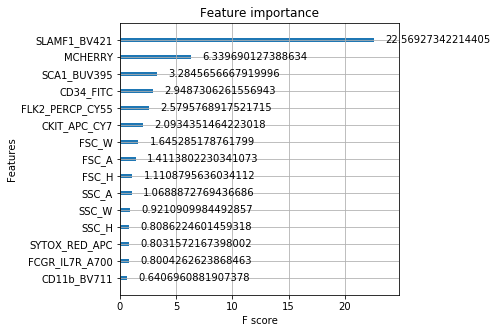

0.918809201623816
col_0             0    1
branch_check            
0             49291   31
1                64  675


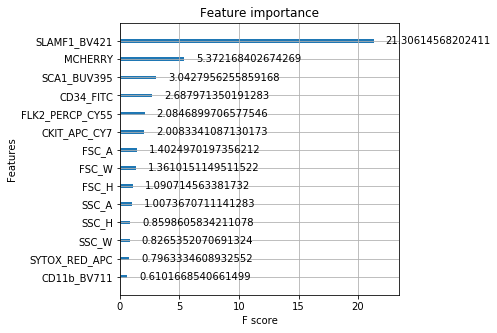

0.9133964817320703
col_0             0    1
branch_check            
0             49290   32
1                73  666


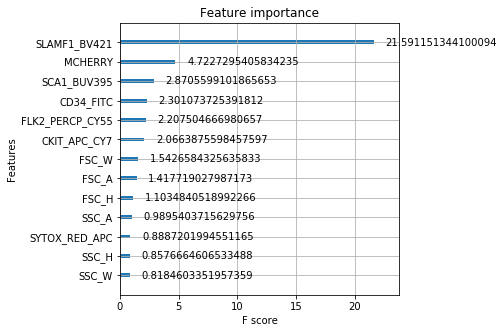

0.9012178619756428
col_0             0    1
branch_check            
0             49288   34
1                77  662


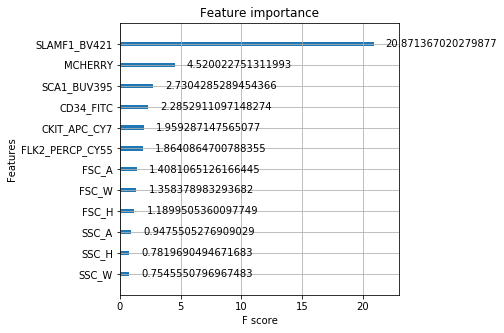

0.8958051420838972
col_0             0    1
branch_check            
0             49287   35
1                79  660


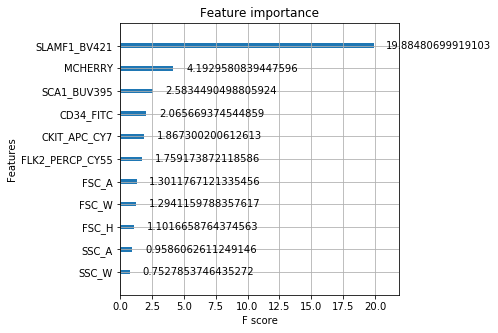

0.8930987821380244
col_0             0    1
branch_check            
0             49285   37
1                69  670


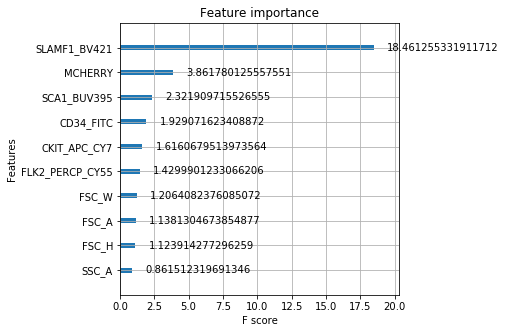

0.9066305818673883
col_0             0    1
branch_check            
0             49287   35
1                81  658


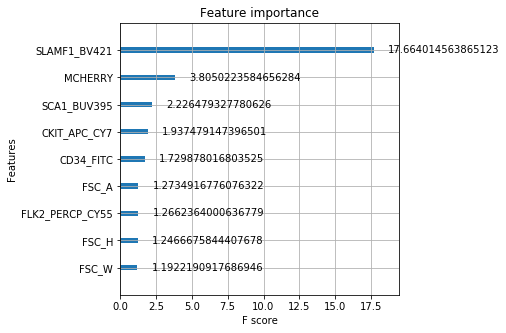

0.8903924221921515
col_0             0    1
branch_check            
0             49285   37
1                86  653


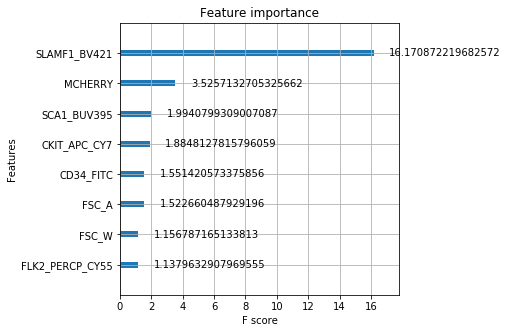

0.8836265223274695
col_0             0    1
branch_check            
0             49282   40
1                86  653


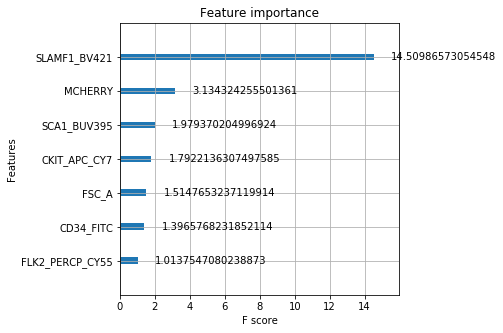

0.8836265223274695
col_0             0    1
branch_check            
0             49274   48
1               111  628


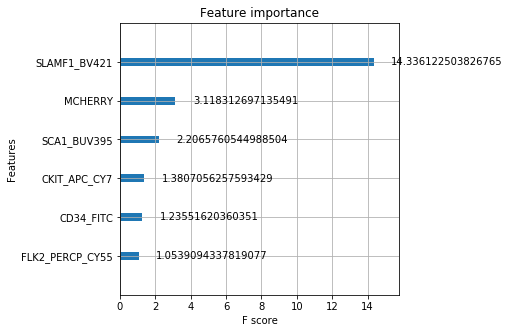

0.8497970230040596
col_0             0    1
branch_check            
0             49265   57
1               111  628


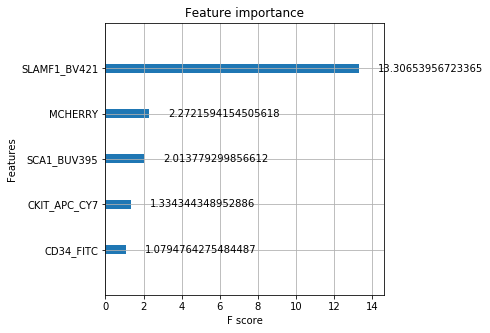

0.8497970230040596
col_0             0    1
branch_check            
0             49265   57
1               122  617


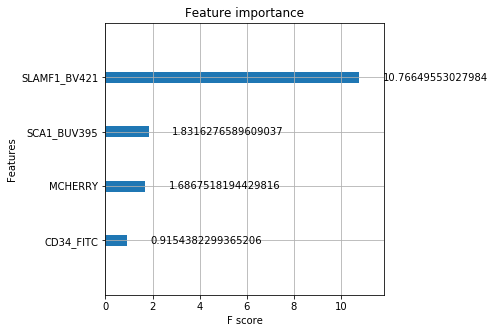

0.8349120433017592
col_0             0    1
branch_check            
0             49256   66
1               122  617


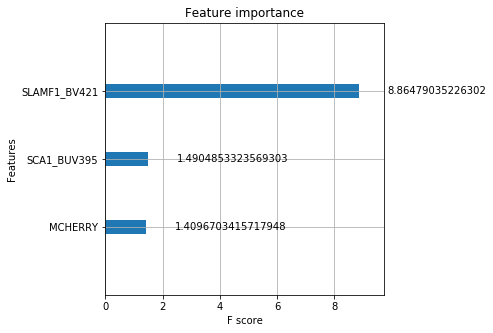

0.8349120433017592
col_0             0    1
branch_check            
0             49253   69
1               151  588


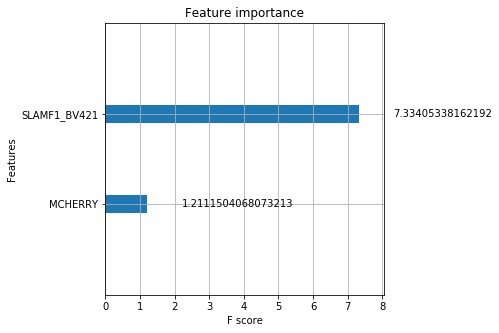

0.7956698240866035
col_0             0    1
branch_check            
0             49259   63
1               178  561


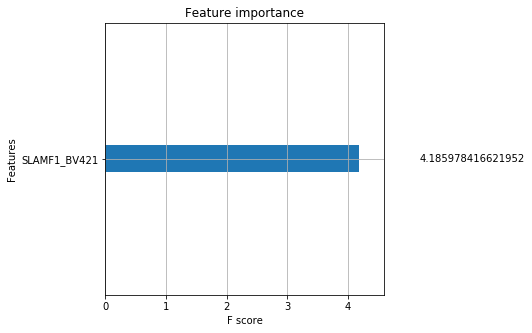

0.7591339648173207


In [179]:
for k in range(15,0,-1):
    imp1, xg_reg1, X_test, y_test = parameter_importance_branch(df_list, dep_col_sort[:k], 'branch_check')
    base_1, branch_1, branchacc_1 = cal_score_branch(xg_reg1,X_test, y_test,8)
    print(branchacc_1)
    out_df['num_par'].append(k)
    out_df['num_branch'].append(branch_1)
    out_df['base_score'].append(base_1)
    out_df['branch_score'].append(branchacc_1)

In [180]:
out_df = pd.DataFrame(out_df)
out_df

,num_par,num_branch,base_score,branch_score
0,16,1,0.958728,0.917456
1,15,1,0.959405,0.918809
2,14,1,0.956698,0.913396
3,13,1,0.950609,0.901218
4,12,1,0.947903,0.895805
5,11,1,0.946549,0.893099
6,10,1,0.953315,0.906631
7,9,1,0.945196,0.890392
8,8,1,0.941813,0.883627
9,7,1,0.941813,0.883627


In [181]:
dep_col_sort[:1]

['SLAMF1_BV421']

In [39]:
X_input = preprocessing.scale(df_list[dep_col_sort[:4]])
phate_operator = phate.PHATE(n_jobs=-2,knn=50)
Y_phate = phate_operator.fit_transform(X_input)
phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
np.save(save_path + "phate3d_br4.npy",Y_phate_3d)

Calculating PHATE...
  Running PHATE on 250304 cells and 4 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 124.25 seconds.
    Calculating affinities...
    Calculated affinities in 41.84 seconds.
  Calculated graph and diffusion operator in 170.22 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 236.44 seconds.
    Calculating KMeans...
    Calculated KMeans in 78.54 seconds.
  Calculated landmark operator in 321.26 seconds.
  Calculating optimal t...
    Automatically selected t = 24
  Calculated optimal t in 1.40 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.22 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 10.06 seconds.
Calculated PHATE in 503.20 seconds.
Calculating metric MDS...
Calculated metric MDS in 14.63 seconds.


In [40]:
Y_phate_3d = np.load(save_path + "phate3d_br4.npy")

temp1 = {}
temp1["x"] = Y_phate_3d[:,0]
temp1["y"] = Y_phate_3d[:,1]
temp1["z"] = Y_phate_3d[:,2]
temp1["cid"] = df_list.branch_id
temp1 = pd.DataFrame(temp1)
from sklearn.preprocessing import MinMaxScaler
import json
scaler = MinMaxScaler( feature_range=( -100, 100 ))
temp1[[ 'x', 'y', 'z' ]] = scaler.fit_transform( temp1[[ 'x', 'y', 'z' ]])

d_json = { 'points': json.loads( temp1.astype( str ).to_json( None, orient= 'records' )) }
json.dump( d_json, open("../../data/newData/data.json", 'w' ))

col_0             0     1
branch_check             
0             48579    58
1                72  1352


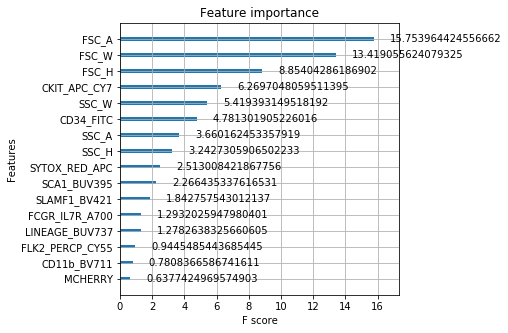

In [191]:
df_list['branch_check'] = [1 if ((i==0) & (j>160))
                           else 0 for i,j in zip(df_list.branch_id, df_list.pseudotime)]
imp, xg_reg, X_test, y_test = parameter_importance_branch(df_list, dep_col, 'branch_check')
dep_col_sort = [imp[i][0] for i in range(len(dep_col))]

col_0             0     1
branch_check             
0             48575    62
1                70  1354


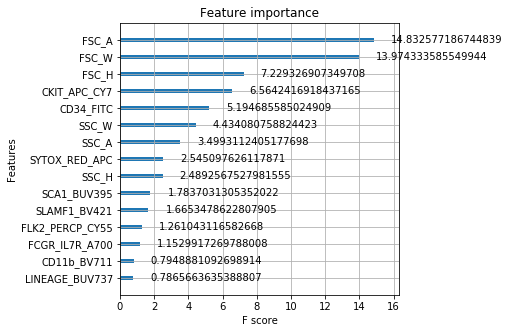

0.9508426966292135
col_0             0     1
branch_check             
0             48572    65
1                63  1361


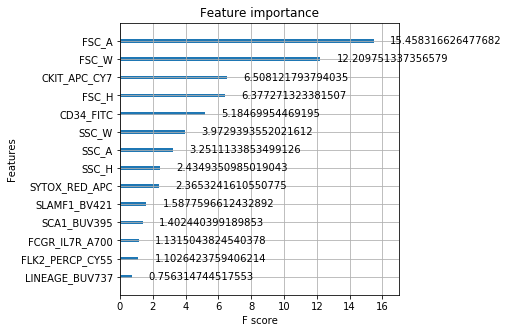

0.9557584269662921
col_0             0     1
branch_check             
0             48573    64
1                74  1350


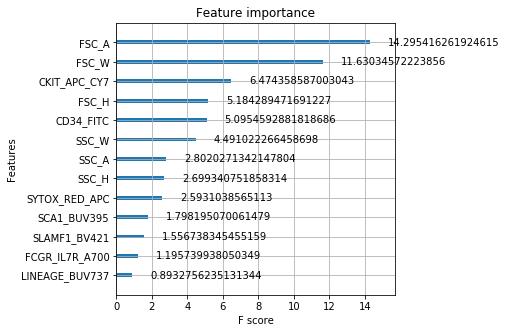

0.9480337078651685
col_0             0     1
branch_check             
0             48559    78
1                79  1345


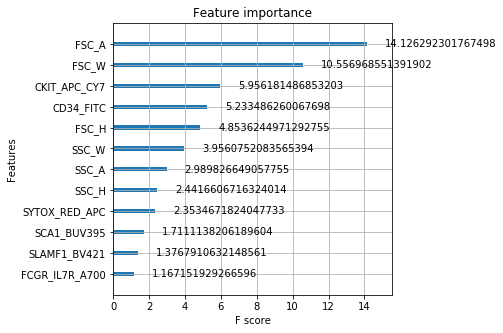

0.9445224719101124
col_0             0     1
branch_check             
0             48562    75
1                83  1341


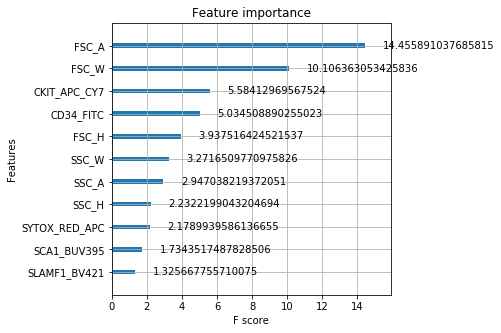

0.9417134831460674
col_0             0     1
branch_check             
0             48528   109
1               102  1322


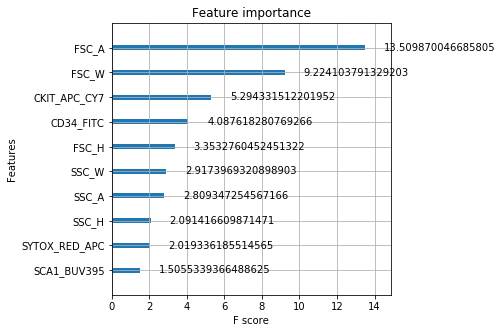

0.9283707865168539
col_0             0     1
branch_check             
0             48539    98
1               111  1313


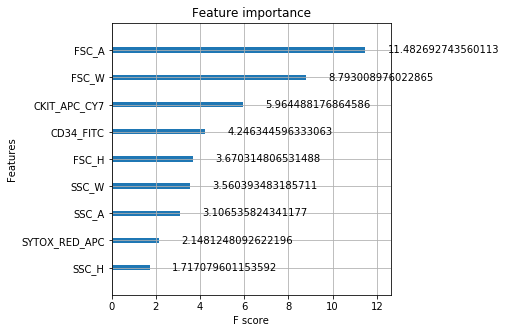

0.9220505617977528
col_0             0     1
branch_check             
0             48511   126
1               137  1287


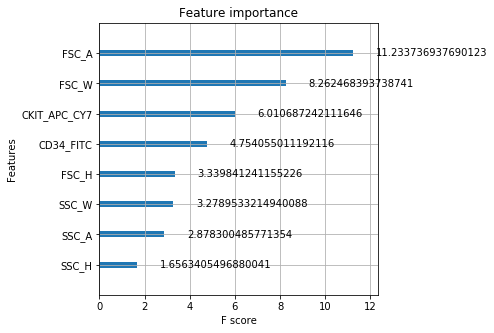

0.9037921348314607
col_0             0     1
branch_check             
0             48513   124
1               133  1291


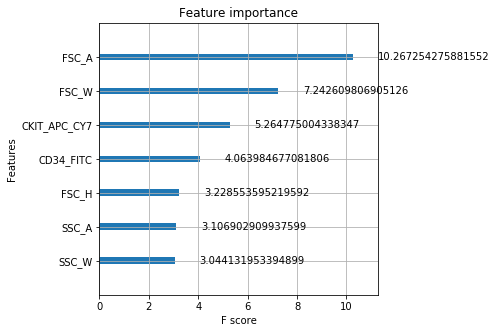

0.9066011235955056
col_0             0     1
branch_check             
0             48423   214
1               282  1142


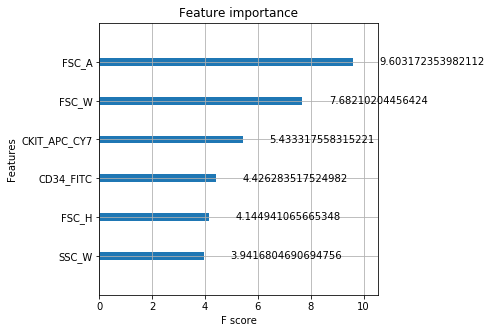

0.8019662921348315
col_0             0     1
branch_check             
0             48380   257
1               348  1076


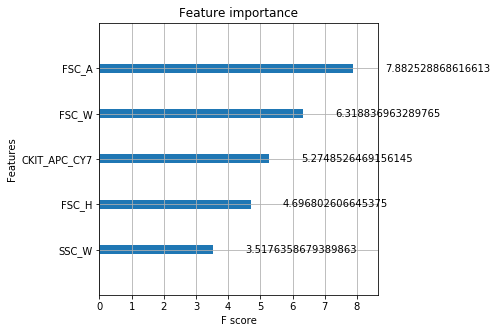

0.7556179775280899
col_0             0     1
branch_check             
0             48383   254
1               349  1075


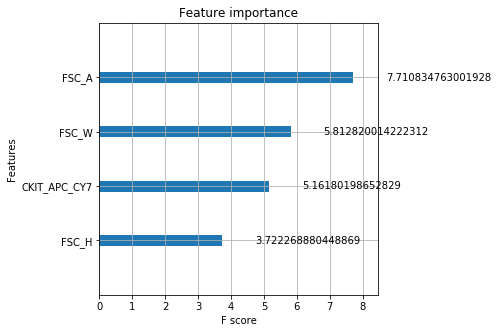

0.7549157303370787
col_0             0    1
branch_check            
0             48355  282
1               517  907


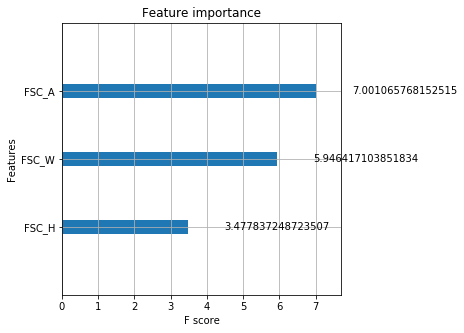

0.636938202247191
col_0             0    1
branch_check            
0             48373  264
1               516  908


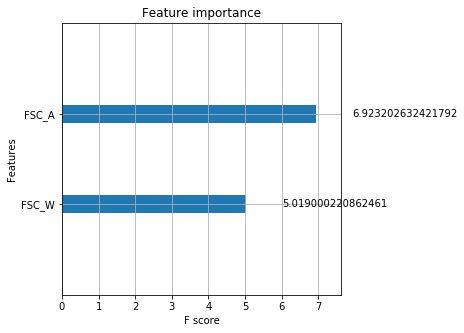

0.6376404494382022
col_0             0    1
branch_check            
0             48356  281
1               668  756


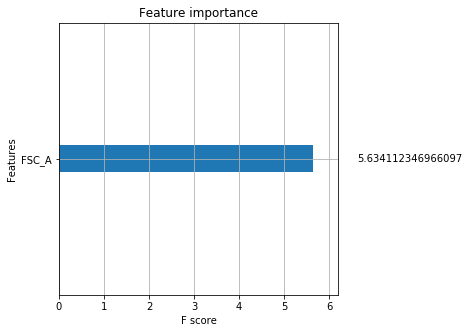

0.5308988764044944


In [192]:
out_df = {'num_par':[],'num_branch':[], 'base_score':[], 'branch_score':[]}

preds = xg_reg.predict(X_test)
# baseline_score = 0.5*num_branch + 0.5*accuracy
baseline_score = 0.5
cor = [1 if i==j==1 else 0 for i,j in zip(y_test, preds)]
tru = [1 if i==1 else 0 for i in y_test]
branch_acc = sum(cor)/sum(tru)

baseline_score += (1/2)*branch_acc
out_df['num_par'].append(16)
out_df['num_branch'].append(1)
out_df['base_score'].append(baseline_score)
out_df['branch_score'].append(branch_acc)
baseline_score

for k in range(15,0,-1):
    imp1, xg_reg1, X_test, y_test = parameter_importance_branch(df_list, dep_col_sort[:k], 'branch_check')
    base_1, branch_1, branchacc_1 = cal_score_branch(xg_reg1,X_test, y_test,8)
    print(branchacc_1)
    out_df['num_par'].append(k)
    out_df['num_branch'].append(branch_1)
    out_df['base_score'].append(base_1)
    out_df['branch_score'].append(branchacc_1)

In [193]:
out_df = pd.DataFrame(out_df)
out_df

,num_par,num_branch,base_score,branch_score
0,16,1,0.974719,0.949438
1,15,1,0.975421,0.950843
2,14,1,0.977879,0.955758
3,13,1,0.974017,0.948034
4,12,1,0.972261,0.944522
5,11,1,0.970857,0.941713
6,10,1,0.964185,0.928371
7,9,1,0.961025,0.922051
8,8,1,0.951896,0.903792
9,7,1,0.953301,0.906601


col_0             0    1
branch_check            
0             49476   42
1                53  490


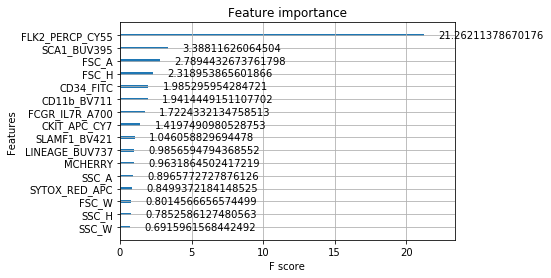

In [9]:
df_list['branch_check'] = [1 if ((i==5) & (j>158))
                           else 0 for i,j in zip(df_list.branch_id, df_list.pseudotime)]
imp, xg_reg, X_test, y_test = parameter_importance_branch(df_list, dep_col, 'branch_check')
dep_col_sort = [imp[i][0] for i in range(len(dep_col))]

col_0             0    1
branch_check            
0             49472   46
1                58  485


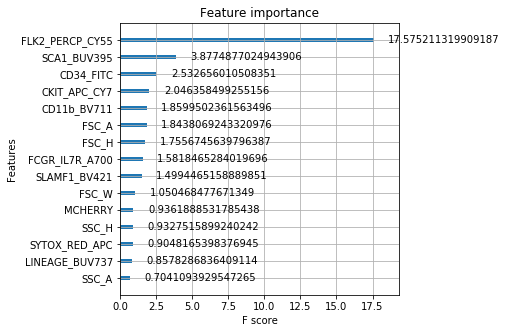

0.8931860036832413
col_0             0    1
branch_check            
0             49477   41
1                54  489


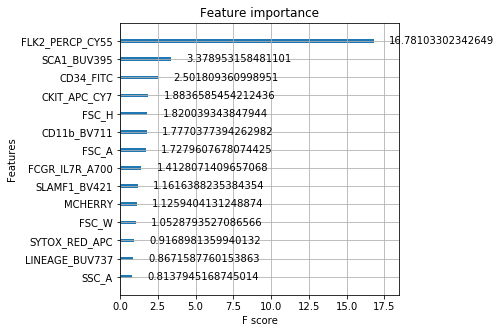

0.9005524861878453
col_0             0    1
branch_check            
0             49477   41
1                55  488


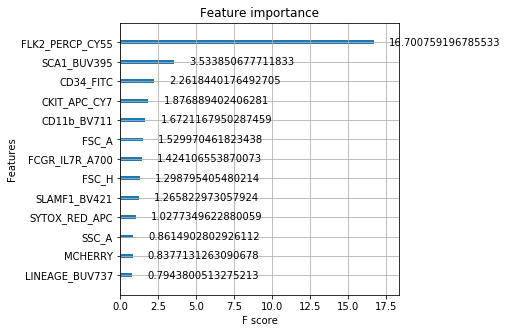

0.8987108655616943
col_0             0    1
branch_check            
0             49466   52
1                62  481


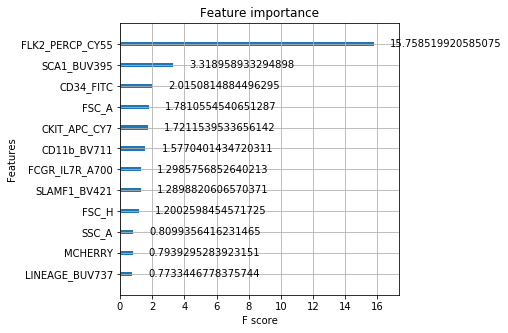

0.8858195211786372
col_0             0    1
branch_check            
0             49463   55
1                79  464


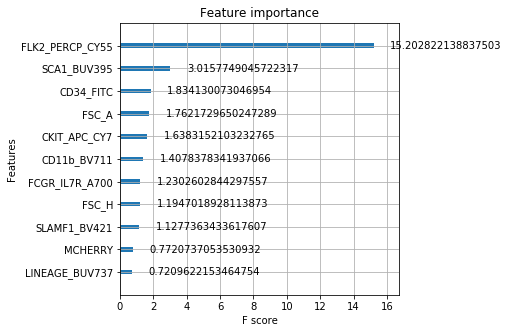

0.85451197053407
col_0             0    1
branch_check            
0             49460   58
1                83  460


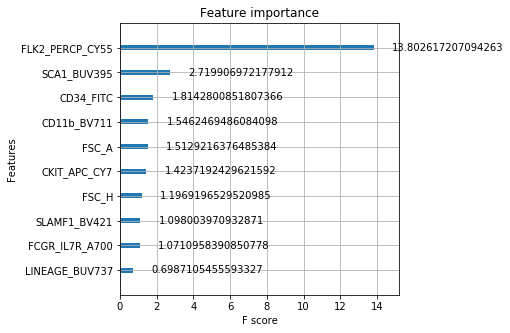

0.8471454880294659
col_0             0    1
branch_check            
0             49442   76
1               100  443


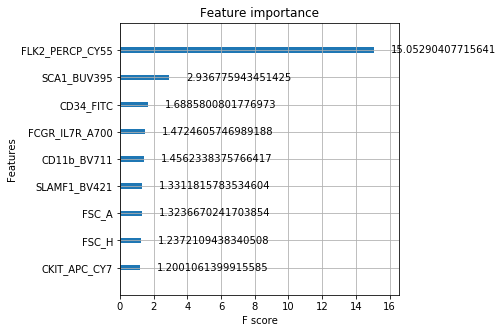

0.8158379373848987
col_0             0    1
branch_check            
0             49440   78
1                99  444


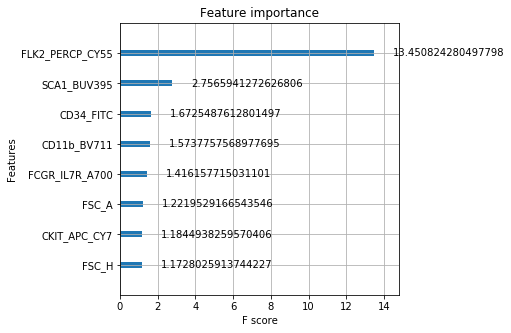

0.8176795580110497
col_0             0    1
branch_check            
0             49443   75
1               104  439


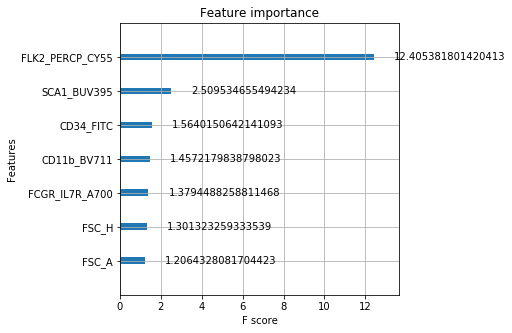

0.8084714548802947
col_0             0    1
branch_check            
0             49427   91
1               116  427


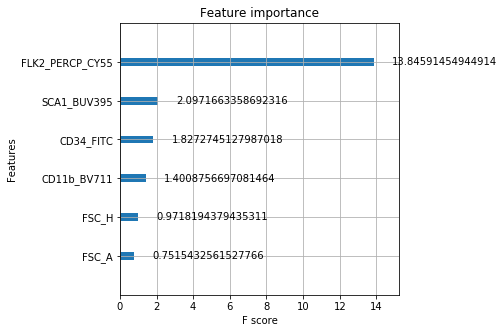

0.7863720073664825
col_0             0    1
branch_check            
0             49425   93
1               149  394


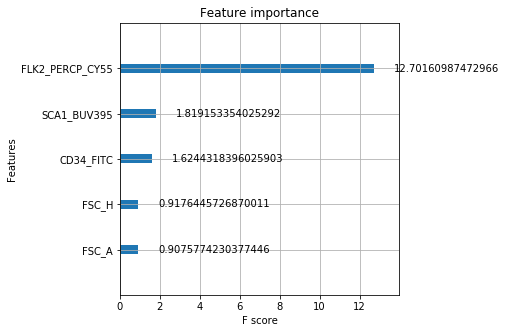

0.7255985267034991
col_0             0    1
branch_check            
0             49419   99
1               161  382


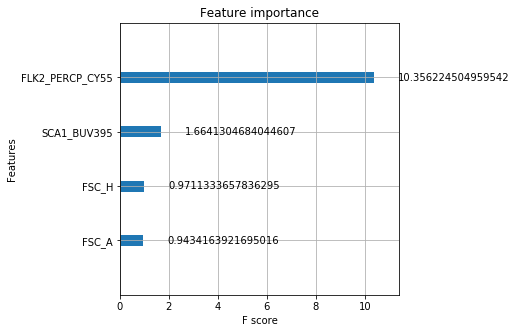

0.7034990791896869
col_0             0    1
branch_check            
0             49415  103
1               154  389


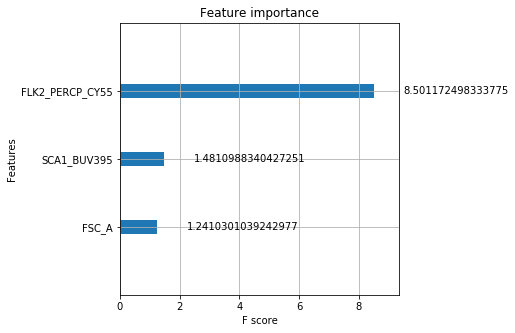

0.716390423572744
col_0             0    1
branch_check            
0             49389  129
1               179  364


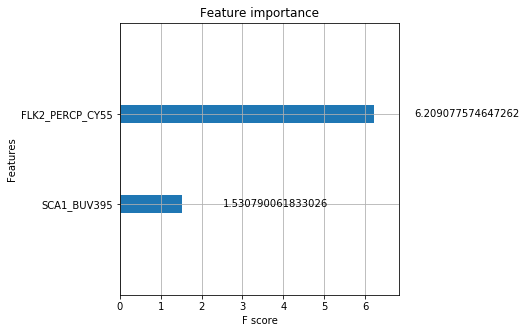

0.6703499079189686
col_0             0    1
branch_check            
0             49355  163
1               325  218


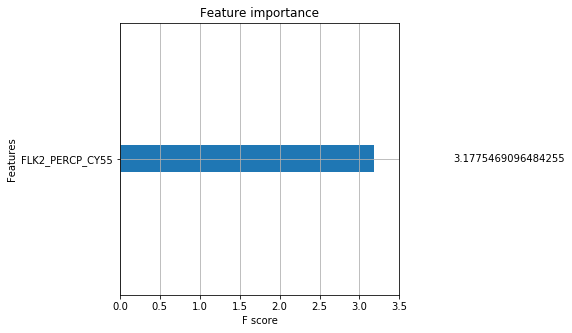

0.4014732965009208


In [10]:
out_df = {'num_par':[],'num_branch':[], 'base_score':[], 'branch_score':[]}

preds = xg_reg.predict(X_test)
# baseline_score = 0.5*num_branch + 0.5*accuracy
baseline_score = 0.5
cor = [1 if i==j==1 else 0 for i,j in zip(y_test, preds)]
tru = [1 if i==1 else 0 for i in y_test]
branch_acc = sum(cor)/sum(tru)

baseline_score += (1/2)*branch_acc
out_df['num_par'].append(16)
out_df['num_branch'].append(1)
out_df['base_score'].append(baseline_score)
out_df['branch_score'].append(branch_acc)
baseline_score

for k in range(15,0,-1):
    imp1, xg_reg1, X_test, y_test = parameter_importance_branch(df_list, dep_col_sort[:k], 'branch_check')
    base_1, branch_1, branchacc_1 = cal_score_branch(xg_reg1,X_test, y_test,8)
    print(branchacc_1)
    out_df['num_par'].append(k)
    out_df['num_branch'].append(branch_1)
    out_df['base_score'].append(base_1)
    out_df['branch_score'].append(branchacc_1)

In [11]:
out_df = pd.DataFrame(out_df)
out_df

,num_par,num_branch,base_score,branch_score
0,16,1,0.951197,0.902394
1,15,1,0.946593,0.893186
2,14,1,0.950276,0.900552
3,13,1,0.949355,0.898711
4,12,1,0.942910,0.885820
5,11,1,0.927256,0.854512
6,10,1,0.923573,0.847145
7,9,1,0.907919,0.815838
8,8,1,0.908840,0.817680
9,7,1,0.904236,0.808471


col_0             0     1
branch_check             
0             48620    72
1                72  1297


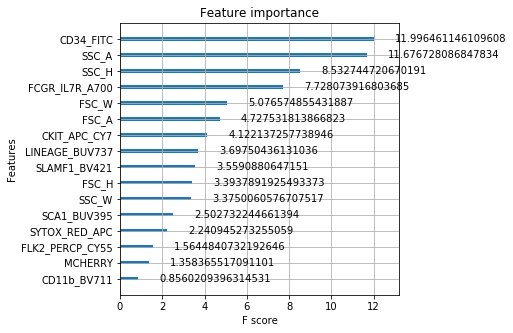

In [16]:
df_list['branch_check'] = [1 if ((i==3) & (j>175))
                           else 0 for i,j in zip(df_list.branch_id, df_list.pseudotime)]
imp, xg_reg, X_test, y_test = parameter_importance_branch(df_list, dep_col, 'branch_check')
dep_col_sort = [imp[i][0] for i in range(len(dep_col))]

col_0             0     1
branch_check             
0             48617    75
1                85  1284


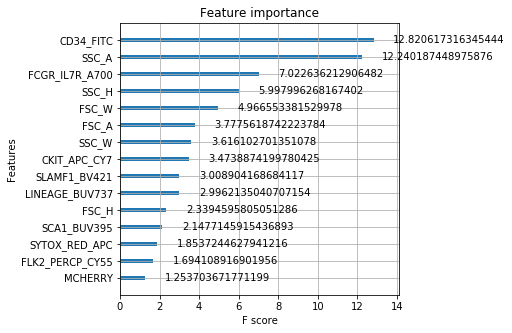

0.9379108838568299
col_0             0     1
branch_check             
0             48618    74
1                79  1290


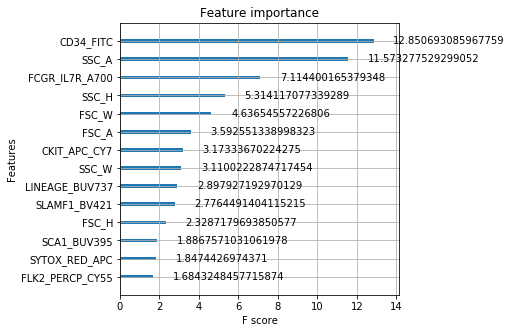

0.9422936449963477
col_0             0     1
branch_check             
0             48609    83
1                98  1271


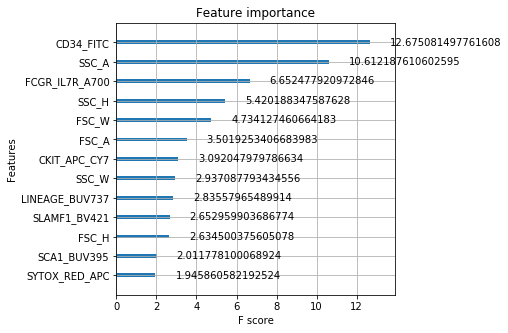

0.9284149013878744
col_0             0     1
branch_check             
0             48590   102
1               122  1247


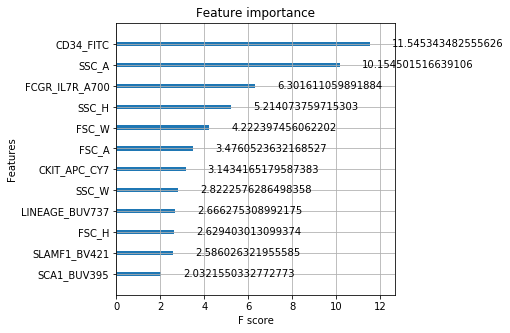

0.9108838568298028
col_0             0     1
branch_check             
0             48576   116
1               118  1251


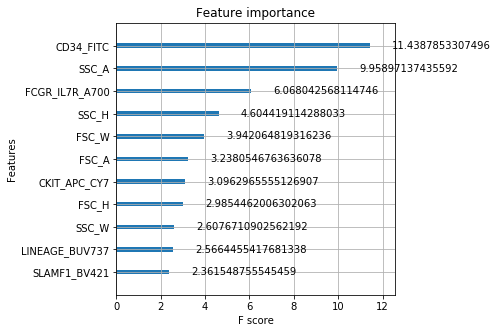

0.9138056975894814
col_0             0     1
branch_check             
0             48574   118
1               114  1255


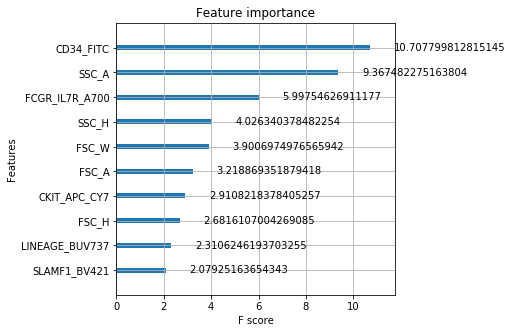

0.91672753834916
col_0             0     1
branch_check             
0             48572   120
1               140  1229


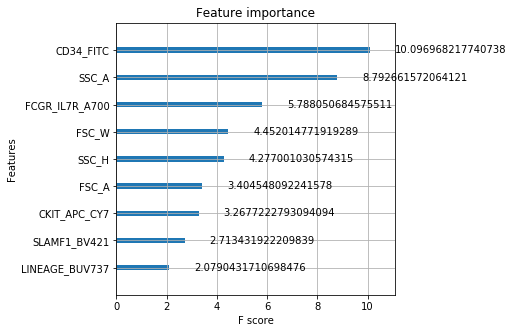

0.8977355734112491
col_0             0     1
branch_check             
0             48576   116
1               147  1222


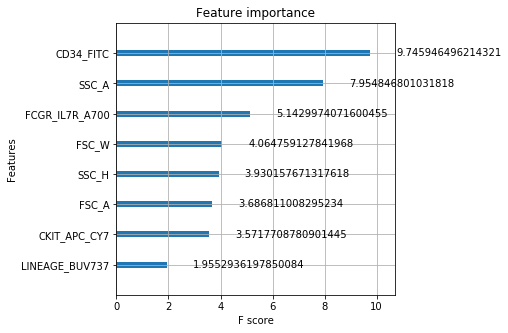

0.8926223520818115
col_0             0     1
branch_check             
0             48538   154
1               194  1175


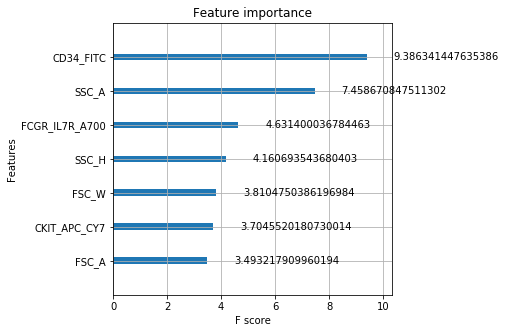

0.8582907231555881
col_0             0     1
branch_check             
0             48476   216
1               306  1063


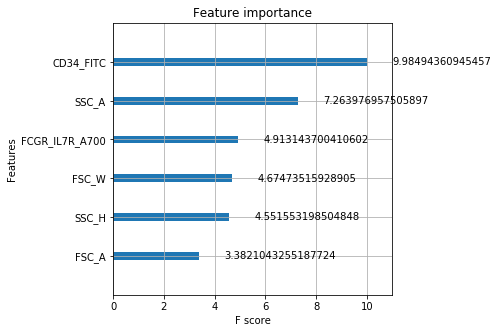

0.7764791818845873
col_0             0     1
branch_check             
0             48445   247
1               347  1022


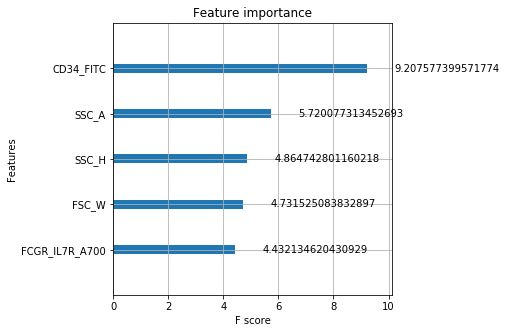

0.7465303140978816
col_0             0    1
branch_check            
0             48404  288
1               421  948


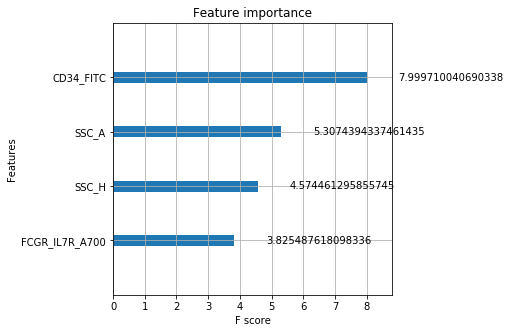

0.6924762600438276
col_0             0    1
branch_check            
0             48358  334
1               538  831


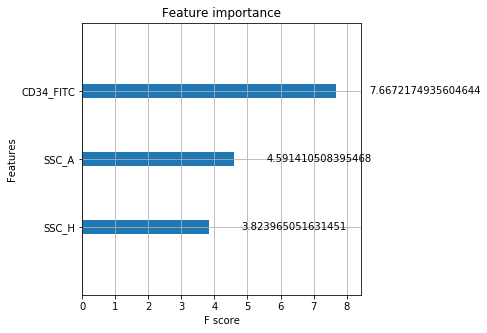

0.6070124178232287
col_0             0    1
branch_check            
0             48379  313
1               552  817


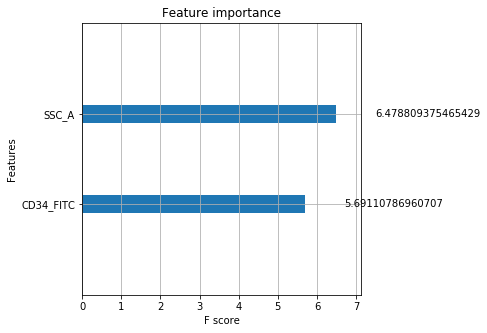

0.5967859751643535
col_0             0    1
branch_check            
0             48487  205
1               980  389


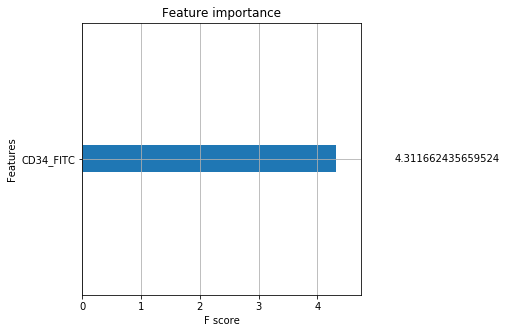

0.2841490138787436


In [17]:
out_df = {'num_par':[],'num_branch':[], 'base_score':[], 'branch_score':[]}

preds = xg_reg.predict(X_test)
# baseline_score = 0.5*num_branch + 0.5*accuracy
baseline_score = 0.5
cor = [1 if i==j==1 else 0 for i,j in zip(y_test, preds)]
tru = [1 if i==1 else 0 for i in y_test]
branch_acc = sum(cor)/sum(tru)

baseline_score += (1/2)*branch_acc
out_df['num_par'].append(16)
out_df['num_branch'].append(1)
out_df['base_score'].append(baseline_score)
out_df['branch_score'].append(branch_acc)
baseline_score

for k in range(15,0,-1):
    imp1, xg_reg1, X_test, y_test = parameter_importance_branch(df_list, dep_col_sort[:k], 'branch_check')
    base_1, branch_1, branchacc_1 = cal_score_branch(xg_reg1,X_test, y_test,8)
    print(branchacc_1)
    out_df['num_par'].append(k)
    out_df['num_branch'].append(branch_1)
    out_df['base_score'].append(base_1)
    out_df['branch_score'].append(branchacc_1)

In [18]:
out_df = pd.DataFrame(out_df)
out_df

,num_par,num_branch,base_score,branch_score
0,16,1,0.973703,0.947407
1,15,1,0.968955,0.937911
2,14,1,0.971147,0.942294
3,13,1,0.964207,0.928415
4,12,1,0.955442,0.910884
5,11,1,0.956903,0.913806
6,10,1,0.958364,0.916728
7,9,1,0.948868,0.897736
8,8,1,0.946311,0.892622
9,7,1,0.929145,0.858291


col_0             0    1
branch_check            
0             49087   71
1               224  679


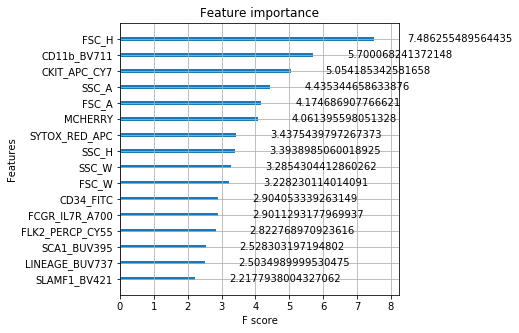

In [23]:
df_list['branch_check'] = [1 if ((i==6) & (j>200))
                           else 0 for i,j in zip(df_list.branch_id, df_list.pseudotime)]
imp, xg_reg, X_test, y_test = parameter_importance_branch(df_list, dep_col, 'branch_check')
dep_col_sort = [imp[i][0] for i in range(len(dep_col))]

col_0             0    1
branch_check            
0             49081   77
1               231  672


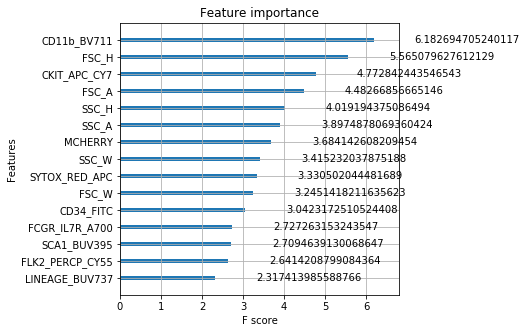

0.7441860465116279
col_0             0    1
branch_check            
0             49077   81
1               253  650


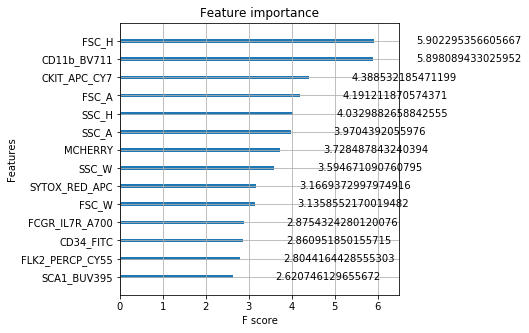

0.7198228128460686
col_0             0    1
branch_check            
0             49083   75
1               279  624


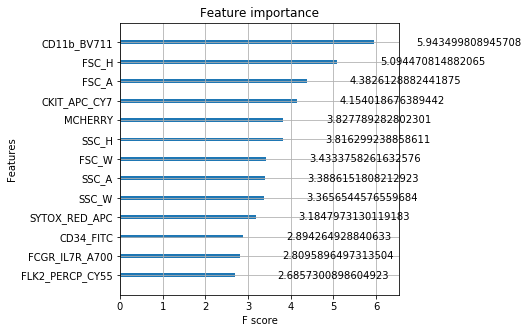

0.6910299003322259
col_0             0    1
branch_check            
0             49084   74
1               304  599


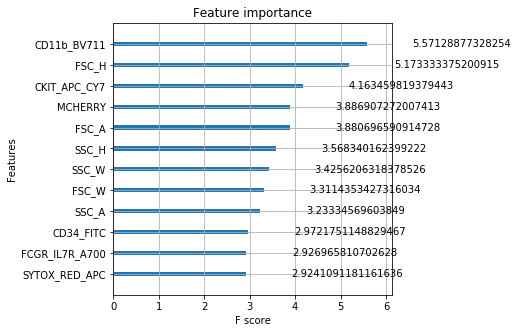

0.6633444075304541
col_0             0    1
branch_check            
0             49058  100
1               351  552


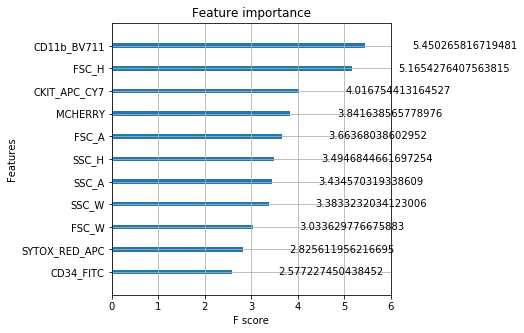

0.6112956810631229
col_0             0    1
branch_check            
0             49041  117
1               376  527


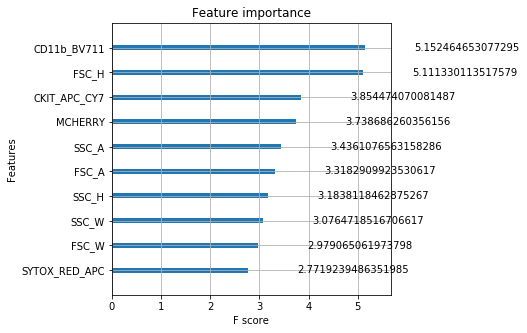

0.583610188261351
col_0             0    1
branch_check            
0             49037  121
1               420  483


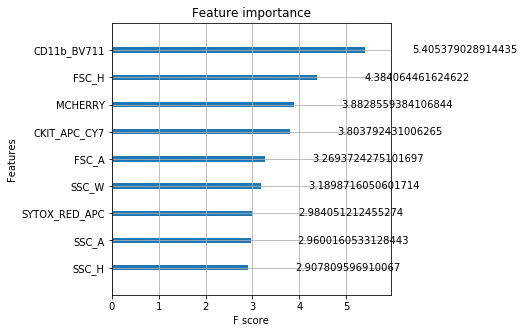

0.5348837209302325
col_0             0    1
branch_check            
0             49042  116
1               448  455


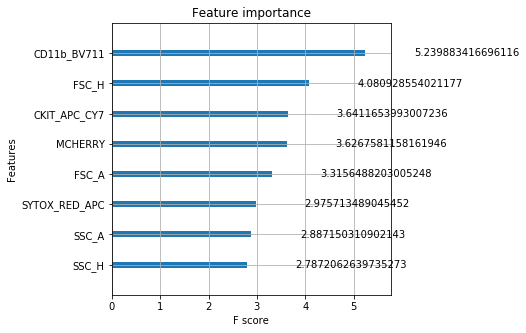

0.5038759689922481
col_0             0    1
branch_check            
0             49059   99
1               435  468


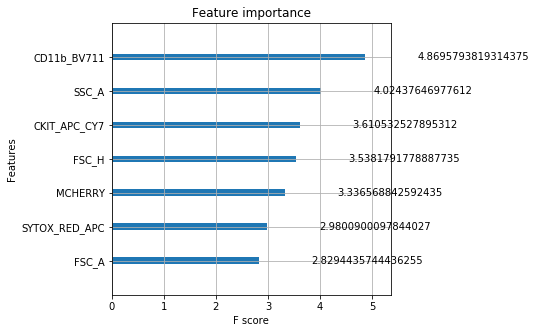

0.5182724252491694
col_0             0    1
branch_check            
0             49028  130
1               593  310


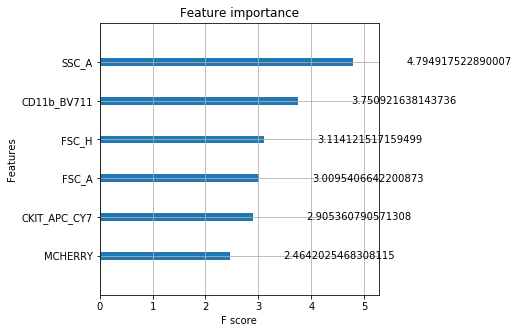

0.3433001107419712
col_0             0    1
branch_check            
0             49024  134
1               694  209


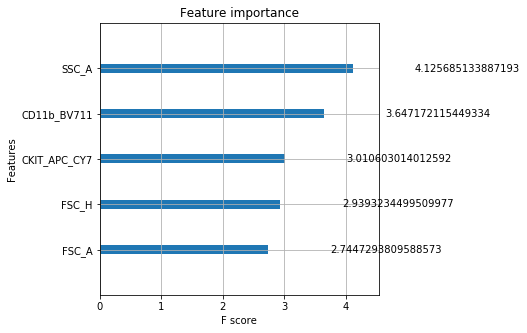

0.23145071982281284
col_0             0    1
branch_check            
0             49013  145
1               703  200


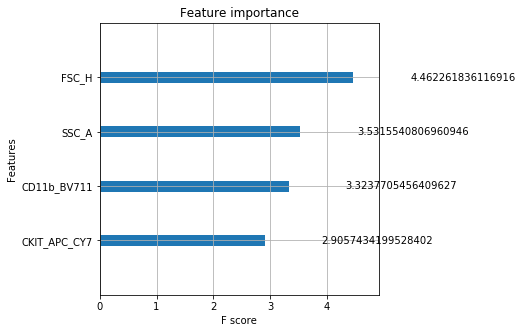

0.22148394241417496
col_0             0    1
branch_check            
0             49131   27
1               772  131


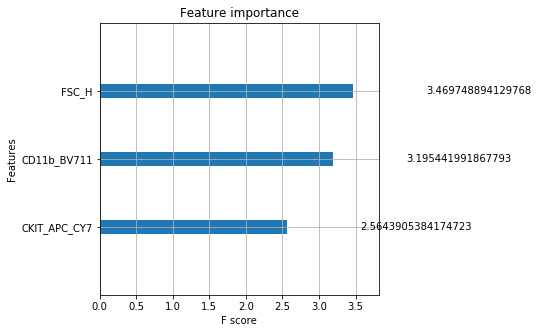

0.1450719822812846
col_0             0   1
branch_check           
0             49139  19
1               898   5


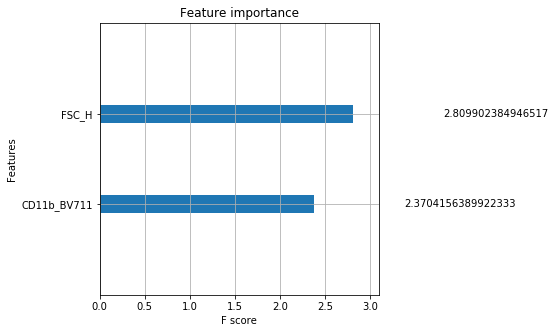

0.005537098560354375
col_0             0  1
branch_check          
0             49156  2
1               902  1


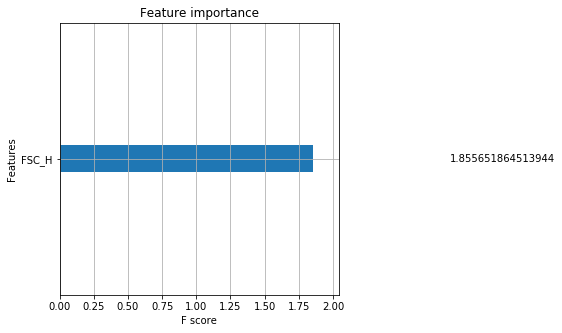

0.0011074197120708748


In [24]:
out_df = {'num_par':[],'num_branch':[], 'base_score':[], 'branch_score':[]}

preds = xg_reg.predict(X_test)
# baseline_score = 0.5*num_branch + 0.5*accuracy
baseline_score = 0.5
cor = [1 if i==j==1 else 0 for i,j in zip(y_test, preds)]
tru = [1 if i==1 else 0 for i in y_test]
branch_acc = sum(cor)/sum(tru)

baseline_score += (1/2)*branch_acc
out_df['num_par'].append(16)
out_df['num_branch'].append(1)
out_df['base_score'].append(baseline_score)
out_df['branch_score'].append(branch_acc)
baseline_score

for k in range(15,0,-1):
    imp1, xg_reg1, X_test, y_test = parameter_importance_branch(df_list, dep_col_sort[:k], 'branch_check')
    base_1, branch_1, branchacc_1 = cal_score_branch(xg_reg1,X_test, y_test,8)
    print(branchacc_1)
    out_df['num_par'].append(k)
    out_df['num_branch'].append(branch_1)
    out_df['base_score'].append(base_1)
    out_df['branch_score'].append(branchacc_1)

In [25]:
out_df = pd.DataFrame(out_df)
out_df

,num_par,num_branch,base_score,branch_score
0,16,1,0.875969,0.751938
1,15,1,0.872093,0.744186
2,14,1,0.859911,0.719823
3,13,1,0.845515,0.691030
4,12,1,0.831672,0.663344
5,11,1,0.805648,0.611296
6,10,1,0.791805,0.583610
7,9,1,0.767442,0.534884
8,8,1,0.751938,0.503876
9,7,1,0.759136,0.518272


col_0             0    1
branch_check            
0             49043   27
1                39  952


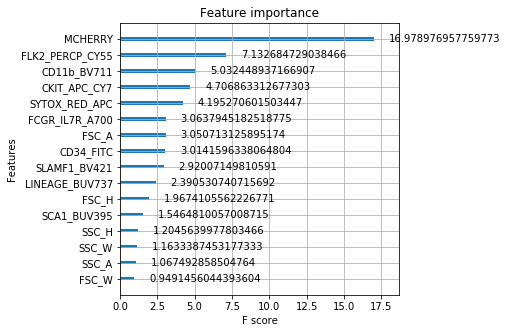

In [28]:
df_list['branch_check'] = [1 if ((i==1) & (j>250))
                           else 0 for i,j in zip(df_list.branch_id, df_list.pseudotime)]
imp, xg_reg, X_test, y_test = parameter_importance_branch(df_list, dep_col, 'branch_check')
dep_col_sort = [imp[i][0] for i in range(len(dep_col))]

col_0             0    1
branch_check            
0             49040   30
1                37  954


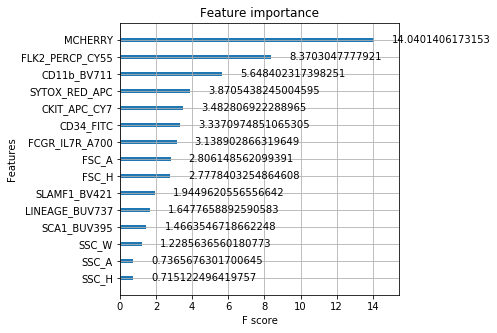

0.9626639757820383
col_0             0    1
branch_check            
0             49039   31
1                42  949


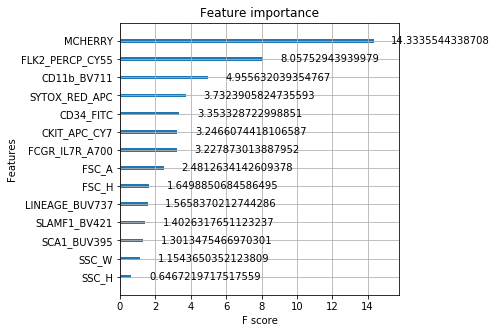

0.9576185671039354
col_0             0    1
branch_check            
0             49029   41
1                49  942


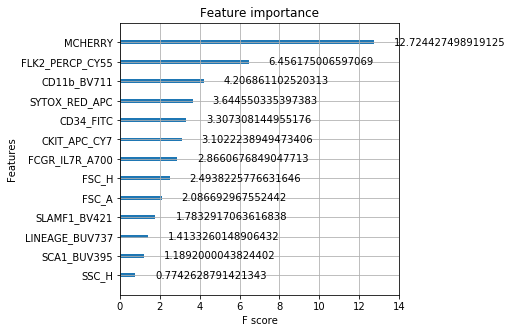

0.9505549949545913
col_0             0    1
branch_check            
0             49025   45
1                50  941


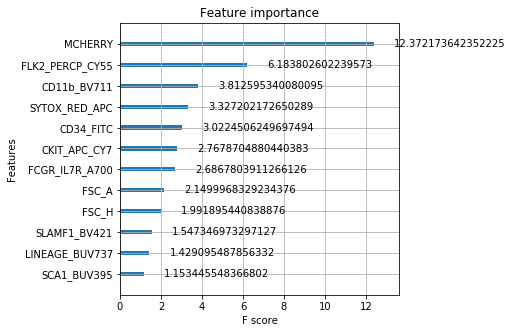

0.9495459132189707
col_0             0    1
branch_check            
0             49027   43
1                42  949


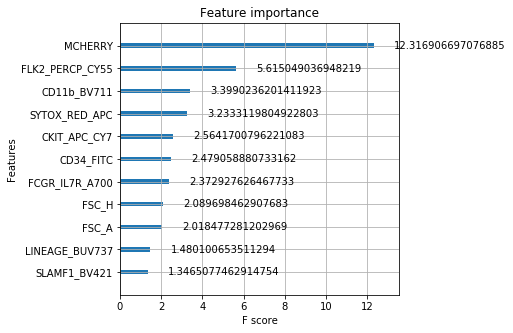

0.9576185671039354
col_0             0    1
branch_check            
0             49020   50
1                49  942


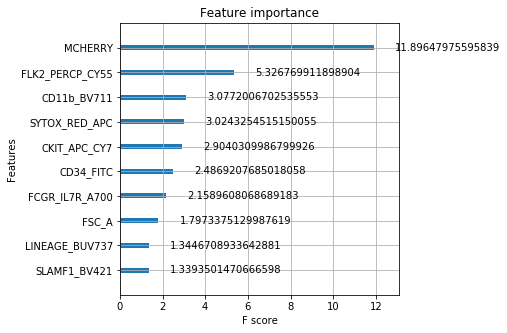

0.9505549949545913
col_0             0    1
branch_check            
0             49022   48
1                65  926


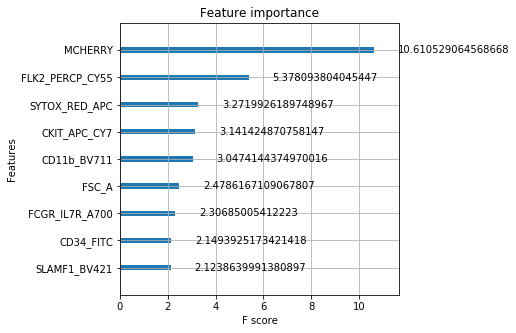

0.934409687184662
col_0             0    1
branch_check            
0             49018   52
1                68  923


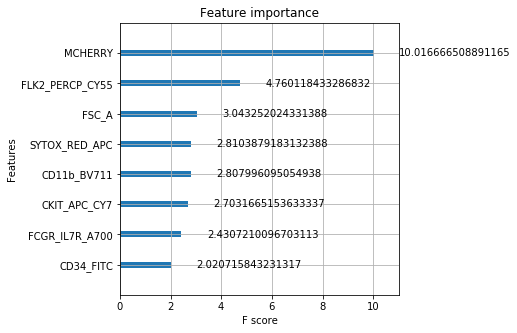

0.9313824419778002
col_0             0    1
branch_check            
0             49021   49
1                61  930


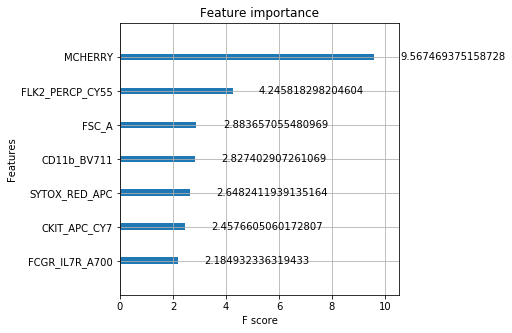

0.9384460141271443
col_0             0    1
branch_check            
0             49007   63
1                94  897


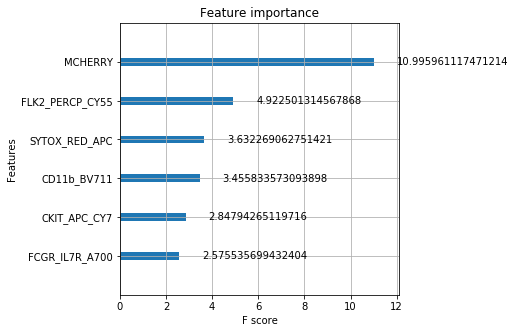

0.905146316851665
col_0             0    1
branch_check            
0             48953  117
1               139  852


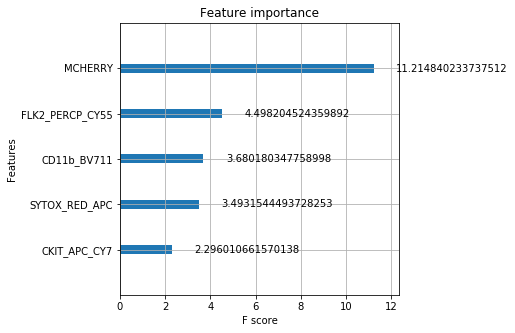

0.8597376387487387
col_0             0    1
branch_check            
0             48940  130
1               166  825


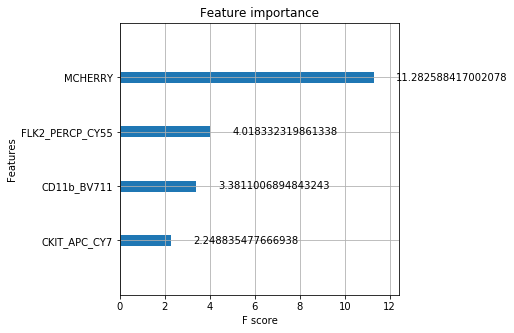

0.8324924318869829
col_0             0    1
branch_check            
0             48939  131
1               168  823


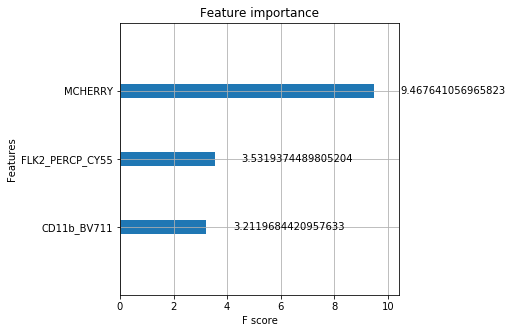

0.8304742684157417
col_0             0    1
branch_check            
0             48918  152
1               219  772


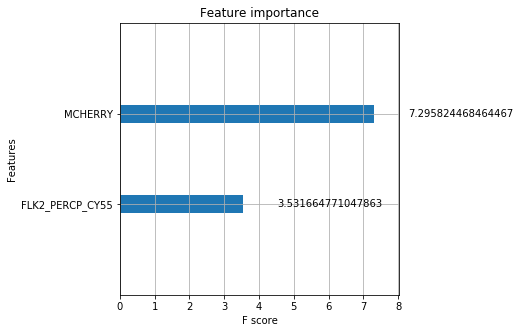

0.7790110998990918
col_0             0    1
branch_check            
0             48834  236
1               343  648


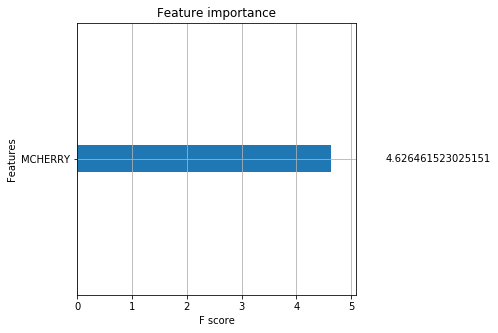

0.6538849646821393


In [29]:
out_df = {'num_par':[],'num_branch':[], 'base_score':[], 'branch_score':[]}

preds = xg_reg.predict(X_test)
# baseline_score = 0.5*num_branch + 0.5*accuracy
baseline_score = 0.5
cor = [1 if i==j==1 else 0 for i,j in zip(y_test, preds)]
tru = [1 if i==1 else 0 for i in y_test]
branch_acc = sum(cor)/sum(tru)

baseline_score += (1/2)*branch_acc
out_df['num_par'].append(16)
out_df['num_branch'].append(1)
out_df['base_score'].append(baseline_score)
out_df['branch_score'].append(branch_acc)
baseline_score

for k in range(15,0,-1):
    imp1, xg_reg1, X_test, y_test = parameter_importance_branch(df_list, dep_col_sort[:k], 'branch_check')
    base_1, branch_1, branchacc_1 = cal_score_branch(xg_reg1,X_test, y_test,8)
    print(branchacc_1)
    out_df['num_par'].append(k)
    out_df['num_branch'].append(branch_1)
    out_df['base_score'].append(base_1)
    out_df['branch_score'].append(branchacc_1)

In [30]:
out_df = pd.DataFrame(out_df)
out_df

,num_par,num_branch,base_score,branch_score
0,16,1,0.980323,0.960646
1,15,1,0.981332,0.962664
2,14,1,0.978809,0.957619
3,13,1,0.975277,0.950555
4,12,1,0.974773,0.949546
5,11,1,0.978809,0.957619
6,10,1,0.975277,0.950555
7,9,1,0.967205,0.934410
8,8,1,0.965691,0.931382
9,7,1,0.969223,0.938446


col_0             0    1
branch_check            
0             49525   21
1                18  497


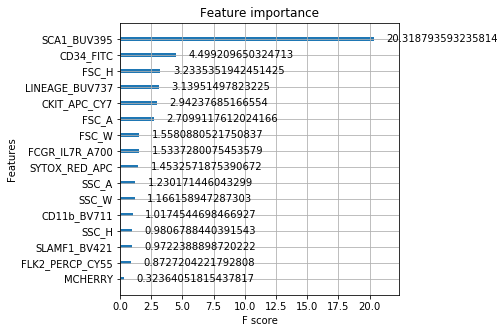

In [34]:
df_list['branch_check'] = [1 if ((i==4) & (j>250))
                           else 0 for i,j in zip(df_list.branch_id, df_list.pseudotime)]
imp, xg_reg, X_test, y_test = parameter_importance_branch(df_list, dep_col, 'branch_check')
dep_col_sort = [imp[i][0] for i in range(len(dep_col))]

col_0             0    1
branch_check            
0             49530   16
1                19  496


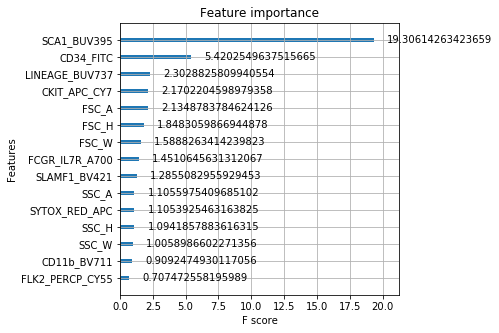

0.9631067961165048
col_0             0    1
branch_check            
0             49527   19
1                20  495


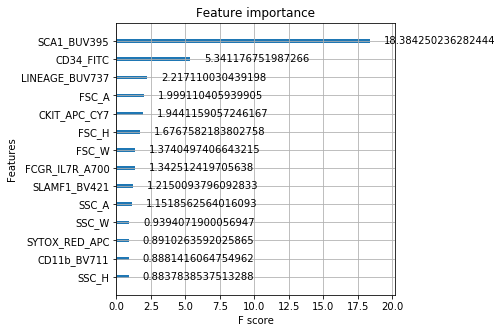

0.9611650485436893
col_0             0    1
branch_check            
0             49529   17
1                21  494


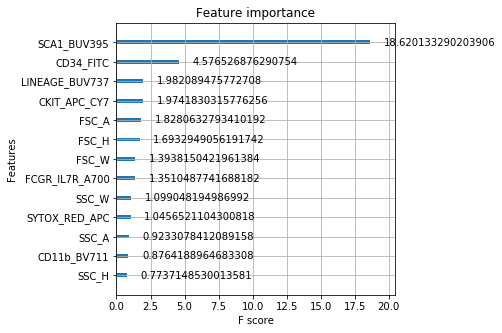

0.9592233009708738
col_0             0    1
branch_check            
0             49527   19
1                18  497


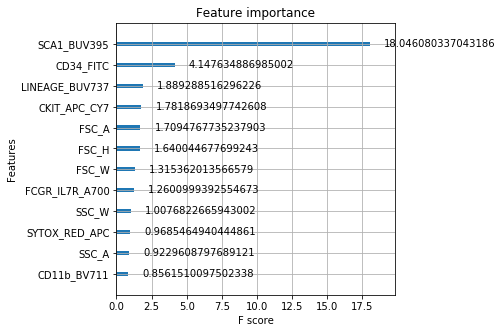

0.9650485436893204
col_0             0    1
branch_check            
0             49525   21
1                19  496


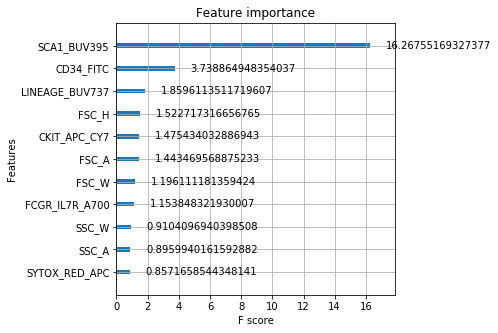

0.9631067961165048
col_0             0    1
branch_check            
0             49518   28
1                24  491


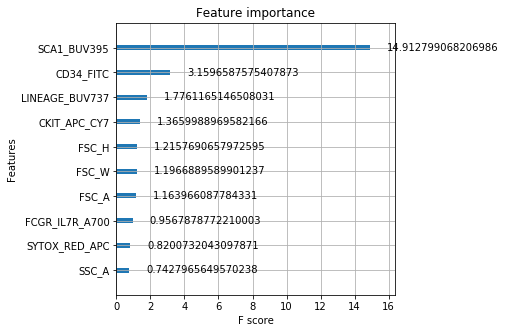

0.9533980582524272
col_0             0    1
branch_check            
0             49516   30
1                29  486


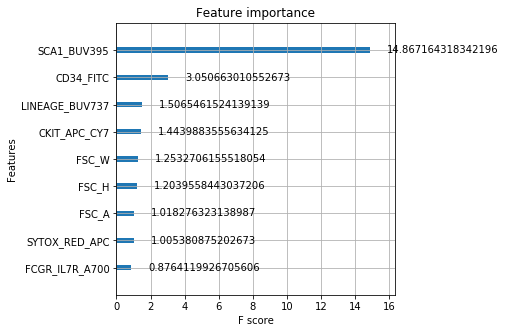

0.9436893203883495
col_0             0    1
branch_check            
0             49517   29
1                29  486


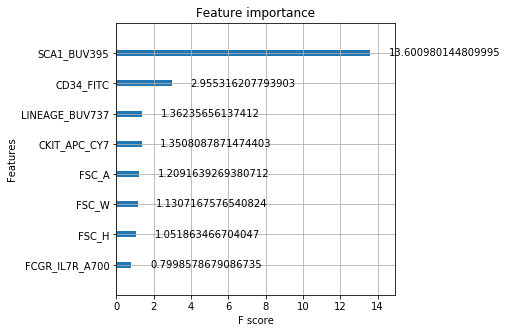

0.9436893203883495
col_0             0    1
branch_check            
0             49512   34
1                29  486


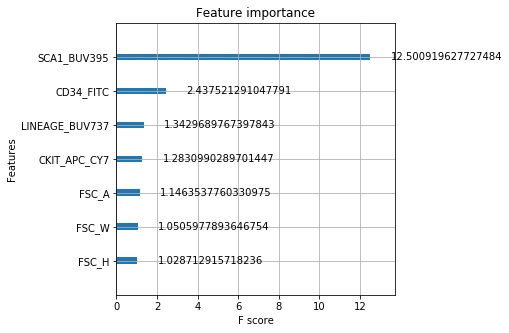

0.9436893203883495
col_0             0    1
branch_check            
0             49498   48
1                47  468


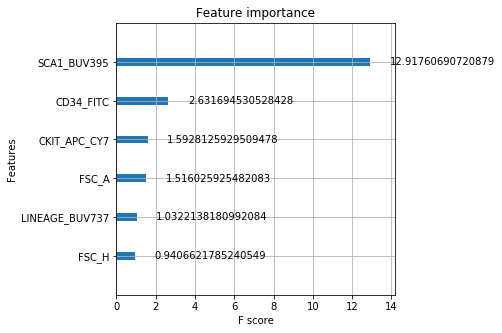

0.9087378640776699
col_0             0    1
branch_check            
0             49494   52
1                42  473


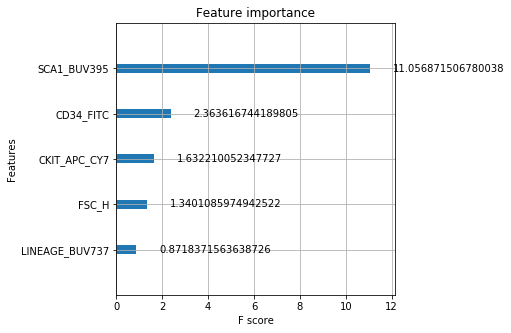

0.9184466019417475
col_0             0    1
branch_check            
0             49494   52
1                40  475


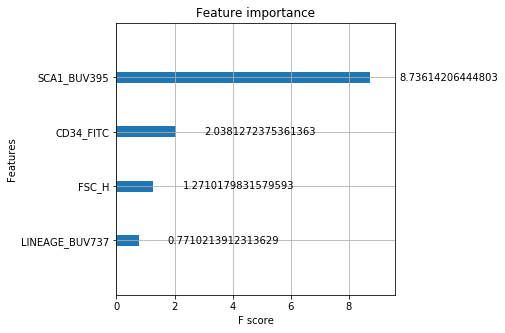

0.9223300970873787
col_0             0    1
branch_check            
0             49451   95
1                66  449


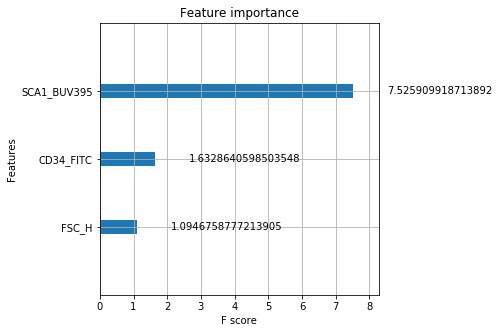

0.8718446601941747
col_0             0    1
branch_check            
0             49441  105
1                71  444


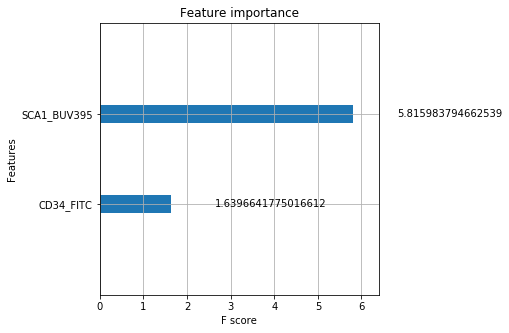

0.8621359223300971
col_0             0    1
branch_check            
0             49298  248
1               125  390


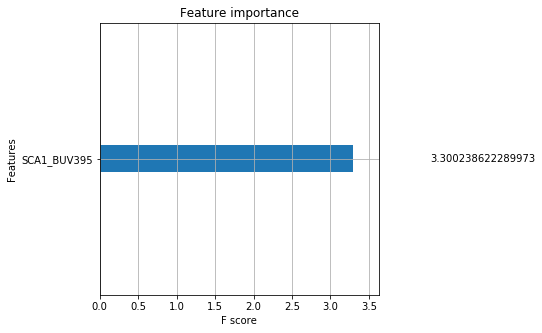

0.7572815533980582


In [35]:
out_df = {'num_par':[],'num_branch':[], 'base_score':[], 'branch_score':[]}

preds = xg_reg.predict(X_test)
# baseline_score = 0.5*num_branch + 0.5*accuracy
baseline_score = 0.5
cor = [1 if i==j==1 else 0 for i,j in zip(y_test, preds)]
tru = [1 if i==1 else 0 for i in y_test]
branch_acc = sum(cor)/sum(tru)

baseline_score += (1/2)*branch_acc
out_df['num_par'].append(16)
out_df['num_branch'].append(1)
out_df['base_score'].append(baseline_score)
out_df['branch_score'].append(branch_acc)
baseline_score

for k in range(15,0,-1):
    imp1, xg_reg1, X_test, y_test = parameter_importance_branch(df_list, dep_col_sort[:k], 'branch_check')
    base_1, branch_1, branchacc_1 = cal_score_branch(xg_reg1,X_test, y_test,8)
    print(branchacc_1)
    out_df['num_par'].append(k)
    out_df['num_branch'].append(branch_1)
    out_df['base_score'].append(base_1)
    out_df['branch_score'].append(branchacc_1)

In [36]:
out_df = pd.DataFrame(out_df)
out_df

,num_par,num_branch,base_score,branch_score
0,16,1,0.982524,0.965049
1,15,1,0.981553,0.963107
2,14,1,0.980583,0.961165
3,13,1,0.979612,0.959223
4,12,1,0.982524,0.965049
5,11,1,0.981553,0.963107
6,10,1,0.976699,0.953398
7,9,1,0.971845,0.943689
8,8,1,0.971845,0.943689
9,7,1,0.971845,0.943689


# Trying UMAP

In [9]:
fit = umap.UMAP(
        n_neighbors=100,
#         min_dist=min_dist,
        n_components=3,
#         metric=metric
    )
u = fit.fit_transform(X_input)

In [10]:
fit = umap.UMAP(
        n_neighbors=100,
#         min_dist=min_dist,
        n_components=3,
#         metric=metric
    )
u3 = fit.fit_transform(X_input)

In [11]:
save_path

'../../output/mg3/'

In [13]:
from matplotlib import cm
import matplotlib as mpl
red = cm.get_cmap('Reds', 9)
blue = cm.get_cmap('Blues', 9)
cmap_t = mpl.colors.ListedColormap(np.concatenate([red(np.linspace(1, 0, 3)),blue(np.linspace(0, 1, 2))]))
Y_phate_3d = np.load(save_path + "phate3d_full.npy")
scprep.plot.rotate_scatter3d(u3,c=df_list.id.astype(int).values,filename = save_path+"/umap_full.gif", figsize=(15,10),  cmap=cmap_t,ticks=False, label_prefix="PHATE")
plt.close("all")

In [14]:
Y_phate_3d = np.load(save_path + "phate3d_full.npy")

temp1 = {}
temp1["x"] = u3[:,0]
temp1["y"] = u3[:,1]
temp1["z"] = u3[:,2]
temp1["cid"] = df_list.id
temp1 = pd.DataFrame(temp1)
from sklearn.preprocessing import MinMaxScaler
import json
scaler = MinMaxScaler( feature_range=( -100, 100 ))
temp1[[ 'x', 'y', 'z' ]] = scaler.fit_transform( temp1[[ 'x', 'y', 'z' ]])

d_json = { 'points': json.loads( temp1.astype( str ).to_json( None, orient= 'records' )) }
json.dump( d_json, open(save_path + "data.json", 'w' ))

In [15]:
Y_phate_3d = np.load(save_path + "phate3d_full.npy")

In [16]:
Y_phate_3d = np.load(save_path + "phate3d_full.npy")

temp1 = {}
temp1["x"] = Y_phate_3d[:,0]
temp1["y"] = Y_phate_3d[:,1]
temp1["z"] = Y_phate_3d[:,2]
temp1["cid"] = df_list.id
temp1 = pd.DataFrame(temp1)
from sklearn.preprocessing import MinMaxScaler
import json
scaler = MinMaxScaler( feature_range=( -100, 100 ))
temp1[[ 'x', 'y', 'z' ]] = scaler.fit_transform( temp1[[ 'x', 'y', 'z' ]])

d_json = { 'points': json.loads( temp1.astype( str ).to_json( None, orient= 'records' )) }
json.dump( d_json, open(save_path + "data.json", 'w' ))

Text(0.5, 1.0, 'UMAP projection of the Penguin dataset')

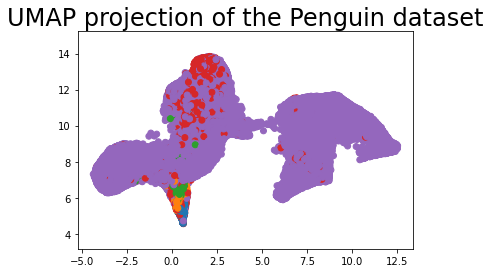

In [24]:
import seaborn as sns
plt.scatter(
    u3[:, 1],
    u3[:, 2],
    c=[sns.color_palette()[int(x)] for x in df_list.id])
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the Penguin dataset', fontsize=24)

Text(0.5, 1.0, 'UMAP projection of the Penguin dataset')

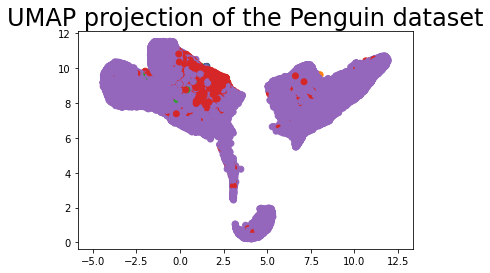

In [25]:
import seaborn as sns
plt.scatter(
    u[:, 1],
    u[:, 0],
    c=[sns.color_palette()[int(x)] for x in df_list.id])
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the Penguin dataset', fontsize=24)

In [2]:
import open3d as o3d
import numpy as np

from pc_skeletor import Dataset
downloader = Dataset()
trunk_pcd_path, branch_pcd_path = downloader.download_semantic_tree_dataset()

pcd_trunk = o3d.io.read_point_cloud(trunk_pcd_path)
pcd_branch = o3d.io.read_point_cloud(branch_pcd_path)
pcd = pcd_trunk + pcd_branch

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


semantic_tree.zip: 49.2MB [00:23, 2.12MB/s]                                                                                                                                                                        


Extracting all the files now...
Done!


In [8]:
pcd

PointCloud with 1787655 points.

In [9]:
np.asarray(pcd.points)

array([[-0.836566  , -0.00463682,  2.74531   ],
       [-0.827904  , -0.0151848 ,  2.74652   ],
       [-0.674217  ,  0.103157  ,  2.01738   ],
       ...,
       [-0.39122   ,  0.292305  ,  1.96108   ],
       [-0.355139  ,  0.274373  ,  1.9539    ],
       [-0.502215  , -0.189531  ,  0.454976  ]])